In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import ttest_ind
from sklearn.metrics import r2_score
from scipy.stats import pearsonr, spearmanr
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.patches as mpatches
from scipy.stats import ttest_ind, ttest_1samp, ttest_rel
import matplotlib as mpl
import umap
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from joblib import Parallel, delayed
from tqdm.notebook import tqdm
import pickle
import matplotlib.ticker as mtick
import math
from itertools import combinations
import random
from sklearn.linear_model import LinearRegression
import qgrid

In [3]:
plt.rcParams['font.family'] = 'Helvetica'
plt.rcParams["axes.labelweight"] = "bold"
plt.rcParams['font.size'] = 18
plt.rcParams['axes.linewidth'] = 2
plt.rcParams['figure.figsize'] = (10.0, 7.0)
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42
sns.set_palette("Dark2")

In [4]:
seed = 42

# load data

In [5]:
drug_df = pd.read_csv("../../data/drug/drug_final_processed_eg_id.csv.gz", low_memory=False)

In [6]:
colour_list = pd.read_csv('../../data/colour_list.txt',header=None)[0].tolist()

In [7]:
protein_ruv = pd.read_csv(
    "../../data/protein/E0022_P06_Protein_Matrix_ProNorM_no_control_update.txt",
    sep='\t').set_index('Cell_line')

meta = pd.read_csv('../../data/E0022_P06_final_sample_map_no_control.txt',
                   sep='\t').set_index('Cell_line')

In [7]:
cell_lines_no_blood = meta[meta['Tissue_type']!='Haematopoietic and Lymphoid'].index.values

In [8]:
tissue_type_map = meta[['Tissue_type']].to_dict()['Tissue_type']
cancer_type_map = meta[['Cancer_type']].to_dict()['Cancer_type']
batch_map = meta[['Batch']].to_dict()['Batch']
instrument_map = meta[['Instrument']].to_dict()['Instrument']


In [9]:
cancer_colours = dict(
    zip(meta['Cancer_type'].unique(),
        colour_list[:meta['Cancer_type'].unique().size]))

tissue_colours = dict(
    zip(meta['Tissue_type'].unique(),
        colour_list[:meta['Tissue_type'].unique().size]))

instrument_colours={
    'M01':'#66c2a5', 
    'M02':'#fc8d62', 
    'M03':'#8da0cb', 
    'M04':'#e78ac3', 
    'M05':'#a6d854', 
    'M06':'#ffd92f'
}

batch_colours={
    'P01':'#7fc97f', 
    'P02':'#beaed4', 
    'P03':'#fdc086', 
    'P04':'#386cb0', 
    'P05':'#f0027f', 
    'P06':'#bf5b17'
}

tissue_colours['Other'] = 'white'
cancer_colours['Other'] = 'white'

In [10]:
meta = meta.reset_index()

In [11]:
meta_cell_lines = meta.drop_duplicates('Cell_line')

In [12]:
drug = pd.read_csv("../../data/drug/drug_info.csv")

In [13]:
drug_colours = dict(
    zip(drug['target_pathway'].unique(),
        colour_list[:drug['target_pathway'].unique().size]))

# Overview

## cell line

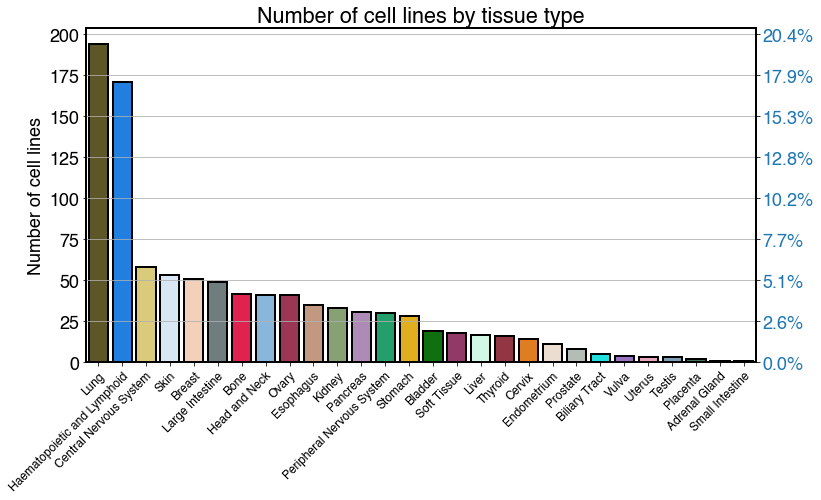

In [58]:
fig, ax1 = plt.subplots(figsize=(12, 8))
plt.grid()
sns.countplot(x='Tissue_type',
              data=meta_cell_lines,
              hue_order=list(tissue_colours.keys()),
              order=meta_cell_lines['Tissue_type'].value_counts().index,
              palette=tissue_colours,
              linewidth=2,
              edgecolor="black",
              ax=ax1)
ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

color = 'tab:blue'
ax2.set_ylabel('',
               color=color)  # we already handled the x-label with ax1
ax2.tick_params(axis='y', labelcolor=color)
ax2.set_ylim(0, ax1.get_ylim()[1] * 100 / meta_cell_lines.shape[0])
ax2.set_yticks([x / meta_cell_lines.shape[0] * 100 for x in range(0, 201, 25)])
ax2.yaxis.set_major_formatter(mtick.PercentFormatter())

plt.setp(ax1.get_xticklabels(),
         rotation=45,
         ha="right",
         size=12,
         rotation_mode="anchor")
ax1.set_ylabel("Number of cell lines")
ax1.set_xlabel("")
ax1.set_title("Number of cell lines by tissue type")
plt.gcf().subplots_adjust(bottom=0.3)
# plt.savefig("../../plots/landscape/cell_line_by_tissue.pdf", dpi=500)

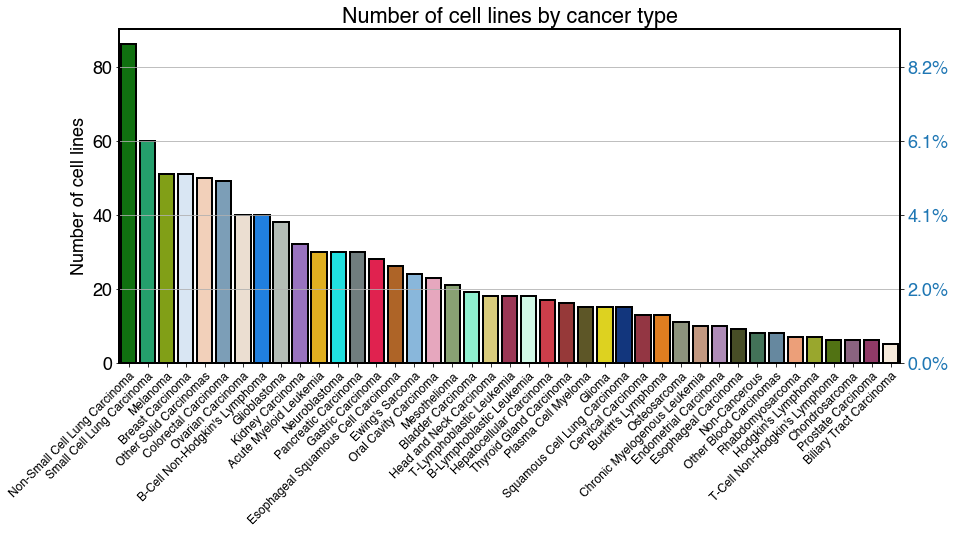

In [59]:
fig, ax1 = plt.subplots(figsize=(14, 8))
plt.grid()
sns.countplot(x='Cancer_type',
              data=meta_cell_lines,
              hue_order=list(cancer_colours.keys()),
              order=meta_cell_lines['Cancer_type'].value_counts().index,
              palette=cancer_colours,
              linewidth=2,
              edgecolor="black",
              ax=ax1)
ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

color = 'tab:blue'
ax2.set_ylabel('',
               color=color)  # we already handled the x-label with ax1
ax2.tick_params(axis='y', labelcolor=color)
ax2.set_ylim(0, ax1.get_ylim()[1] * 100 / meta_cell_lines.shape[0])
ax2.set_yticks([x / meta_cell_lines.shape[0] * 100 for x in range(0, 81, 20)])
ax2.yaxis.set_major_formatter(mtick.PercentFormatter())

plt.setp(ax1.get_xticklabels(),
         rotation=45,
         size=12,
         ha="right",
         rotation_mode="anchor")
ax1.set_ylabel("Number of cell lines")
ax1.set_xlabel("")
ax1.set_title("Number of cell lines by cancer type")
plt.gcf().subplots_adjust(bottom=0.3)
plt.savefig("../../plots/landscape/cell_line_by_cancer.pdf", dpi=500)

In [60]:
qgrid.show_grid(meta_cell_lines[['Cancer_type','Tissue_type']].drop_duplicates())

QgridWidget(grid_options={'fullWidthRows': True, 'syncColumnCellResize': True, 'forceFitColumns': True, 'defau…

## Drug

In [61]:
sizes = [(drug['FDA_Approved'] == "Yes").sum(),
         (drug['FDA_Approved'] != "Yes").sum()]
labels = ['FDA Approved', 'Not Confirmed']
explode = [0.1, 0]

Text(0.5, 1.0, 'Total of 819 drugs')

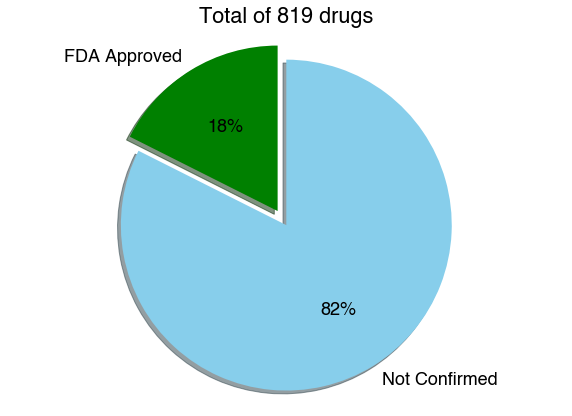

In [62]:
fig1, ax1 = plt.subplots()
ax1.pie(sizes, explode=explode, labels=labels, autopct='%1.f%%',
        shadow=True, startangle=90, colors=['green', 'skyblue'])
ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.title(f"Total of {drug.shape[0]} drugs")
# plt.savefig("../../plots/landscape/drug_pie.pdf", dpi=500)

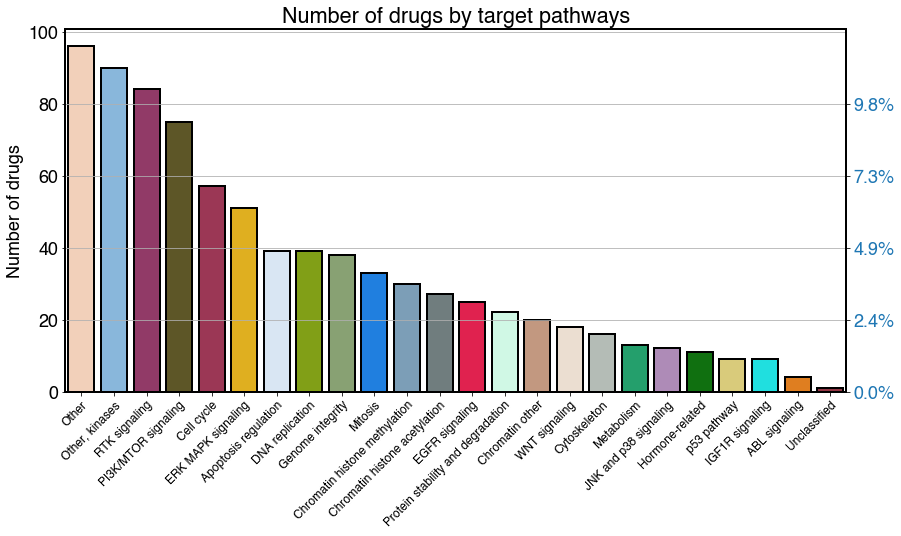

In [64]:
fig, ax1 = plt.subplots(figsize=(14, 8))
plt.grid()
sns.countplot(x='target_pathway',
              data=drug,
              hue_order=list(drug_colours.keys()),
              order=drug['target_pathway'].value_counts().index,
              palette=drug_colours,
              linewidth=2,
              edgecolor="black",
              ax=ax1)
ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

color = 'tab:blue'
ax2.set_ylabel('',
               color=color)  # we already handled the x-label with ax1
ax2.tick_params(axis='y', labelcolor=color)
ax2.set_ylim(0, ax1.get_ylim()[1] * 100 / drug.shape[0])
ax2.set_yticks([x / drug.shape[0] * 100 for x in range(0, 81, 20)])
ax2.yaxis.set_major_formatter(mtick.PercentFormatter())

plt.setp(ax1.get_xticklabels(),
         rotation=45,
         size=12,
         ha="right",
         rotation_mode="anchor")
ax1.set_ylabel("Number of drugs")
ax1.set_xlabel("")
ax1.set_title("Number of drugs by target pathways")
plt.gcf().subplots_adjust(bottom=0.25)

# plt.savefig("../../plots/landscape/drug_by_target_pathway.pdf", dpi=500)

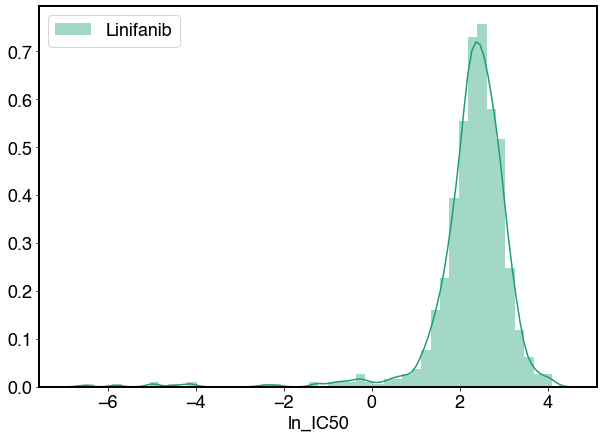

In [47]:
sns.distplot(drug_df[drug_df['drug_id'] == '277;Linifanib;GDSC1']['ln_IC50'],
             label='Linifanib')

# plt.xlabel("log(IC50)")

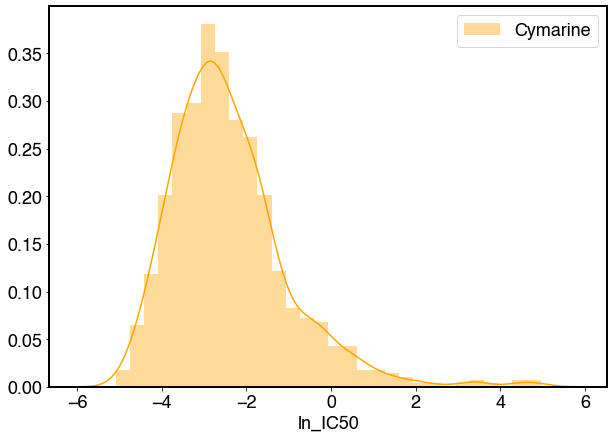

In [49]:
sns.distplot(drug_df[drug_df['drug_id'] == '1516;Cymarine;GDSC1']['ln_IC50'],
             label='Cymarine', color='orange')
plt.legend()


## protein

### Raw

In [14]:
protein_raw_protein_count = pd.DataFrame(protein_raw.shape[1] - protein_raw.isnull(
).sum(axis=1).sort_values(), columns=['Number of proteins']).reset_index()

([<matplotlib.axis.XTick at 0x7fc4324559d0>],
 <a list of 1 Text xticklabel objects>)

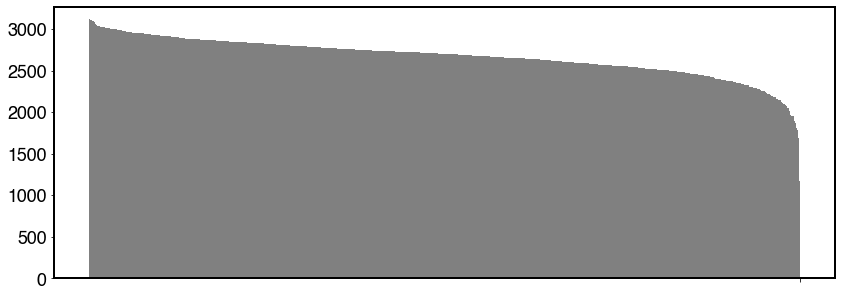

In [42]:
fig, ax = plt.subplots(figsize=(14,5))
plt.bar(x=protein_raw_protein_count['Cell_line'],
        height=protein_raw_protein_count['Number of proteins'],
        color='grey', width=1)
plt.xticks("")

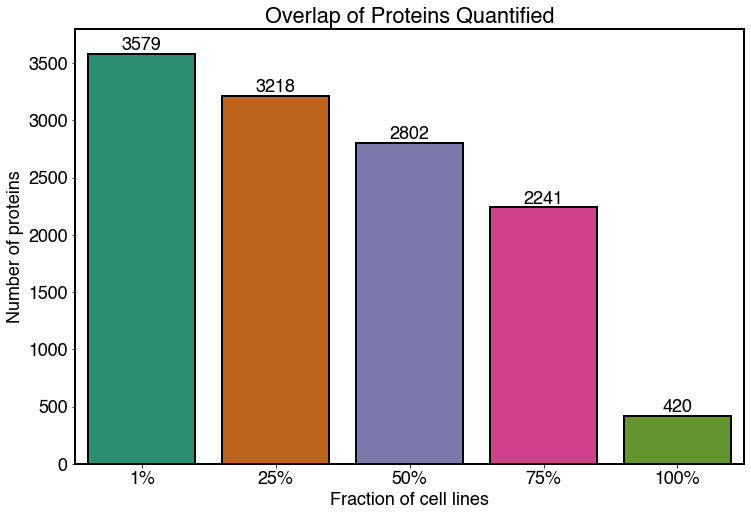

In [51]:
protein_per = []
for col in range(1, protein_raw.shape[1]):
    protein_per.append(1 - (np.sum(np.isnan(protein_raw.iloc[:, col])) /
                            (protein_raw.shape[0])))
protein_per = np.array(protein_per)

protein_per_cagetory = {'Fraction of cell lines': [], 'Number of proteins':[]}
for p in [0.01, 0.25, 0.5, 0.75, 1]:
    protein_per_cagetory['Fraction of cell lines'].append(f'{p:.0%}')
    protein_per_cagetory['Number of proteins'].append(np.sum(protein_per>=p))
protein_per_cagetory_df = pd.DataFrame(protein_per_cagetory)

# Rounding the integer to the next hundredth value plus an offset of 100
def roundup(x):
    return 200 + int(math.ceil(x / 100.0)) * 100

plt.figure(figsize=(12, 8))

sns.barplot(
    x='Fraction of cell lines',
    y='Number of proteins',
    data=protein_per_cagetory_df,
    linewidth=2,
    edgecolor="black",
)
plt.title("Overlap of Proteins Quantified")
ax = plt.gca()

# ylim max value to be set
y_max = protein_per_cagetory_df['Number of proteins'].max()
ax.set_ylim([0, roundup(y_max)])

# Iterate through the list of axes' patches
for p in ax.patches:
    ax.text(p.get_x() + p.get_width() / 2.,
            p.get_height(),
            '%d' % int(p.get_height()),
            fontsize=18,
            color='black',
            ha='center',
            va='bottom')

plt.show()

### RUV

In [111]:
protein_ruv_protein_count = pd.DataFrame(
    protein_ruv.shape[1] - protein_ruv.isnull().sum(axis=1).sort_values(),
    columns=['Number of proteins']).reset_index()

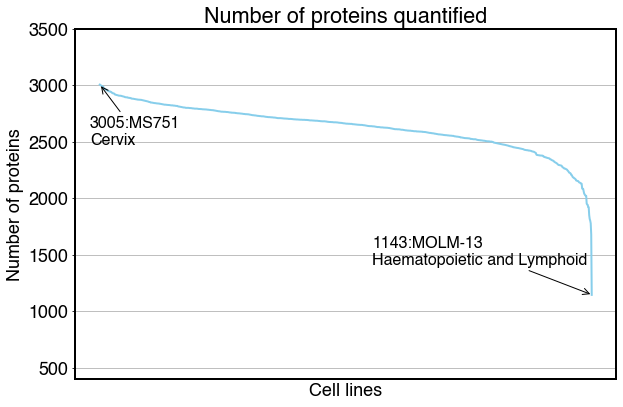

In [112]:
fig, ax = plt.subplots(figsize=(9, 6))
plt.grid()
ax = sns.lineplot(x=list(range(protein_ruv_protein_count.shape[0])),
             y=protein_ruv_protein_count['Number of proteins'].sort_values(
                 ascending=False),
             color='skyblue',
             linewidth=2)
ax.annotate(f"{protein_ruv_protein_count['Number of proteins'].max()}:MS751\nCervix",
            xy=(0, protein_ruv_protein_count['Number of proteins'].max()),
            xycoords='data',
            xytext=(-10, -60),
            textcoords='offset points',
            arrowprops=dict(arrowstyle="->"),
            fontsize=16)
ax.annotate(f"{protein_ruv_protein_count['Number of proteins'].min()}:MOLM-13\nHaematopoietic and Lymphoid",
            xy=(protein_ruv.shape[0],
                protein_ruv_protein_count['Number of proteins'].min()),
            xycoords='data',
            xytext=(-220, 30),
            textcoords='offset points',
            arrowprops=dict(arrowstyle="->"),
            fontsize=16)

plt.ylabel("Number of proteins")
plt.xlabel("Cell lines")
plt.xticks([])
plt.title("Number of proteins quantified")
plt.ylim(400, 3500)
plt.tight_layout()
plt.savefig("../../plots/landscape/num_of_proteins_all.pdf", dpi=500)

In [113]:
protein_ruv_protein_count['Tissue'] = protein_ruv_protein_count['Cell_line'].map(tissue_type_map)

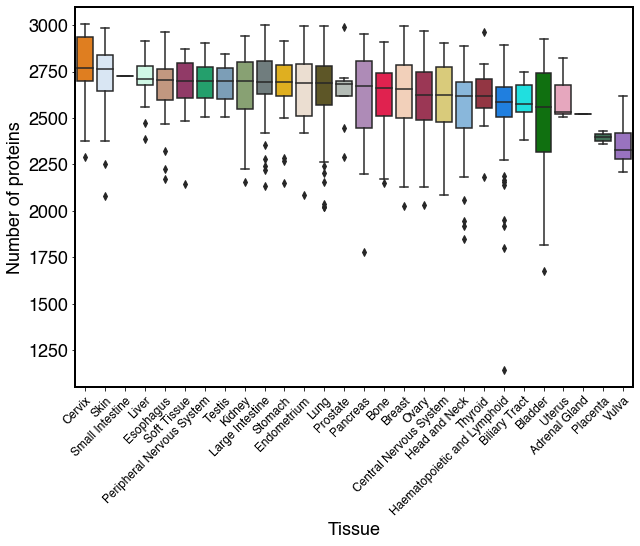

In [114]:
order = protein_ruv_protein_count.groupby([
    'Tissue'
])['Number of proteins'].median().sort_values(ascending=False).index.values
ax1 = sns.boxplot(x='Tissue',
            y='Number of proteins',
            data=protein_ruv_protein_count,
            palette=tissue_colours,
            order = order,
            showfliers=True)
plt.setp(ax1.get_xticklabels(),
         rotation=45,
         size=12,
         ha="right",
         rotation_mode="anchor")
plt.show()

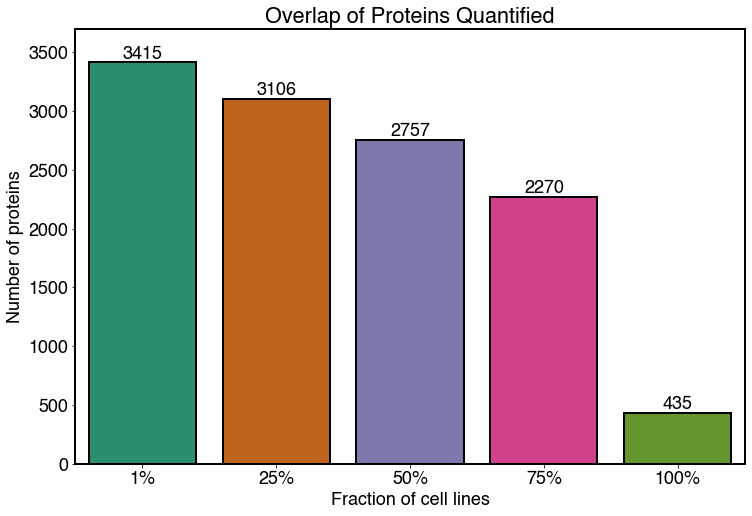

In [115]:
protein_per = []
for col in range(1, protein_ruv.shape[1]):
    protein_per.append(1 - (np.sum(np.isnan(protein_ruv.iloc[:, col])) /
                            (protein_ruv.shape[0])))
protein_per = np.array(protein_per)

protein_per_cagetory = {'Fraction of cell lines': [], 'Number of proteins':[]}
for p in [0.01, 0.25, 0.5, 0.75, 1]:
    protein_per_cagetory['Fraction of cell lines'].append(f'{p:.0%}')
    protein_per_cagetory['Number of proteins'].append(np.sum(protein_per>=p))
protein_per_cagetory_df = pd.DataFrame(protein_per_cagetory)

# Rounding the integer to the next hundredth value plus an offset of 100
def roundup(x):
    return 200 + int(math.ceil(x / 100.0)) * 100

plt.figure(figsize=(12, 8))

sns.barplot(
    x='Fraction of cell lines',
    y='Number of proteins',
    data=protein_per_cagetory_df,
    linewidth=2,
    edgecolor="black",
)
plt.title("Overlap of Proteins Quantified")
ax = plt.gca()

# ylim max value to be set
y_max = protein_per_cagetory_df['Number of proteins'].max()
ax.set_ylim([0, roundup(y_max)])

# Iterate through the list of axes' patches
for p in ax.patches:
    ax.text(p.get_x() + p.get_width() / 2.,
            p.get_height(),
            '%d' % int(p.get_height()),
            fontsize=18,
            color='black',
            ha='center',
            va='bottom')

# plt.savefig("../../plots/landscape/num_of_proteins_5.pdf", dpi=500)

In [116]:
protein_ruv_cellline_count = pd.DataFrame(
    protein_ruv.shape[0] - protein_ruv.isnull().sum(axis=0).sort_values(),
    columns=['Number of cell lines']).reset_index()

protein_ruv_cellline_count = protein_ruv_cellline_count.groupby(
    'Number of cell lines').size().reset_index(name='count')

protein_ruv_cellline_count['Number of proteins'] = protein_ruv_cellline_count[
    'count'].iloc[::-1].cumsum()

In [121]:
protein_ruv_cellline_count = protein_ruv_cellline_count.drop('count', axis=1)

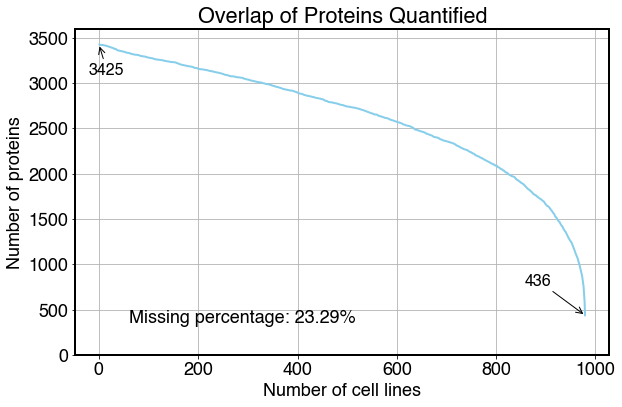

In [122]:
fig, ax = plt.subplots(figsize=(9, 6))
plt.grid()
ax = sns.lineplot(x='Number of cell lines',
                  y='Number of proteins',
                  color='skyblue',
                  linewidth=2,
                  data=protein_ruv_cellline_count)

ax.annotate(protein_ruv_cellline_count['Number of proteins'].max(),
            xy=(0, protein_ruv.shape[1]),
            xycoords='data',
            xytext=(-10, -30),
            textcoords='offset points',
            arrowprops=dict(arrowstyle="->"),
            fontsize=16)
ax.annotate(protein_ruv_cellline_count['Number of proteins'].min(),
            xy=(protein_ruv.shape[0],
                protein_ruv_cellline_count['Number of proteins'].min()),
            xycoords='data',
            xytext=(-60, 30),
            textcoords='offset points',
            arrowprops=dict(arrowstyle="->"),
            fontsize=16)
missing_ratio = np.sum(np.isnan(protein_ruv.values.flatten())) / (
    protein_ruv.shape[0] * protein_ruv.shape[1])
ax.text(0.1,
        0.1,
        f"Missing percentage: {missing_ratio*100:.2f}%",
        transform=ax.transAxes)
plt.ylim(0, 3600)
plt.title("Overlap of Proteins Quantified")
plt.tight_layout()
plt.savefig("../../plots/landscape/fraction_of_celllines.pdf", dpi=500)

In [127]:
protein_ruv_cellline_count.to_csv("../../plots/plot_data/SuppFig1A_protein_overlap.csv", index=False)

In [69]:
protein_ruv_cellline_count[protein_ruv_cellline_count['Number of cell lines']==734]

,Number of cell lines,count,Number of proteins
558,734,2,2273


In [72]:
df_protein_missing = pd.DataFrame({
    'missing_count':
    pd.isna(protein_ruv).sum(),
    'protein_mean':
    protein_ruv.mean(axis=0, skipna=True)
})

In [73]:
df_protein_missing

,missing_count,protein_mean
1433B_HUMAN,0,-0.078552
1433E_HUMAN,0,-0.307842
1433F_HUMAN,14,-0.213540
1433G_HUMAN,0,-0.026908
1433S_HUMAN,101,-0.480639
...,...,...
ZO2_HUMAN,0,-0.233896
ZPR1_HUMAN,160,-0.429359
ZRAB2_HUMAN,14,-0.289800
ZW10_HUMAN,106,-0.167815


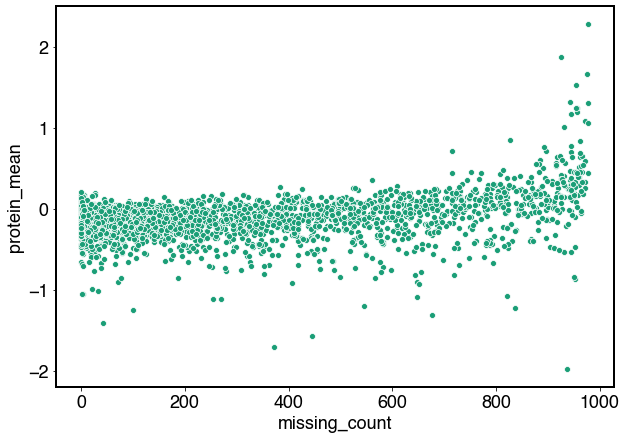

In [74]:
sns.scatterplot(x='missing_count',y='protein_mean', data=df_protein_missing)

0.23293752749342023

# Dimensionality Reduction

## UMAP

### RUV

In [17]:
reducer = umap.UMAP(random_state=seed)
embedding_ruv = reducer.fit_transform(protein_ruv.fillna(0))

In [18]:
df_umap = pd.DataFrame({
    'UMAP_1': embedding_ruv[:, 0],
    'UMAP_2': embedding_ruv[:, 1]
}, index=protein_ruv.index)

In [19]:
df_umap['tissue_type'] = df_umap.index.map(tissue_type_map)
df_umap['cancer_type'] = df_umap.index.map(cancer_type_map)

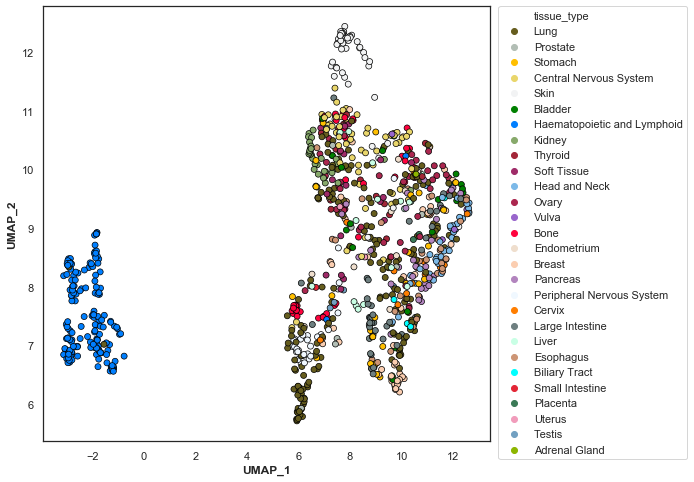

In [22]:
fig = plt.figure(figsize=(8, 8))
sns.scatterplot(x='UMAP_1',
                y='UMAP_2',
                hue='tissue_type',
                data=df_umap,
                palette=tissue_colours,
                legend='full',
                edgecolor='black',
                linewidth=0.7)
plt.legend(bbox_to_anchor=(1.02, 1),
           loc=2,
           borderaxespad=0.,
           prop={'size': 11})

### Median

In [156]:
reducer = umap.UMAP(random_state=seed)
embedding_median = reducer.fit_transform(protein_median.fillna(0))

In [157]:
df_umap = pd.DataFrame({
    'UMAP_1': embedding_median[:, 0],
    'UMAP_2': embedding_median[:, 1]
}, index=protein_median.index)

In [158]:
df_umap['tissue_type'] = df_umap.index.map(tissue_type_map)
df_umap['cancer_type'] = df_umap.index.map(cancer_type_map)

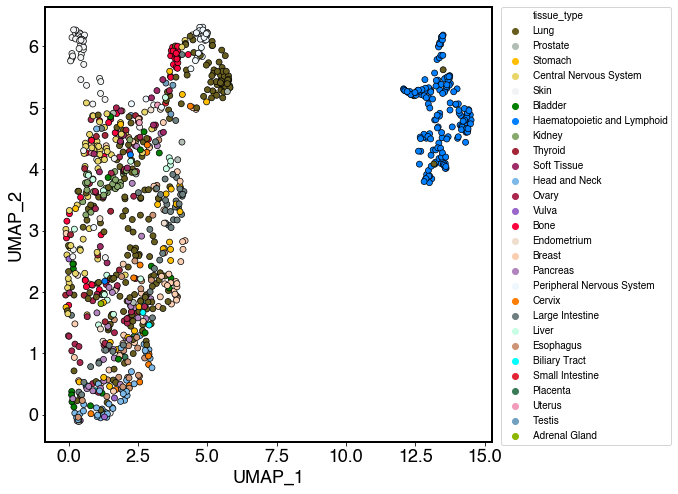

In [159]:
fig = plt.figure(figsize=(8, 8))
sns.scatterplot(x='UMAP_1',
                y='UMAP_2',
                hue='tissue_type',
                data=df_umap,
                palette=tissue_colours,
                legend='full',
                edgecolor='black',
                linewidth=0.7)
plt.legend(bbox_to_anchor=(1.02, 1),
           loc=2,
           borderaxespad=0.,
           prop={'size': 10})

## PCA + UMAP

### RUV

In [86]:
pca = PCA(n_components=50, random_state=seed)
reducer = umap.UMAP(random_state=seed)

pca_ruv = pca.fit_transform(protein_ruv.fillna(0))

embedding_ruv = reducer.fit_transform(pca_ruv)

df_umap = pd.DataFrame({
    'UMAP_1': embedding_ruv[:, 0],
    'UMAP_2': embedding_ruv[:, 1]
}, index=protein_ruv.index)

df_umap['Tissue'] = df_umap.index.map(tissue_type_map)
df_umap['Cancer'] = df_umap.index.map(cancer_type_map)
df_umap['Batch'] = df_umap.index.map(batch_map)
df_umap['Instrument'] = df_umap.index.map(instrument_map)

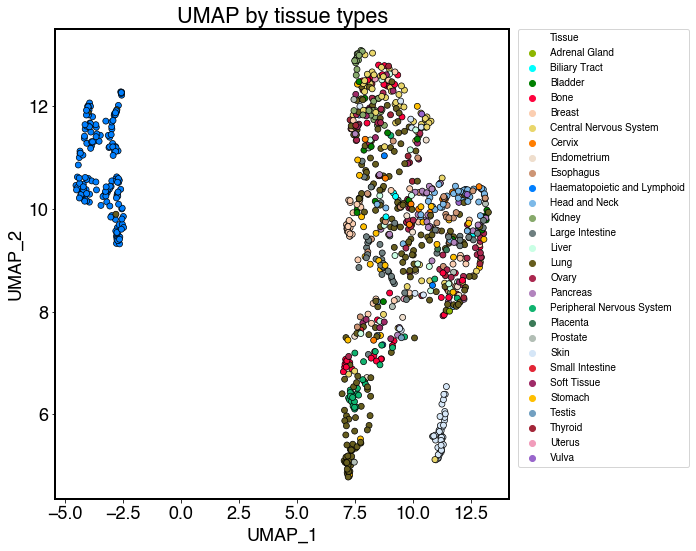

In [129]:
fig = plt.figure(figsize=(10, 8))
sns.scatterplot(x='UMAP_1',
                y='UMAP_2',
                hue='Tissue',
                hue_order=sorted(df_umap['Tissue'].unique()),
                data=df_umap,
                palette=tissue_colours,
                legend='full',
                edgecolor='black',
                linewidth=0.7)
plt.legend(bbox_to_anchor=(1.02, 1),
           loc=2,
           borderaxespad=0.,
           prop={'size': 10})
plt.title("UMAP by tissue types")
plt.gcf().subplots_adjust(right=0.7)
plt.tight_layout()

plt.savefig("../../plots/landscape/umap_pca_umap_all.pdf", dpi=500)

In [130]:
df_umap.to_csv("../../plots/plot_data/Fig1E_UMAP_all_cell_lines.csv")

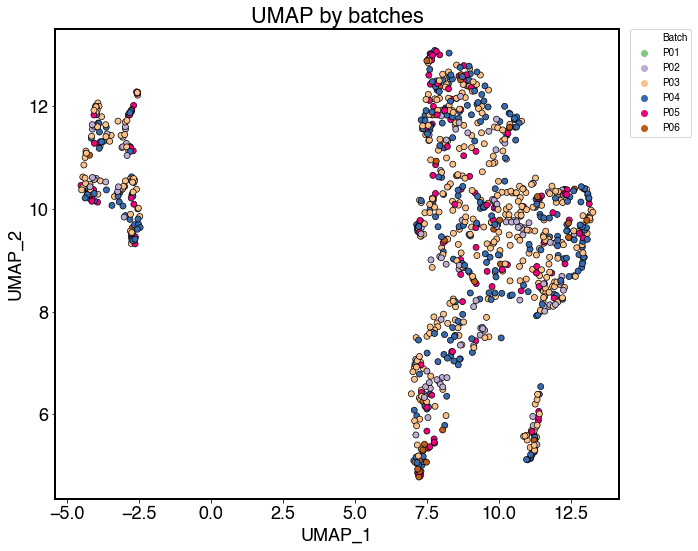

In [117]:
fig = plt.figure(figsize=(10, 8))
sns.scatterplot(x='UMAP_1',
                y='UMAP_2',
                hue='Batch',
                data=df_umap,
                palette=batch_colours,
                legend='full',
                edgecolor='black',
                hue_order=sorted(batch_colours.keys()),
                linewidth=0.7)
plt.legend(bbox_to_anchor=(1.02, 1),
           loc=2,
           borderaxespad=0.,
           prop={'size': 10})
plt.title("UMAP by batches")
plt.gcf().subplots_adjust(right=0.7)
plt.tight_layout()
plt.savefig("../../plots/landscape/umap_pca_umap_batch.pdf", dpi=500)

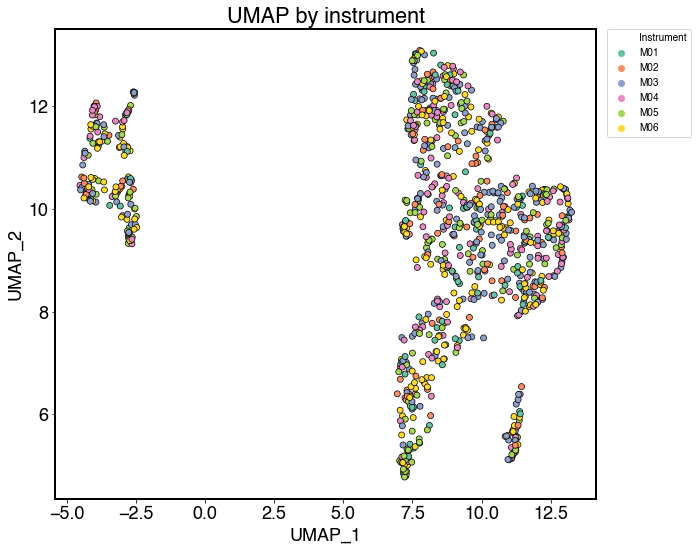

In [118]:
fig = plt.figure(figsize=(10, 8))
sns.scatterplot(x='UMAP_1',
                y='UMAP_2',
                hue='Instrument',
                data=df_umap,
                palette=instrument_colours,
                legend='full',
                edgecolor='black',
                hue_order=sorted(instrument_colours.keys()),
                linewidth=0.7)
plt.legend(bbox_to_anchor=(1.02, 1),
           loc=2,
           borderaxespad=0.,
           prop={'size': 10})
plt.title("UMAP by instrument")
plt.gcf().subplots_adjust(right=0.7)
plt.tight_layout()
plt.savefig("../../plots/landscape/umap_pca_umap_instrument.pdf", dpi=500)

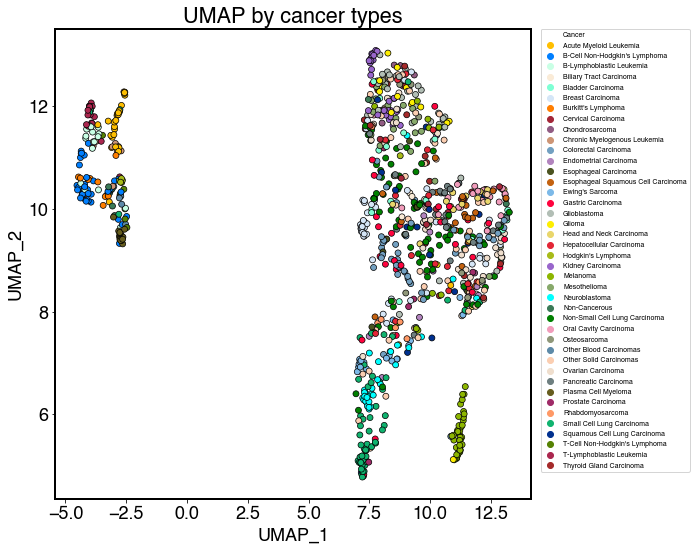

In [131]:
fig = plt.figure(figsize=(10, 8))
sns.scatterplot(x='UMAP_1',
                y='UMAP_2',
                hue='Cancer',
                hue_order=sorted(df_umap['Cancer'].unique()),
                data=df_umap,
                palette=cancer_colours,
                legend='full',
                edgecolor='black',
                linewidth=0.7)
plt.legend(bbox_to_anchor=(1.02, 1),
           loc=2,
           borderaxespad=0.,
           prop={'size': 7})
plt.title("UMAP by cancer types")
plt.gcf().subplots_adjust(right=0.7)
plt.tight_layout()

plt.savefig("../../plots/landscape/umap_pca_umap_all_cancer.pdf", dpi=500)

#### only blood

In [93]:
pca = PCA(n_components=50, random_state=seed)
reducer = umap.UMAP(random_state=seed)

pca_ruv = pca.fit_transform(protein_ruv[~protein_ruv.index.isin(cell_lines_no_blood)].fillna(0))

embedding_ruv = reducer.fit_transform(pca_ruv)

df_umap = pd.DataFrame({
    'UMAP_1': embedding_ruv[:, 0],
    'UMAP_2': embedding_ruv[:, 1]
}, index=protein_ruv[~protein_ruv.index.isin(cell_lines_no_blood)].index)

df_umap['Tissue'] = df_umap.index.map(tissue_type_map)
df_umap['Cancer'] = df_umap.index.map(cancer_type_map)

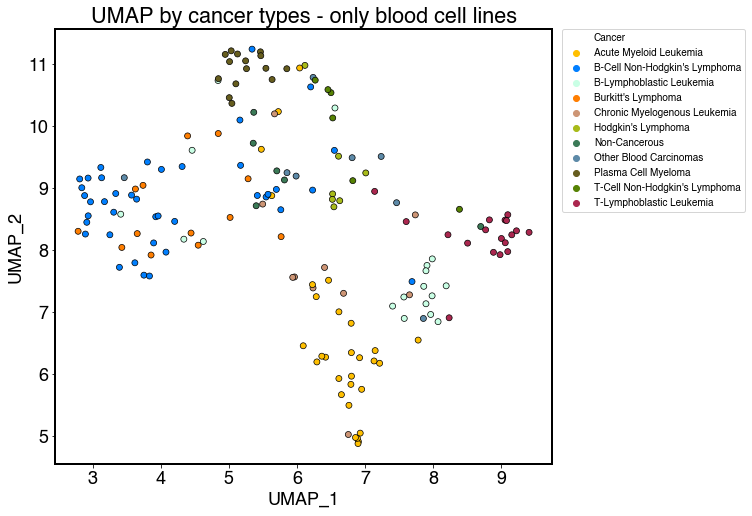

In [94]:
fig = plt.figure(figsize=(12, 8))
sns.scatterplot(x='UMAP_1',
                y='UMAP_2',
                hue='Cancer',
                hue_order=sorted(df_umap['Cancer'].unique()),
                data=df_umap,
                palette=cancer_colours,
                legend='full',
                edgecolor='black',
                linewidth=0.7)
plt.legend(bbox_to_anchor=(1.02, 1),
           loc=2,
           borderaxespad=0.,
           prop={'size': 10})
plt.title("UMAP by cancer types - only blood cell lines")

plt.gcf().subplots_adjust(right=0.7)
plt.savefig("../../plots/landscape/umap_pca_umap_only_blood_cancer.pdf", dpi=500)

In [95]:
df_umap.to_csv("../../plots/plot_data/SuppFig1E_UMAP_onlyblood_cell_lines.csv")

#### no blood

In [94]:
pca = PCA(n_components=50, random_state=seed)
reducer = umap.UMAP(random_state=seed)

pca_ruv = pca.fit_transform(protein_ruv[protein_ruv.index.isin(cell_lines_no_blood)].fillna(0))

embedding_ruv = reducer.fit_transform(pca_ruv)

df_umap = pd.DataFrame({
    'UMAP_1': embedding_ruv[:, 0],
    'UMAP_2': embedding_ruv[:, 1]
}, index=protein_ruv[protein_ruv.index.isin(cell_lines_no_blood)].index)

df_umap['Tissue'] = df_umap.index.map(tissue_type_map)
df_umap['Cancer'] = df_umap.index.map(cancer_type_map)

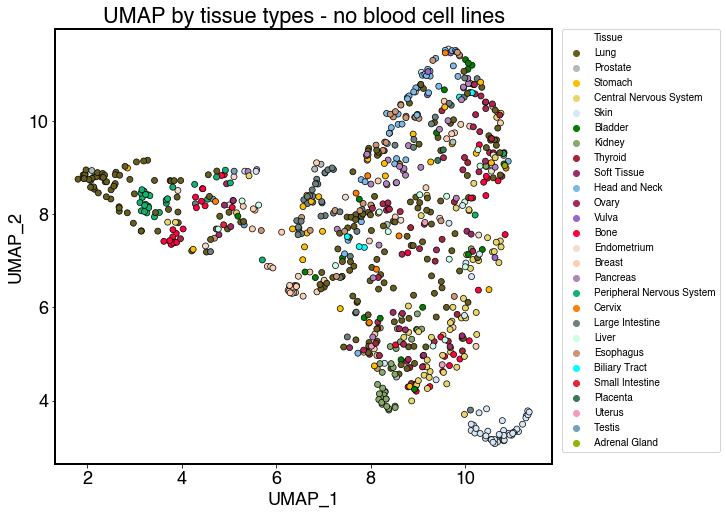

In [95]:
fig = plt.figure(figsize=(12, 8))
sns.scatterplot(x='UMAP_1',
                y='UMAP_2',
                hue='Tissue',
                data=df_umap,
                palette=tissue_colours,
                legend='full',
                edgecolor='black',
                linewidth=0.7)
plt.legend(bbox_to_anchor=(1.02, 1),
           loc=2,
           borderaxespad=0.,
           prop={'size': 10})
plt.title("UMAP by tissue types - no blood cell lines")

plt.gcf().subplots_adjust(right=0.7)
plt.savefig("../../plots/landscape/umap_pca_umap_noblood.pdf", dpi=500)

In [92]:
df_umap.to_csv("../../plots/plot_data/SuppFig1E_UMAP_noblood_cell_lines.csv")

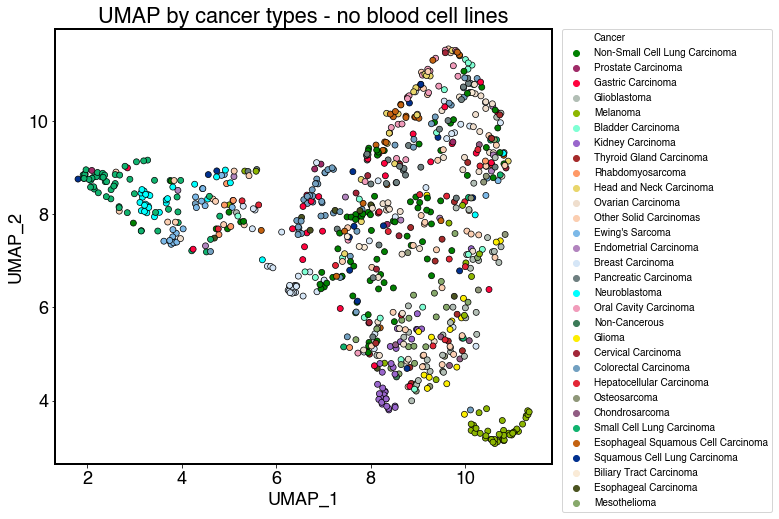

In [96]:
fig = plt.figure(figsize=(12, 8))
sns.scatterplot(x='UMAP_1',
                y='UMAP_2',
                hue='Cancer',
                data=df_umap,
                palette=cancer_colours,
                legend='full',
                edgecolor='black',
                linewidth=0.7)
plt.legend(bbox_to_anchor=(1.02, 1),
           loc=2,
           borderaxespad=0.,
           prop={'size': 10})
plt.title("UMAP by cancer types - no blood cell lines")

plt.gcf().subplots_adjust(right=0.7)
plt.savefig("../../plots/landscape/umap_pca_umap_noblood_cancer.pdf", dpi=500)

### Median

In [79]:
pca = PCA(n_components=50)
reducer = umap.UMAP()

In [80]:
pca_median = pca.fit_transform(protein_median.fillna(0))

In [81]:
embedding_median = reducer.fit_transform(pca_median)

In [82]:
df_umap = pd.DataFrame({
    'UMAP_1': embedding_median[:, 0],
    'UMAP_2': embedding_median[:, 1]
}, index=protein_median.index)

In [83]:
df_umap['tissue_type'] = df_umap.index.map(tissue_type_map)
df_umap['cancer_type'] = df_umap.index.map(cancer_type_map)

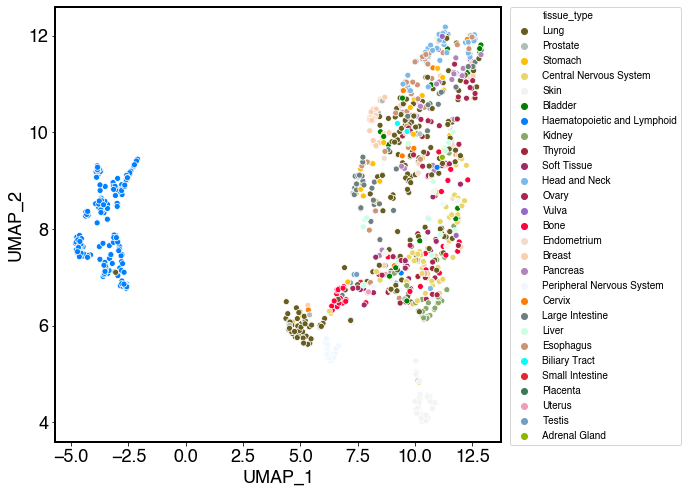

In [84]:
fig = plt.figure(figsize=(8,8))
sns.scatterplot(x='UMAP_1', y='UMAP_2', hue='tissue_type', data=df_umap, palette=tissue_colours, legend='full')
plt.legend(bbox_to_anchor=(1.02, 1), loc=2, borderaxespad=0., prop={'size': 10})

## TSNE

In [142]:
tsne = TSNE(random_state=seed)

tsne_ruv = tsne.fit_transform(protein_ruv.fillna(0))

df_tsne = pd.DataFrame({
    'tSNE_1': tsne_ruv[:, 0],
    'tSNE_2': tsne_ruv[:, 1]
}, index=protein_ruv.index)

df_tsne['tissue_type'] = df_tsne.index.map(tissue_type_map)
df_tsne['cancer_type'] = df_tsne.index.map(cancer_type_map)

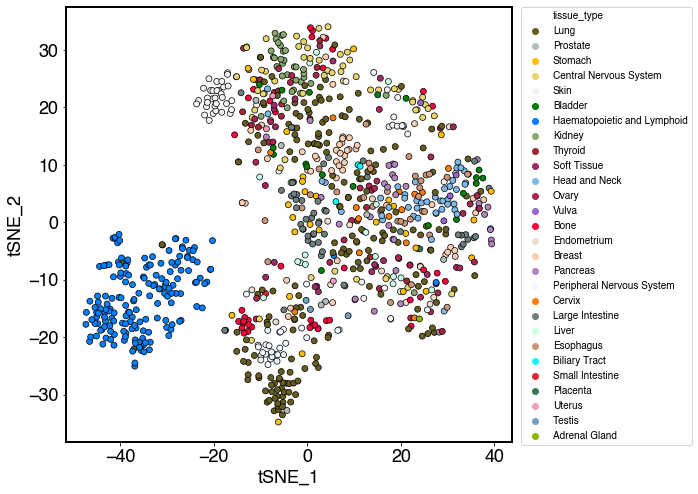

In [144]:
fig = plt.figure(figsize=(8, 8))
sns.scatterplot(x='tSNE_1',
                y='tSNE_2',
                hue='tissue_type',
                data=df_tsne,
                palette=tissue_colours,
                legend='full',
                edgecolor='black',
                linewidth=.7)
plt.legend(bbox_to_anchor=(1.02, 1),
           loc=2,
           borderaxespad=0.,
           prop={'size': 10})

### no blood

In [145]:
tsne = TSNE(random_state=seed)

tsne_ruv = tsne.fit_transform(protein_ruv[protein_ruv.index.isin(cell_lines_no_blood)].fillna(0))

df_tsne = pd.DataFrame({
    'tSNE_1': tsne_ruv[:, 0],
    'tSNE_2': tsne_ruv[:, 1]
}, index=protein_ruv[protein_ruv.index.isin(cell_lines_no_blood)].index)

df_tsne['tissue_type'] = df_tsne.index.map(tissue_type_map)
df_tsne['cancer_type'] = df_tsne.index.map(cancer_type_map)

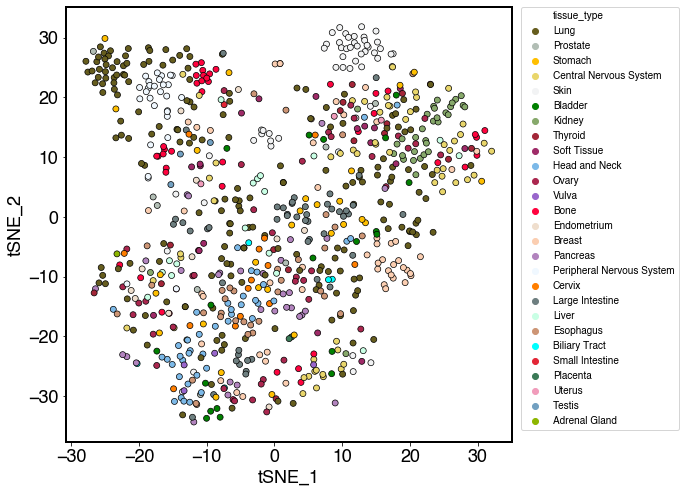

In [146]:
fig = plt.figure(figsize=(8, 8))
sns.scatterplot(
    x='tSNE_1',
    y='tSNE_2',
    hue='tissue_type',
    data=df_tsne,
    palette=tissue_colours,
    legend='full',
    edgecolor='black',
    linewidth=.7
)
plt.legend(bbox_to_anchor=(1.02, 1),
           loc=2,
           borderaxespad=0.,
           prop={'size': 10})

# replicate correlation

## compute

In [22]:
def compute_corr_aux(replicate_df, group, col='Cell_line', report_mean=True):
    replicates = meta[meta[col]==group]['Automatic_MS_filename'].values
    tmp = replicate_df[replicates].corr()
    tmp = tmp.values.flatten()
    tmp = tmp[tmp!=1]
    if not report_mean:
        return tmp
    else:
        mean_corr = np.nanmean(tmp[tmp!=1])
        return mean_corr

In [23]:
def compute_corr(replicate_df, col='Cell_line', report_mean=True):
    res = Parallel(n_jobs=14)(
        delayed(compute_corr_aux)(replicate_df, group, col, report_mean)
        for group in meta[col].unique())
    return np.squeeze(np.array(res))

In [16]:
def compute_corr_all_aux(replicate_df, replicates):
    tmp = replicate_df[list(replicates)].corr()
    mean_corr = np.nanmean(tmp[tmp!=1])
    return mean_corr

In [17]:
def compute_corr_all(replicate_df, n=5000):
    all_pairs = list(combinations(replicate_df.columns.values, 2))
    random_selected = random.choices(all_pairs, k=n)
    res = Parallel(n_jobs=14)(
        delayed(compute_corr_all_aux)(replicate_df, rep)
        for rep in tqdm(random_selected))
    return np.squeeze(np.array(res))

In [18]:
replicate_raw = pd.read_csv(
    "../../data/protein/E0022_P06_Protein_Matrix_Replicate_Raw.tsv.gz",
    sep='\t',
    index_col = 0).T

replicate_median = pd.read_csv(
    "../../data/protein/E0022_P06_Protein_Matrix_Replicate_Median.tsv.gz",
    sep='\t',
    index_col = 0).T

replicate_ruv = pd.read_csv(
    "../../data/protein/E0022_P06_Protein_Matrix_Replicate_ProNorM.tsv.gz",
    sep='\t',
    index_col = 0).T

In [67]:
res_raw = {}
res_median = {}
res_ruv = {}

for g in tqdm(['Cell_line','Cancer_type','Tissue_type','Batch','Instrument']):
#     res_raw[g] = compute_corr(replicate_raw, g)
#     res_median[g] = compute_corr(replicate_median, g)
    res_ruv[g] = compute_corr(replicate_ruv, g)

/Users/scai/anaconda3/envs/sanger/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:703: UserWarning:

A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.



In [24]:
for g in tqdm(['Cancer_type','Tissue_type','Batch','Instrument']):
#     res_raw[g] = compute_corr(replicate_raw, g)
#     res_median[g] = compute_corr(replicate_median, g)
    res_ruv[g] = compute_corr(replicate_ruv, g, report_mean=False)

<ipython-input-23-52ccc286db1c>:5: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



In [37]:
for g in tqdm(['Cancer_type','Tissue_type','Batch','Instrument']):
    res_ruv[g] = np.concatenate(res_ruv[g])

In [25]:
replicate_corr = {'raw': res_raw, 'median': res_median, 'ruv': res_ruv}

In [83]:
res_raw['Random'] = compute_corr_all(replicate_raw, 10000)
res_median['Random'] = compute_corr_all(replicate_median, 10000)
res_ruv['Random'] = compute_corr_all(replicate_ruv, 10000)

In [39]:
pickle.dump(replicate_corr, open("../../result_files/replicate_corr_not_mean.pkl", "wb"))

In [19]:
replicate_corr = pickle.load(open("../../result_files/replicate_corr.pkl", "rb"))

In [20]:
res_raw = replicate_corr['raw']
res_median = replicate_corr['median']
res_ruv = replicate_corr['ruv']

## ploting

In [100]:
replicate_corr = pickle.load(open("../../result_files/replicate_corr.pkl", "rb"))

In [101]:
res_raw = replicate_corr['raw']
res_median = replicate_corr['median']
res_ruv = replicate_corr['ruv']

In [102]:
raw_df = {'group':[], 'correlation':[]}
for key in res_raw.keys():
    raw_df['correlation'].extend(res_raw[key])
    raw_df['group'].extend([key.replace("_type", "")]*len(res_raw[key]))
raw_df = pd.DataFrame(raw_df)

In [103]:
median_df = {'group':[], 'correlation':[]}
for key in res_median.keys():
    median_df['correlation'].extend(res_median[key])
    median_df['group'].extend([key.replace("_type", "")]*len(res_median[key]))
median_df = pd.DataFrame(median_df)

In [104]:
ruv_df = {'group':[], 'correlation':[]}
for key in res_ruv.keys():
    ruv_df['correlation'].extend(res_ruv[key])
    ruv_df['group'].extend([key.replace("_type", "")]*len(res_ruv[key]))
ruv_df = pd.DataFrame(ruv_df)

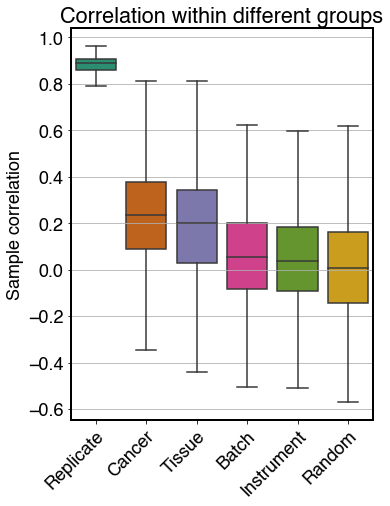

In [41]:
fig, ax = plt.subplots(1, 1, figsize=(6, 8), sharey=True)
ax.grid()

sns.boxplot(x='group',
            y='correlation',
            data=ruv_df,
            showfliers=False,
            ax=ax)

ax.set_title(r"Correlation within different groups")

ax.set_xlabel("")
ax.set_xticklabels(["Replicate", "Cancer", "Tissue", "Batch", "Instrument", "Random"])
ax.set_ylabel('Sample correlation')

plt.setp(ax.xaxis.get_majorticklabels(), rotation=45, rotation_mode='anchor', ha='right')

plt.gcf().subplots_adjust(bottom=0.2,left=0.2)
# plt.savefig("../../plots/landscape/replicate_correlation_ProNorM.pdf", dpi=500)

In [42]:
ruv_df.to_csv("../../plots/plot_data/Fig1C_sample_correlation_not_mean.csv",index=False)

# CCLE and NCI correlation

In [230]:
res_raw = {'Replicate':replicate_corr['raw']['Cell_line']}
res_median = {'Replicate':replicate_corr['median']['Cell_line']}
res_ruv = {'Replicate':replicate_corr['ruv']['Cell_line']}

In [13]:
protein_raw = pd.read_csv("../../data/protein/E0022_P06_Protein_Matrix_Raw_no_control_update.txt", sep='\t')
protein_median = pd.read_csv("../../data/protein/E0022_P06_Protein_Matrix_Median_no_control_update.txt", sep='\t')
protein_ruv = pd.read_csv("../../data/protein/E0022_P06_Protein_Matrix_ProNorM_no_control_update.txt",sep='\t')

In [14]:
protein_raw = protein_raw.set_index("Cell_line").T
protein_median = protein_median.set_index("Cell_line").T
protein_ruv = protein_ruv.set_index("Cell_line").T

In [18]:
def calc_cellline_correlation_aux(df1, df2, cell_line, data='protein'):
    if cell_line not in df2.columns:
        return None
    df1_cellline = df1[[cell_line]].reset_index()
    if data.lower() == 'rna':
        df1_cellline['index'] = df1_cellline['index'].map(name_map_dict)
    df2_cellline = df2[[cell_line]].reset_index()
    tmp = pd.merge(df1_cellline, df2_cellline, on=['index'], suffixes=["_df1", "_df2"]).dropna()
#     tmp = tmp.astype(float)
    try:
        corr = pearsonr(tmp[f"{cell_line}_df1"], tmp[f"{cell_line}_df2"])[0]
    except:
        print(tmp)
        return None
    return corr

In [19]:
def calc_cellline_correlation(df1, df2, data='protein'):
    res = Parallel(n_jobs=14)(
        delayed(calc_cellline_correlation_aux)(df1, df2, cell_line, data)
        for cell_line in tqdm(df1.columns))
    res = [x for x in res if x is not None]
    return np.array(res)

## protein corr

### Kuster

In [18]:
kuster = pd.read_csv("../../data/Kuster/protein_combined_common_processed.csv").set_index("Cell_line").T

In [50]:
res_raw['Kuster'] = calc_cellline_correlation(protein_raw, kuster, data='protein')

res_median['Kuster'] = calc_cellline_correlation(protein_median, kuster, data='protein')

res_ruv['Kuster'] = calc_cellline_correlation(protein_ruv, kuster, data='protein')

### Broad

In [259]:
broad = pd.read_csv("../../data/ccle/ccle_proteins_sanger_name.csv").set_index("Cell_line").T

In [236]:
res_raw['Broad'] = calc_cellline_correlation(protein_raw, broad, data='protein')

res_median['Broad'] = calc_cellline_correlation(protein_median, broad, data='protein')

res_ruv['Broad'] = calc_cellline_correlation(protein_ruv, broad, data='protein')

### NCI60

In [237]:
nci60 = pd.read_csv("../../data/tiannan/tianan_protein_processed_common.csv").set_index("Cell_line").T

In [238]:
res_raw['NCI60'] = calc_cellline_correlation(protein_raw, nci60, data='protein')

res_median['NCI60'] = calc_cellline_correlation(protein_median, nci60, data='protein')

res_ruv['NCI60'] = calc_cellline_correlation(protein_ruv, nci60, data='protein')

### COREAD

In [239]:
coread = pd.read_csv("../../data/crc/coread_processed.csv").set_index("Cell_line").T

In [240]:
res_raw['COREAD'] = calc_cellline_correlation(protein_raw, coread, data='protein')

res_median['COREAD'] = calc_cellline_correlation(protein_median, coread, data='protein')

res_ruv['COREAD'] = calc_cellline_correlation(protein_ruv, coread, data='protein')

### TNBC

In [241]:
tnbc = pd.read_csv("../../data/TNBC/TNBC_processed.csv").set_index("Cell_line").T

In [242]:
res_raw['TNBC'] = calc_cellline_correlation(protein_raw, tnbc, data='protein')

res_median['TNBC'] = calc_cellline_correlation(protein_median, tnbc, data='protein')

res_ruv['TNBC'] = calc_cellline_correlation(protein_ruv, tnbc, data='protein')

### save

In [52]:
cellline_corr = {'raw': res_raw, 'median': res_median, 'ruv': res_ruv}
pickle.dump(cellline_corr, open("../../result_files/cell_line_external_corr.pkl", "wb"))

### plot

In [142]:
cellline_corr = pickle.load(open("../../result_files/cell_line_external_corr.pkl", "rb"))

res_raw = cellline_corr['raw']
res_median = cellline_corr['median']
res_ruv = cellline_corr['ruv']

In [143]:
raw_df = {'group':[], 'correlation':[]}
for key in res_raw.keys():
    raw_df['correlation'].extend(res_raw[key])
    raw_df['group'].extend([key.replace("_type", "")]*len(res_raw[key]))
raw_df = pd.DataFrame(raw_df)

median_df = {'group':[], 'correlation':[]}
for key in res_median.keys():
    median_df['correlation'].extend(res_median[key])
    median_df['group'].extend([key.replace("_type", "")]*len(res_median[key]))
median_df = pd.DataFrame(median_df)

ruv_df = {'group':[], 'correlation':[]}
for key in res_ruv.keys():
    ruv_df['correlation'].extend(res_ruv[key])
    ruv_df['group'].extend([key.replace("_type", "")]*len(res_ruv[key]))
ruv_df = pd.DataFrame(ruv_df)

In [144]:
ruv_df = ruv_df[ruv_df['group']!='Replicate']

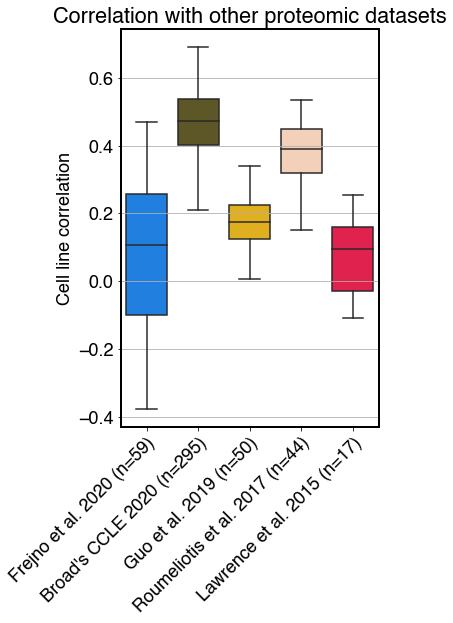

In [145]:
fig, ax = plt.subplots(1, 1, figsize=(6, 9), sharey=True)
ax.grid()

sns.boxplot(x='group',
            y='correlation',
            data=ruv_df,
            order=['Kuster', 'Broad', 'NCI60', 'COREAD', 'TNBC'],
            palette=colour_list[:5],
            showfliers=False,
            ax=ax)

ax.set_title(r"Correlation with other proteomic datasets")

ax.set_xlabel("")
ax.set_ylabel('Cell line correlation')

ax.set_xticklabels([
    f"Frejno et al. 2020 (n={res_raw['Kuster'].shape[0]})",
    f"Broad's CCLE 2020 (n={res_raw['Broad'].shape[0]})",
    f"Guo et al. 2019 (n={res_raw['NCI60'].shape[0]})",
    f"Roumeliotis et al. 2017 (n={res_raw['COREAD'].shape[0]})",
    f"Lawrence et al. 2015 (n={res_raw['TNBC'].shape[0]})"
])

plt.setp(ax.xaxis.get_majorticklabels(),
         rotation=45,
         rotation_mode='anchor',
         ha='right')

plt.tight_layout()
# plt.gcf().subplots_adjust(bottom=0.4, left=0.2)

plt.savefig("../../plots/landscape/cell_line_correlation_ProNorM.pdf", dpi=500)

In [147]:
ruv_df.to_csv("../../plots/plot_data/SuppFig1B_dataset_correlation.csv",index=False)

# combined ProNorM

In [116]:
replicate_corr = pickle.load(open("../../result_files/replicate_corr.pkl", "rb"))

res_ruv = replicate_corr['ruv']
ruv_df = {'group':[], 'correlation':[]}
for key in res_ruv.keys():
    ruv_df['correlation'].extend(res_ruv[key])
    ruv_df['group'].extend([key.replace("_type", "")]*len(res_ruv[key]))
ruv_df = pd.DataFrame(ruv_df)

In [131]:
cellline_corr = pickle.load(open("../../result_files/cell_line_external_corr.pkl", "rb"))

res_ruv_external = cellline_corr['ruv']
ruv_df_external = {'group':[], 'correlation':[]}
for key in res_ruv.keys():
    ruv_df_external['correlation'].extend(res_ruv[key])
    ruv_df_external['group'].extend([key.replace("_type", "")]*len(res_ruv[key]))
ruv_df_external = pd.DataFrame(ruv_df_external)

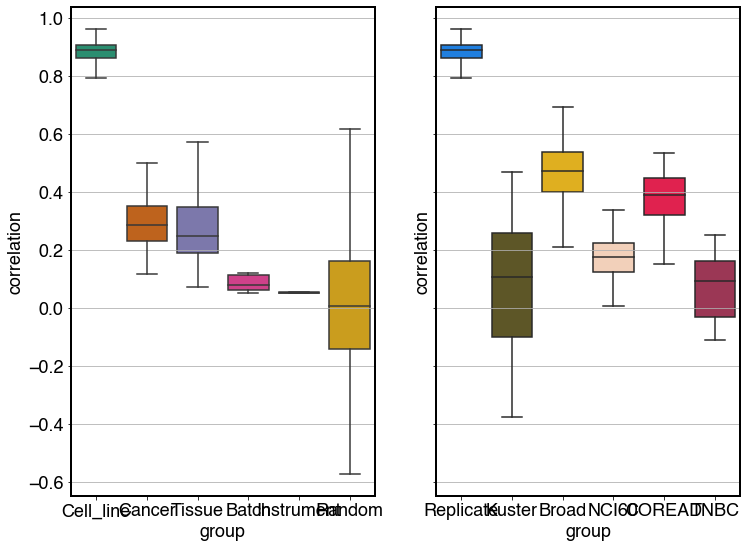

In [133]:
fig, ax = plt.subplots(1, 2, figsize=(12, 9), sharey=True)
ax[0].grid()
ax[1].grid()
sns.boxplot(x='group',
            y='correlation',
            data=ruv_df,
            showfliers=False,
            ax=ax[0])
sns.boxplot(x='group',
            y='correlation',
            data=ruv_df_external,
            order=['Replicate', 'Kuster', 'Broad', 'NCI60', 'COREAD', 'TNBC'],
            palette=colour_list[:6],
            showfliers=False,
            ax=ax[1])

# ax.set_title(r"Correlation with other proteomic datasets")

# ax.set_xlabel("")
# ax.set_ylabel('Cell line correlation')

# ax.set_xticklabels([
#     'Replicate', f"Frejno et al. 2020 (n={res_raw['Kuster'].shape[0]})",
#     f"Broad's CCLE 2020 (n={res_raw['Broad'].shape[0]})",
#     f"Guo et al. 2019 (n={res_raw['NCI60'].shape[0]})",
#     f"Roumeliotis et al. 2017 (n={res_raw['COREAD'].shape[0]})",
#     f"Lawrence et al. 2015 (n={res_raw['TNBC'].shape[0]})"
# ])

# plt.setp(ax.xaxis.get_majorticklabels(),
#          rotation=45,
#          rotation_mode='anchor',
#          ha='right')

# plt.tight_layout()
# # plt.gcf().subplots_adjust(bottom=0.4, left=0.2)

# plt.savefig("../../plots/landscape/cell_line_correlation_ProNorM.pdf", dpi=500)

# RNA/Protein correlation

In [87]:
def calc_protein_correlation_aux(df1, df2, protein, data='protein'):
    if data.lower() == 'rna':
        if protein not in name_map_dict:
            return None
        gene = name_map_dict[protein]
        if gene not in df2.columns:
            return None
        df1_protein = df1[[protein]].reset_index()
        df2_protein = df2[[gene]].reset_index()
        df2_protein.columns = ["Cell_line", protein]
    else:
        if protein not in df2.columns:
            return None
        df1_protein = df1[[protein]].reset_index()
        df2_protein = df2[[protein]].reset_index()

    tmp = pd.merge(df1_protein, df2_protein, on=['Cell_line'], suffixes=["_df1", "_df2"]).dropna()
    if tmp.shape[0] < 5:
        return None
    corr = pearsonr(tmp[f"{protein}_df1"], tmp[f"{protein}_df2"])[0]
    return corr

In [88]:
def calc_protein_correlation(df1, df2, data='protein'):
    res = Parallel(n_jobs=14)(
        delayed(calc_protein_correlation_aux)(df1, df2, protein, data)
        for protein in tqdm(df1.columns))
    res = [x for x in res if x is not None]
    return np.array(res)

In [154]:
res_raw = {}
res_median = {}
res_ruv = {}

In [89]:
protein_raw = pd.read_csv(
    "../../data/protein/E0022_P06_Protein_Matrix_Raw_no_control_update.txt",
    sep='\t').set_index('Cell_line')
protein_median = pd.read_csv(
    "../../data/protein/E0022_P06_Protein_Matrix_Median_no_control_update.txt",
    sep='\t').set_index('Cell_line')
protein_ruv = pd.read_csv(
    "../../data/protein/E0022_P06_Protein_Matrix_ProNorM_no_control_update.txt",
    sep='\t').set_index('Cell_line')

In [90]:
name_map = pd.read_csv("../../data/misc/HUMAN_9606_idmapping.gene_prot.dat",
                       sep='\t',
                       names=['ID', 'type', 'code'])
name_map = name_map.drop_duplicates(['ID', 'type'])
name_map = pd.pivot(name_map, index='ID', columns='type', values='code').dropna()

name_map_dict = dict(zip(name_map['UniProtKB-ID'].values, name_map['Gene_Name'].values))

## load

In [17]:
rna_raw = pd.read_csv("../../data/rna/rnaseq_voom.csv", index_col=0).T

rna_raw.index.name = 'SIDM'

rna_raw = rna_raw.reset_index()
rna_sample = pd.merge(rna_raw,
                      meta[['SIDM',
                            'Cell_line']].drop_duplicates()).drop(['SIDM'],
                                                                  axis=1)

# rna_sample = rna_sample.set_index(['Cell_line'])

KeyError: "['Cell_line'] not in index"

In [63]:
broad = pd.read_csv("../../data/ccle/ccle_proteins_sanger_name.csv").set_index("Cell_line")
nci60 = pd.read_csv("../../data/tiannan/tianan_protein_processed_common.csv").set_index("Cell_line")
coread = pd.read_csv("../../data/crc/coread_processed.csv").set_index("Cell_line")
tnbc = pd.read_csv("../../data/TNBC/TNBC_processed.csv").set_index("Cell_line")
kuster = pd.read_csv("../../data/Kuster/protein_combined_common_processed.csv").set_index("Cell_line")

In [22]:
res_raw['RNA'] = calc_protein_correlation(protein_raw, rna_sample, data='rna')
res_median['RNA'] = calc_protein_correlation(protein_median, rna_sample, data='rna')
res_ruv['RNA'] = calc_protein_correlation(protein_ruv, rna_sample, data='rna')

In [63]:
res_raw['Kuster'] = calc_protein_correlation(protein_raw, kuster, data='protein')
res_median['Kuster'] = calc_protein_correlation(protein_median, kuster, data='protein')
res_ruv['Kuster'] = calc_protein_correlation(protein_ruv, kuster, data='protein')

In [12]:
res_raw['Broad'] = calc_protein_correlation(protein_raw, broad, data='protein')
res_median['Broad'] = calc_protein_correlation(protein_median, broad, data='protein')
res_ruv['Broad'] = calc_protein_correlation(protein_ruv, broad, data='protein')

In [13]:
res_raw['NCI60'] = calc_protein_correlation(protein_raw, nci60, data='protein')
res_median['NCI60'] = calc_protein_correlation(protein_median, nci60, data='protein')
res_ruv['NCI60'] = calc_protein_correlation(protein_ruv, nci60, data='protein')

In [14]:
res_raw['COREAD'] = calc_protein_correlation(protein_raw, coread, data='protein')
res_median['COREAD'] = calc_protein_correlation(protein_median, coread, data='protein')
res_ruv['COREAD'] = calc_protein_correlation(protein_ruv, coread, data='protein')

In [15]:
res_raw['TNBC'] = calc_protein_correlation(protein_raw, tnbc, data='protein')
res_median['TNBC'] = calc_protein_correlation(protein_median, tnbc, data='protein')
res_ruv['TNBC'] = calc_protein_correlation(protein_ruv, tnbc, data='protein')

In [24]:
protein_corr = {'raw': res_raw, 'median': res_median, 'ruv': res_ruv}
pickle.dump(protein_corr, open("../../result_files/protein_external_corr.pkl", "wb"))

## plot

In [116]:
protein_corr = pickle.load(open("../../result_files/protein_external_corr.pkl", "rb"))

res_raw = protein_corr['raw']
res_median = protein_corr['median']
res_ruv = protein_corr['ruv']

In [117]:
raw_df = {'group':[], 'correlation':[]}
for key in res_raw.keys():
    raw_df['correlation'].extend(res_raw[key])
    raw_df['group'].extend([key.replace("_type", "")]*len(res_raw[key]))
raw_df = pd.DataFrame(raw_df)

median_df = {'group':[], 'correlation':[]}
for key in res_median.keys():
    median_df['correlation'].extend(res_median[key])
    median_df['group'].extend([key.replace("_type", "")]*len(res_median[key]))
median_df = pd.DataFrame(median_df)

ruv_df = {'group':[], 'correlation':[]}
for key in res_ruv.keys():
    ruv_df['correlation'].extend(res_ruv[key])
    ruv_df['group'].extend([key.replace("_type", "")]*len(res_ruv[key]))
ruv_df = pd.DataFrame(ruv_df)

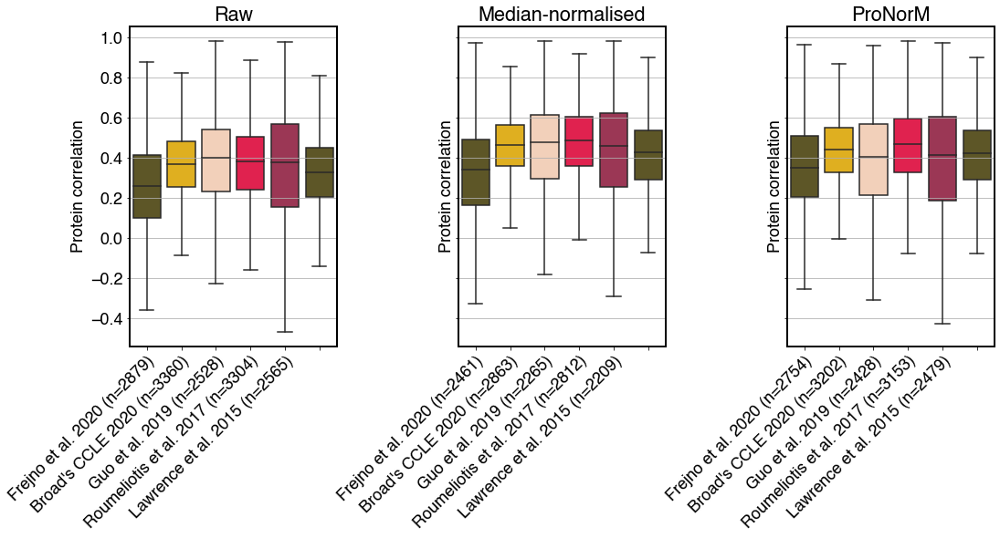

In [27]:
fig, ax = plt.subplots(1, 3, figsize=(15, 8), sharey=True)
ax[0].grid()
ax[1].grid()
ax[2].grid()
sns.boxplot(x='group',
            y='correlation',
            data=raw_df,
            showfliers=False,
            palette=colour_list[1:6],
            ax=ax[0])

sns.boxplot(x='group',
            y='correlation',
            data=median_df,
            palette=colour_list[1:6],
            showfliers=False,
            ax=ax[1])

sns.boxplot(x='group',
            y='correlation',
            data=ruv_df,
            palette=colour_list[1:6],
            showfliers=False,
            ax=ax[2])
ax[0].set_title(r"Raw")
ax[1].set_title(r"Median-normalised")
ax[2].set_title(r"ProNorM")

ax[0].set_xlabel("")
ax[1].set_xlabel("")
ax[2].set_xlabel("")

ax[0].set_ylabel('Protein correlation')
ax[1].set_ylabel('Protein correlation')
ax[2].set_ylabel('Protein correlation')

ax[0].set_xticklabels([
    f"Frejno et al. 2020 (n={res_raw['Kuster'].shape[0]})",
    f"Broad's CCLE 2020 (n={res_raw['Broad'].shape[0]})",
    f"Guo et al. 2019 (n={res_raw['NCI60'].shape[0]})",
    f"Roumeliotis et al. 2017 (n={res_raw['COREAD'].shape[0]})",
    f"Lawrence et al. 2015 (n={res_raw['TNBC'].shape[0]})"
])
ax[1].set_xticklabels([
    f"Frejno et al. 2020 (n={res_median['Kuster'].shape[0]})",
    f"Broad's CCLE 2020 (n={res_median['Broad'].shape[0]})",
    f"Guo et al. 2019 (n={res_median['NCI60'].shape[0]})",
    f"Roumeliotis et al. 2017 (n={res_median['COREAD'].shape[0]})",
    f"Lawrence et al. 2015 (n={res_median['TNBC'].shape[0]})"
])
ax[2].set_xticklabels([
    f"Frejno et al. 2020 (n={res_ruv['Kuster'].shape[0]})",
    f"Broad's CCLE 2020 (n={res_ruv['Broad'].shape[0]})",
    f"Guo et al. 2019 (n={res_ruv['NCI60'].shape[0]})",
    f"Roumeliotis et al. 2017 (n={res_ruv['COREAD'].shape[0]})",
    f"Lawrence et al. 2015 (n={res_ruv['TNBC'].shape[0]})"
])

plt.setp(ax[0].xaxis.get_majorticklabels(),
         rotation=45,
         rotation_mode='anchor',
         ha='right')
plt.setp(ax[1].xaxis.get_majorticklabels(),
         rotation=45,
         rotation_mode='anchor',
         ha='right')
plt.setp(ax[2].xaxis.get_majorticklabels(),
         rotation=45,
         rotation_mode='anchor',
         ha='right')

plt.gcf().subplots_adjust(bottom=0.2)
plt.tight_layout(pad=0.0)
plt.savefig("../../plots/landscape/protein_RNA_correlation.pdf", dpi=500)

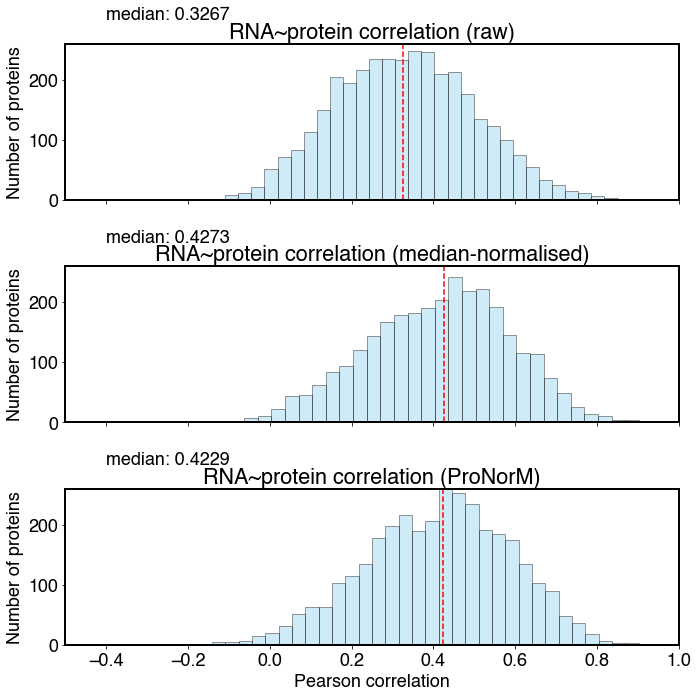

In [28]:
fig, ax = plt.subplots(3, 1, figsize=(10, 10), sharex=True, sharey=True)
sns.distplot(res_raw['RNA'],
             kde=False,
             hist_kws={
                 "linewidth": 1,
                 "edgecolor": "black",
                 "color": "skyblue"
             },
             ax=ax[0])
ax[0].text(-0.4, 300, f"median: {np.median(res_raw['RNA']):.4f}")
ax[0].set_title("RNA~protein correlation (raw)")
ax[0].set_ylim(ax[0].get_ylim())
ax[0].plot((np.median(res_raw['RNA']), np.median(res_raw['RNA'])),
           (0, ax[2].get_ylim()[1]), ls='--', c='red')

sns.distplot(res_median['RNA'],
             kde=False,
             hist_kws={
                 "linewidth": 1,
                 "edgecolor": "black",
                 "color": "skyblue"
             },
             ax=ax[1])
ax[1].text(-0.4, 300, f"median: {np.median(res_median['RNA']):.4f}")
ax[1].plot((np.median(res_median['RNA']), np.median(res_median['RNA'])),
           (0, ax[2].get_ylim()[1]), ls='--', c='red')
ax[1].set_title("RNA~protein correlation (median-normalised)")


sns.distplot(res_ruv['RNA'],
             kde=False,
             hist_kws={
                 "linewidth": 1,
                 "edgecolor": "black",
                 "color": "skyblue"
             },
             ax=ax[2])
ax[2].text(-0.4, 300, f"median: {np.median(res_ruv['RNA']):.4f}")
ax[2].plot((np.median(res_ruv['RNA']), np.median(res_ruv['RNA'])),
           (0, ax[2].get_ylim()[1]), ls='--', c='red')
ax[2].set_title("RNA~protein correlation (ProNorM)")
ax[2].set_xlabel("Pearson correlation")

ax[0].set_ylabel("Number of proteins")
ax[1].set_ylabel("Number of proteins")
ax[2].set_ylabel("Number of proteins")
plt.xlim(-0.5, 1)
fig.tight_layout(pad=1)
plt.savefig("../../plots/landscape/rna_correlation.pdf", dpi=500)

Text(0.5, 0, 'Pearson correlation')

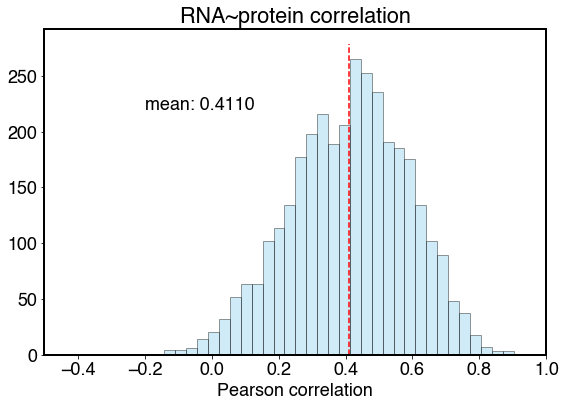

In [131]:
plt.figure(figsize=(9, 6))
ax = sns.distplot(res_ruv['RNA'],
                  kde=False,
#                   bins=20,
                  hist_kws={
                      "linewidth": 1,
                      "edgecolor": "black",
                      "color": "skyblue"
                  })
# ax.text(-0.2, 250, f"median: {np.median(res_ruv['RNA']):.4f}")
ax.text(-0.2, 220, f"mean: {np.mean(res_ruv['RNA']):.4f}")
ax.plot((np.mean(res_ruv['RNA']), np.mean(res_ruv['RNA'])),
        (0, ax.get_ylim()[1]),
        ls='--',
        c='red')
ax.set_xlim(-.5,1)
ax.set_title("RNA~protein correlation")
ax.set_xlabel("Pearson correlation")

In [31]:
pd.DataFrame(res_ruv['RNA'], columns=['protein_rna_correlation']).to_csv(
    "../../plots/plot_data/SuppFig1C_protein_rna_correlation.csv", index=False)

# pair protein correlation

In [14]:
broad = pd.read_csv("../../data/ccle/ccle_proteins_sanger_name.csv").set_index("Cell_line").T
nci60 = pd.read_csv("../../data/tiannan/tianan_protein_processed_common.csv").set_index("Cell_line").T
coread = pd.read_csv("../../data/crc/coread_processed.csv").set_index("Cell_line").T
tnbc = pd.read_csv("../../data/TNBC/TNBC_processed.csv").set_index("Cell_line").T
kuster = pd.read_csv("../../data/Kuster/protein_combined_common_processed.csv").set_index("Cell_line").T

In [44]:
all_datasets = [protein_ruv.T, kuster, broad, nci60, coread, tnbc]
dataset_names = ['CMRI', 'Kuster', 'Broad', 'NCI60', 'COREAD', 'TNBC']

In [45]:
pairs = list(combinations(dataset_names, 2))

In [ ]:
res_mat = np.zeros((len(dataset_names), len(dataset_names)))
for p in pairs:
    dataset1 = all_datasets[dataset_names.index(p[0])]
    dataset2 = all_datasets[dataset_names.index(p[1])]
    res = calc_cellline_correlation(dataset1, dataset2, data='protein')
    res_mat[dataset_names.index(p[0]),
            dataset_names.index(p[1])] = np.nanmedian(res)
    res_mat[dataset_names.index(p[1]),
            dataset_names.index(p[0])] = np.nanmedian(res)

In [47]:
np.fill_diagonal(res_mat, 1)

In [48]:
res_mat

array([[1.        , 0.1075451 , 0.47121078, 0.17544629, 0.39005604,
        0.09355093],
       [0.1075451 , 1.        , 0.1762041 , 0.31487613, 0.15796444,
        0.26402829],
       [0.47121078, 0.1762041 , 1.        , 0.11082074, 0.53111349,
        0.04451302],
       [0.17544629, 0.31487613, 0.11082074, 1.        , 0.08230383,
        0.25124064],
       [0.39005604, 0.15796444, 0.53111349, 0.08230383, 1.        ,
               nan],
       [0.09355093, 0.26402829, 0.04451302, 0.25124064,        nan,
        1.        ]])

In [49]:
labels = [
    f"Sanger&CMRI",
    f"Frejno et al. (2020)",
    f"Broad's CCLE (2020)",
    f"Guo et al. (2019)",
    f"Roumeliotis et al. (2017)",
    f"Lawrence et al. (2015)"
]

Text(0.5, 1, 'Correlation of overlapping cell lines')

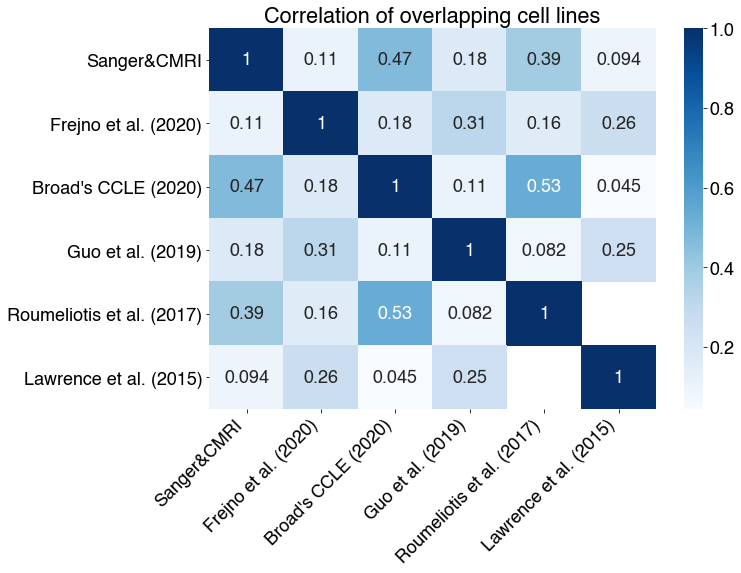

In [53]:
sns.heatmap(res_mat, cmap='Blues', xticklabels=labels, yticklabels=labels,annot=True)
plt.xticks(rotation=45, ha='right')
plt.title("Correlation of overlapping cell lines")

# drug scatter

In [141]:
name_map = pd.read_csv("../../data/misc/HUMAN_9606_idmapping.gene_prot.dat",
                       sep='\t',
                       names=['ID', 'type', 'code'])
name_map = name_map.drop_duplicates(['ID', 'type'])
name_map = pd.pivot(name_map, index='ID', columns='type', values='code').dropna()

protein2rna_map = dict(zip(name_map['UniProtKB-ID'].values, name_map['Gene_Name'].values))
rna2protein_map = {v: k for k, v in protein2rna_map.items()}

In [142]:
set(protein_ruv.columns) - set(protein2rna_map.keys())

set()

In [59]:
rna_raw = pd.read_csv("../../data/rna/rnaseq_voom.csv", index_col=0).T

rna_raw.index.name = 'SIDM'

rna_raw = rna_raw.reset_index()
rna_sample = pd.merge(rna_raw,
                      meta[['SIDM',
                            'Cell_line']].drop_duplicates()).drop(['SIDM'],
                                                                  axis=1)

rna_sample = rna_sample.set_index(['Cell_line'])

In [72]:
broad = pd.read_csv("../../data/ccle/ccle_proteins_sanger_name.csv").set_index("Cell_line")

In [73]:
drug_df = pd.read_csv('../../data/drug/drug_final_processed_eg_id.csv.gz', low_memory=False)

In [74]:
drug_df['max_screening_conc_ln'] = drug_df['max_screening_conc'].map(np.log)

In [75]:
max_conc_map = drug_df[[
    'drug_id', 'max_screening_conc_ln'
]].drop_duplicates().set_index('drug_id').to_dict()['max_screening_conc_ln']

In [79]:
def plot_drug_box(drug_df,
                  protein_df,
                  rna_df,
                  drug_id,
                  target,
                  step=0.2,
                  tissues=[],
                  write_df=False,source='ProCan&Sanger'):
    if target in protein2rna_map:
        protein_target = target
        rna_target = protein2rna_map[target]
    elif target in protein2rna_map:
        print("No pair found.")
        return

    ic50_map = drug_df[drug_df['drug_id'] == drug_id].set_index(
        'cell_line_name').to_dict()['ln_IC50']
    tmp_data_protein = protein_df[[protein_target]]
    tmp_data_rna = rna_df[[rna_target]]
    tmp_data = pd.merge(tmp_data_protein, tmp_data_rna, on='Cell_line')
    tmp_data.loc[:, 'IC50'] = tmp_data.index.map(ic50_map).values
    tmp_data.loc[:, 'tissue'] = tmp_data.index.map(tissue_type_map).values
    tmp_data = tmp_data.dropna().reset_index(drop=True)

    tmp_data['protein_q'] = pd.qcut(tmp_data[protein_target],
                                    np.arange(0, 1.0001, step),
                                    duplicates='drop')
    tmp_data['rna_q'] = pd.qcut(tmp_data[rna_target],
                                np.arange(0, 1.0001, step),
                                duplicates='drop')
    if write_df:
        tmp_data.to_csv(
            f"../../plots/plot_data/bin_plots/bin_plot_all_{drug_id}_{target}.csv",
            index=False)

    if len(tissues) == 0:
        tissues = tmp_data['tissue'].unique()

    fig, ax = plt.subplots(len(tissues) + 2,
                           2,
                           figsize=(18, 3 * (len(tissues) + 1)))

    sns.boxplot(x='protein_q',
                y='IC50',
                data=tmp_data,
                ax=ax[0, 0],
                color='grey',
                medianprops={'color': 'red'},
                showfliers=True)
    sns.boxplot(x='rna_q',
                y='IC50',
                data=tmp_data,
                ax=ax[0, 1],
                color='grey',
                medianprops={'color': 'blue'},
                showfliers=True)

    
    ax[0, 0].set_xticks([])
    ax[0, 1].set_xticks([])
    ax[0, 0].set_xlabel(protein_target)
    ax[0, 1].set_xlabel(rna_target)
    max_conc = max_conc_map[drug_id]

    ax[0, 0].text(-3, max_conc, "Max\nconcentration", va='center')
    ax[0, 0].plot([-3, int(1 / step) - 0.5], [max_conc, max_conc],
                  color='black',
                  linewidth=2,
                  linestyle='--')
    ax[0, 0].text(0.05,
                  0.1,
                  f"($n={tmp_data['IC50'].shape[0]}$)",
                  ha='left',
                  va='center',
                  transform=ax[0, 0].transAxes,
                  fontsize=14)
    ax[0, 1].text(-3, max_conc, "Max\nconcentration", va='center')
    ax[0, 1].plot([-3, int(1 / step) - 0.5], [max_conc, max_conc],
                  color='black',
                  linewidth=2,
                  linestyle='--')
    ax[0, 1].text(0.05,
                  0.1,
                  f"($n={tmp_data['IC50'].shape[0]}$)",
                  ha='left',
                  va='center',
                  transform=ax[0, 1].transAxes,
                  fontsize=14)

    # no haem
    tmp_data_noblood = tmp_data[
        tmp_data['tissue'] != 'Haematopoietic and Lymphoid'].reset_index(
            drop=True)
    tmp_data_noblood['protein_q'] = pd.qcut(tmp_data_noblood[protein_target],
                                            np.arange(0, 1.0001, step),
                                            duplicates='drop')
    tmp_data_noblood['rna_q'] = pd.qcut(tmp_data_noblood[rna_target],
                                        np.arange(0, 1.0001, step),
                                        duplicates='drop')
    if write_df:
        tmp_data_noblood.to_csv(
            f"../../plots/plot_data/bin_plots/bin_plot_noblood_{drug_id}_{target}.csv",
            index=False)

    sns.boxplot(x='protein_q',
                y='IC50',
                data=tmp_data_noblood,
                ax=ax[1, 0],
                color='grey',
                medianprops={'color': 'red'},
                showfliers=True)
    sns.boxplot(x='rna_q',
                y='IC50',
                data=tmp_data_noblood,
                ax=ax[1, 1],
                color='grey',
                medianprops={'color': 'blue'},
                showfliers=True)
    
    ax[1, 1].set_title(f"{drug_id}~RNA-All except blood")
    ax[0, 1].set_title(f"{drug_id}~RNA-All")
    
    if source.lower() !='ccle':
        ax[1, 0].set_title(f"{drug_id}~Protein-All except blood")
        ax[0, 0].set_title(f"{drug_id}~Protein-All")
        
    else:
        ax[1, 0].set_title(f"{drug_id}~Protein-All except blood (CCLE)")
        ax[0, 0].set_title(f"{drug_id}~Protein-All (CCLE)")
    ax[1, 0].set_xticks([])
    ax[1, 1].set_xticks([])
    ax[1, 0].set_xlabel(protein_target)
    ax[1, 1].set_xlabel(rna_target)
    max_conc = max_conc_map[drug_id]

    ax[1, 0].text(-3, max_conc, "Max\nconcentration", va='center')
    ax[1, 0].plot([-3, int(1 / step) - 0.5], [max_conc, max_conc],
                  color='black',
                  linewidth=2,
                  linestyle='--')
    ax[1, 0].text(0.05,
                  0.1,
                  f"($n={tmp_data_noblood['IC50'].shape[0]}$)",
                  ha='left',
                  va='center',
                  transform=ax[1, 0].transAxes,
                  fontsize=14)
    ax[1, 1].text(-3, max_conc, "Max\nconcentration", va='center')
    ax[1, 1].plot([-3, int(1 / step) - 0.5], [max_conc, max_conc],
                  color='black',
                  linewidth=2,
                  linestyle='--')
    ax[1, 1].text(0.05,
                  0.1,
                  f"($n={tmp_data_noblood['IC50'].shape[0]}$)",
                  ha='left',
                  va='center',
                  transform=ax[1, 1].transAxes,
                  fontsize=14)

    tissues = sorted(tissues)
    for i in range(len(tissues)):
        tissue = tissues[i]
        tmp_data_tissue = tmp_data[tmp_data['tissue'] == tissue].reset_index(
            drop=True)
        if tmp_data_tissue[protein_target].unique(
        ).size == 1 or tmp_data_tissue[rna_target].unique().size == 1:
            continue
        tmp_data_tissue.loc[:, 'protein_q'] = pd.qcut(
            tmp_data_tissue[protein_target],
            np.arange(0, 1.0001, step),
            duplicates='drop')
        tmp_data_tissue.loc[:, 'rna_q'] = pd.qcut(tmp_data_tissue[rna_target],
                                                  np.arange(0, 1.0001, step),
                                                  duplicates='drop')
        if write_df:
            tmp_data_tissue.to_csv(
                f"../../plots/plot_data/bin_plots/bin_plot_{tissue}_{drug_id}_{target}.csv",
                index=False)

        sns.boxplot(x='protein_q',
                    y='IC50',
                    data=tmp_data_tissue,
                    ax=ax[(i + 2), 0],
                    color=tissue_colours[tissue],
                    medianprops={'color': 'red'},
                    showfliers=True)
        sns.boxplot(x='rna_q',
                    y='IC50',
                    data=tmp_data_tissue,
                    ax=ax[(i + 2), 1],
                    color=tissue_colours[tissue],
                    medianprops={'color': 'blue'},
                    showfliers=True)

        if source.lower() != "ccle":
            ax[(i + 2), 0].set_title(f"Protein-{tissue}")
            ax[(i + 2), 1].set_title(f"RNA-{tissue}")
        else:
            ax[(i + 2), 0].set_title(f"Protein-{tissue} (CCLE)")
            ax[(i + 2), 1].set_title(f"RNA-{tissue} (CCLE)")
        ax[(i + 2), 0].set_xticks([])
        ax[(i + 2), 1].set_xticks([])
        ax[(i + 2), 0].set_xlabel(protein_target)
        ax[(i + 2), 1].set_xlabel(rna_target)

        ax[(i + 2), 0].text(-3, max_conc, "Max\nconcentration", va='center')
        ax[(i + 2), 0].text(0.05,
                            0.1,
                            f"($n={tmp_data_tissue['IC50'].shape[0]}$)",
                            ha='left',
                            va='center',
                            transform=ax[(i + 2), 0].transAxes,
                            fontsize=14)
        ax[(i + 2), 1].text(-3, max_conc, "Max\nconcentration", va='center')
        ax[(i + 2), 1].text(0.05,
                            0.1,
                            f"($n={tmp_data_tissue['IC50'].shape[0]}$)",
                            ha='left',
                            va='center',
                            transform=ax[(i + 2), 1].transAxes,
                            fontsize=14)

        ax[(i + 2), 0].plot([-3, int(1 / step) - 0.5], [max_conc, max_conc],
                            color='black',
                            linewidth=2,
                            linestyle='--')
        ax[(i + 2), 1].plot([-3, int(1 / step) - 0.5], [max_conc, max_conc],
                            color='black',
                            linewidth=2,
                            linestyle='--')
    fig.tight_layout(pad=0.4)
    plt.subplots_adjust(hspace=0.5, wspace=0.2)

    return

In [80]:
def plot_drug_scatter(drug_df,
                      protein_df,
                      rna_df,
                      drug_id,
                      target,
                      noblood=False,
                      tissues=[],
                      plot_all=True, source='ProCan&Sanger'):
    if target in protein2rna_map:
        protein_target = target
        rna_target = protein2rna_map[target]
    elif target in protein2rna_map:
        print("No pair found.")
        return

    ic50_map = drug_df[drug_df['drug_id'] == drug_id].set_index(
        'cell_line_name').to_dict()['ln_IC50']
    tmp_data_protein = protein_df[[protein_target]]
    tmp_data_rna = rna_df[[rna_target]]
    tmp_data = pd.merge(tmp_data_protein, tmp_data_rna, on='Cell_line')
    tmp_data.loc[:, 'IC50'] = tmp_data.index.map(ic50_map).values
    tmp_data.loc[:, 'tissue'] = tmp_data.index.map(tissue_type_map).values
    tmp_data = tmp_data.dropna().reset_index(drop=True)
    if noblood:
        tmp_data = tmp_data[
            tmp_data['tissue'] != 'Haematopoietic and Lymphoid'].reset_index(
                drop=True)
    if len(tissues) > 0:
        if not plot_all:
            tmp_data = tmp_data[tmp_data['tissue'].isin(tissues)].reset_index(
                drop=True)
        else:
            tmp_data.loc[~tmp_data['tissue'].isin(tissues), 'tissue'] = 'Other'
    else:
        tissues = tmp_data['tissue'].unique()

    fig, ax = plt.subplots(1, 2, figsize=(16, 7))
    sns.scatterplot(x=protein_target,
                    y='IC50',
                    hue='tissue',
                    hue_order=sorted(tmp_data['tissue'].unique()),
                    data=tmp_data,
                    palette=tissue_colours,
                    edgecolor='black',
                    linewidth=0.4,
                    ax=ax[0],
                    legend=None)

    sns.scatterplot(x=rna_target,
                    y='IC50',
                    hue='tissue',
                    data=tmp_data,
                    hue_order=sorted(tmp_data['tissue'].unique()),
                    palette=tissue_colours,
                    edgecolor='black',
                    linewidth=0.4,
                    ax=ax[1])

    reg = LinearRegression()
    reg.fit(
        tmp_data[tmp_data['tissue'] != 'Other'][protein_target].values.reshape(
            -1, 1), tmp_data[tmp_data['tissue'] != 'Other']['IC50'])
    y_pred = reg.predict(tmp_data[protein_target].values.reshape(-1, 1))
    ax[0].plot(tmp_data[protein_target], y_pred, color='red')
    r, pval = pearsonr(tmp_data[tmp_data['tissue'] != 'Other'][protein_target],
                       tmp_data[tmp_data['tissue'] != 'Other']['IC50'])
    ax[0].text(0.05,
               0.05,
               f"$R={r:.4f}$ $p=${pval:.1e}",
               ha='left',
               va='center',
               transform=ax[0].transAxes,
               fontsize=14)
    ax[0].text(
        0.95,
        0.95,
        f"($n={tmp_data[tmp_data['tissue'].isin(tissues)]['IC50'].shape[0]}$)",
        ha='right',
        va='center',
        transform=ax[0].transAxes,
        fontsize=14)
    

    reg = LinearRegression()
    reg.fit(
        tmp_data[tmp_data['tissue'] != 'Other'][rna_target].values.reshape(
            -1, 1), tmp_data[tmp_data['tissue'] != 'Other']['IC50'])
    y_pred = reg.predict(tmp_data[rna_target].values.reshape(-1, 1))
    ax[1].plot(tmp_data[rna_target], y_pred, color='red')
    r, pval = pearsonr(tmp_data[tmp_data['tissue'] != 'Other'][rna_target],
                       tmp_data[tmp_data['tissue'] != 'Other']['IC50'])
    ax[1].text(0.05,
               0.05,
               f"$R={r:.4f}$ $p=${pval:.1e}",
               ha='left',
               va='center',
               transform=ax[1].transAxes,
               fontsize=14)
            
    ax[1].set_title(f"{drug_id}~RNA")

    if source.lower() != 'ccle':
        ax[0].set_title(f"{drug_id}~Protein")
    else:
        ax[0].set_title(f"{drug_id}~Protein(CCLE)")

    # plot max conc
    max_conc = max_conc_map[drug_id]
    ax[0].text(ax[0].get_xlim()[0],
               max_conc,
               "Max\nconcentration:",
               ha='left',
               va='center')
    ax[1].text(ax[1].get_xlim()[0],
               max_conc,
               "Max\nconcentration:",
               ha='left',
               va='center')
    ax[1].text(ax[1].get_xlim()[0],
               max_conc,
               "Max\nconcentration:",
               ha='left',
               va='center')
    ax[1].text(
        0.95,
        0.95,
        f"($n={tmp_data[tmp_data['tissue'].isin(tissues)]['IC50'].shape[0]}$)",
        ha='right',
        va='center',
        transform=ax[1].transAxes,
        fontsize=14)

    ax[0].plot(ax[0].get_xlim(), [max_conc, max_conc],
               color='black',
               linewidth=2,
               linestyle='--')
    ax[1].plot(ax[1].get_xlim(), [max_conc, max_conc],
               color='black',
               linewidth=2,
               linestyle='--')

    plt.legend(bbox_to_anchor=(1.02, 1),
               loc=2,
               borderaxespad=0.,
               prop={'size': 10})
    ax[0].grid()
    ax[1].grid()
    return

## 1373;Dabrafenib;GDSC1

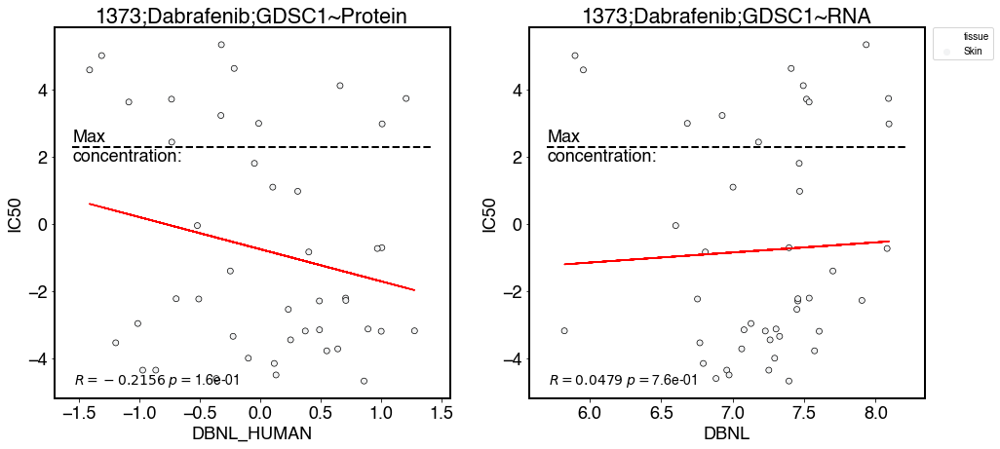

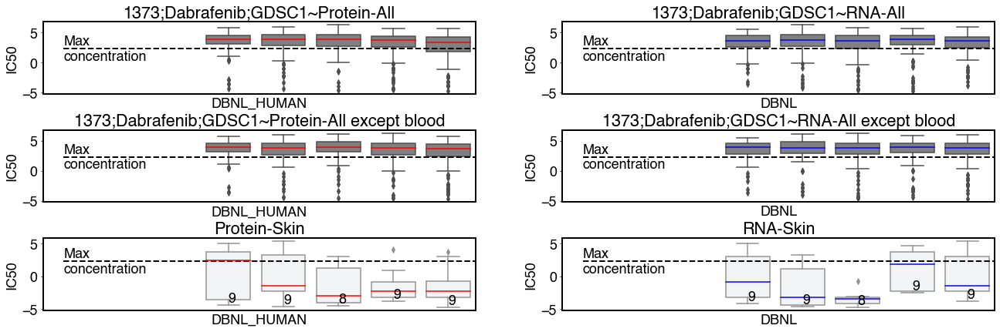

In [86]:
drug_id = '1373;Dabrafenib;GDSC1'
protein = 'DBNL_HUMAN'
plot_drug_scatter(drug_df, protein_ruv, rna_sample, drug_id, protein, tissues=['Skin'])
plot_drug_box(drug_df, protein_ruv, rna_sample, drug_id, protein,step=0.2, tissues=['Skin'])

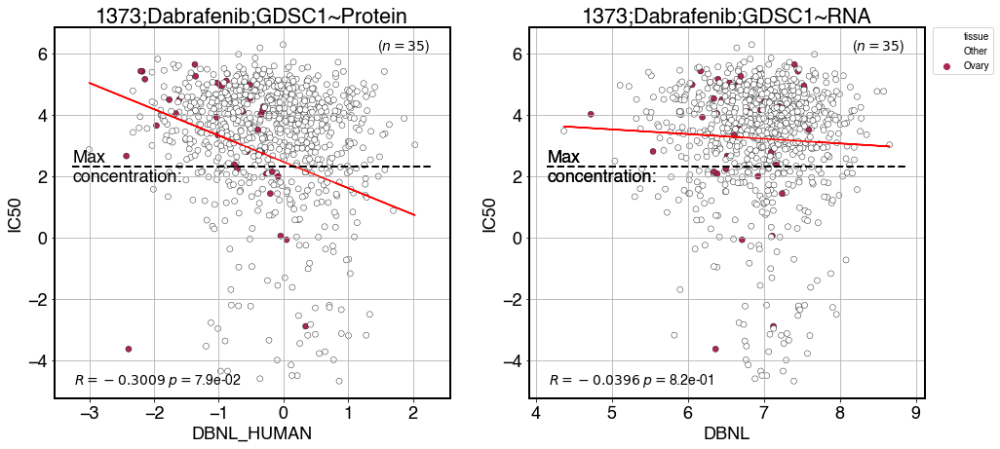

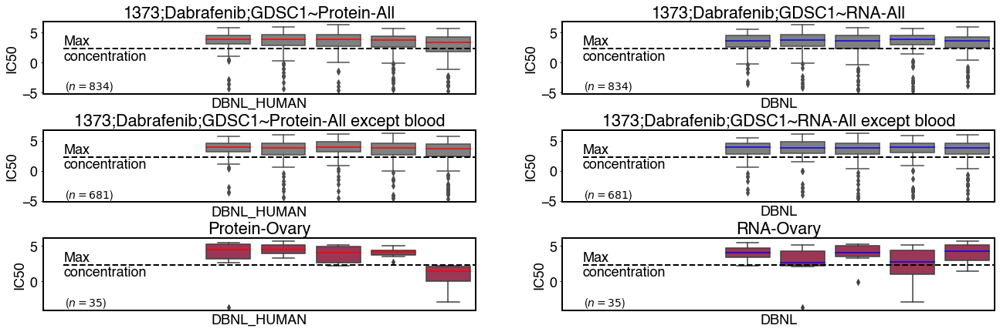

In [42]:
drug_id = '1373;Dabrafenib;GDSC1'
protein = 'DBNL_HUMAN'
plot_drug_scatter(drug_df, protein_ruv, rna_sample, drug_id, protein, tissues=['Ovary'])
plot_drug_box(drug_df, protein_ruv, rna_sample, drug_id, protein,step=0.2, tissues=['Ovary'], write_df=True)

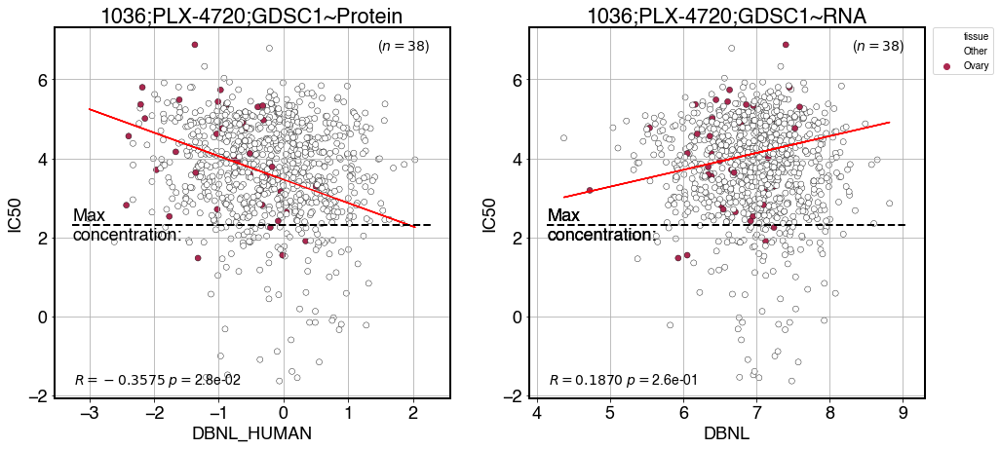

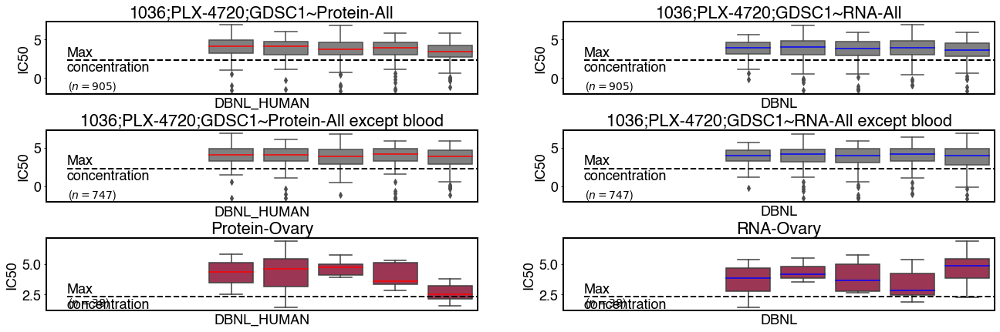

In [43]:
drug_id = '1036;PLX-4720;GDSC1'
protein = 'DBNL_HUMAN'
plot_drug_scatter(drug_df, protein_ruv, rna_sample, drug_id, protein, tissues=['Ovary'])
plot_drug_box(drug_df, protein_ruv, rna_sample, drug_id, protein,step=0.2, tissues=['Ovary'], write_df=True)

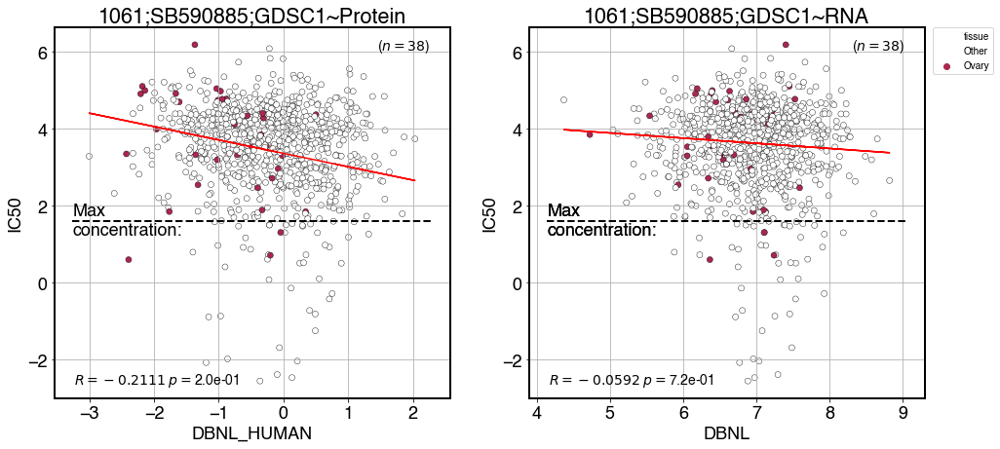

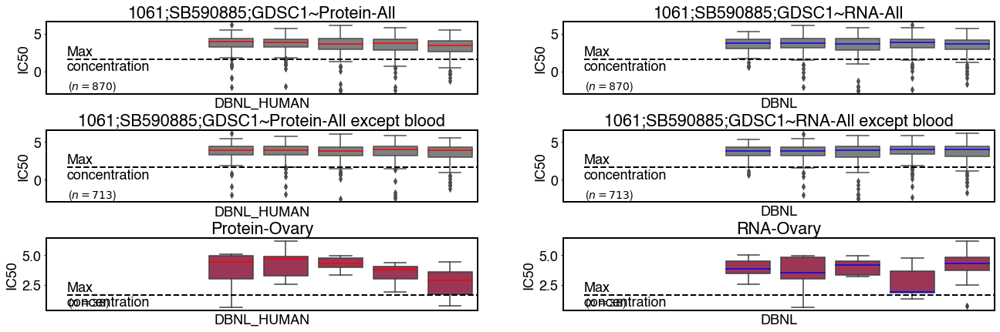

In [44]:
drug_id = '1061;SB590885;GDSC1'
protein = 'DBNL_HUMAN'
plot_drug_scatter(drug_df, protein_ruv, rna_sample, drug_id, protein, tissues=['Ovary'])
plot_drug_box(drug_df, protein_ruv, rna_sample, drug_id, protein,step=0.2, tissues=['Ovary'], write_df=True)

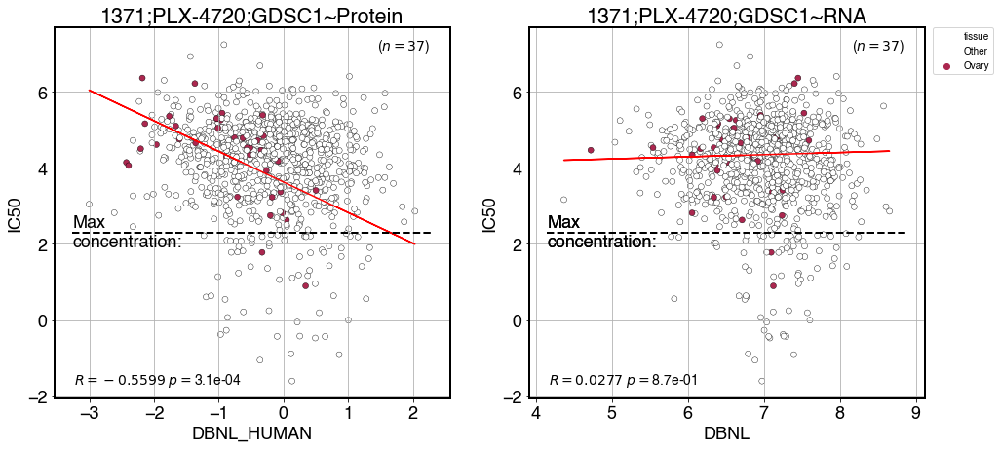

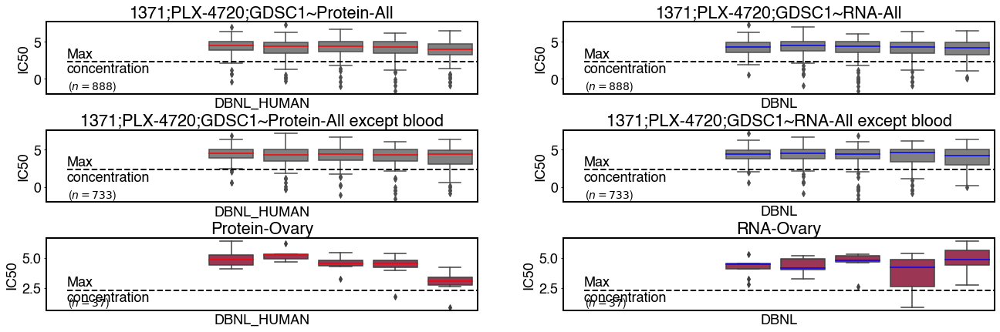

In [107]:
drug_id = '1371;PLX-4720;GDSC1'
protein = 'DBNL_HUMAN'
plot_drug_scatter(drug_df, protein_ruv, rna_sample, drug_id, protein, tissues=['Ovary'])
plot_drug_box(drug_df, protein_ruv, rna_sample, drug_id, protein,step=0.2, tissues=['Ovary'])

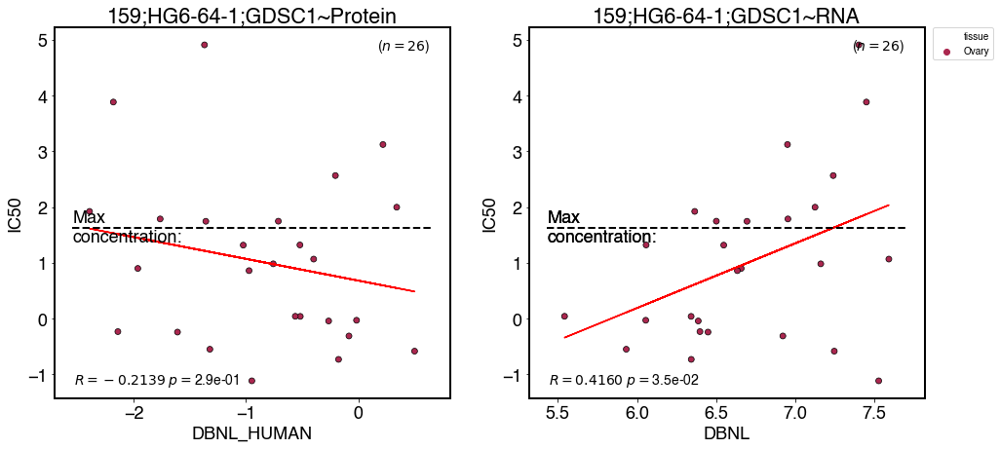

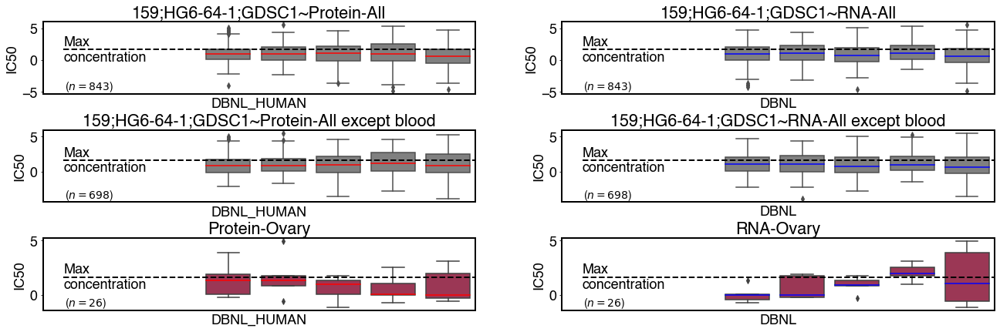

In [35]:
drug_id = '159;HG6-64-1;GDSC1'
protein = 'DBNL_HUMAN'
plot_drug_scatter(drug_df, protein_ruv, rna_sample, drug_id, protein, tissues=['Ovary'])
plot_drug_box(drug_df, protein_ruv, rna_sample, drug_id, protein,step=0.2, tissues=['Ovary'])

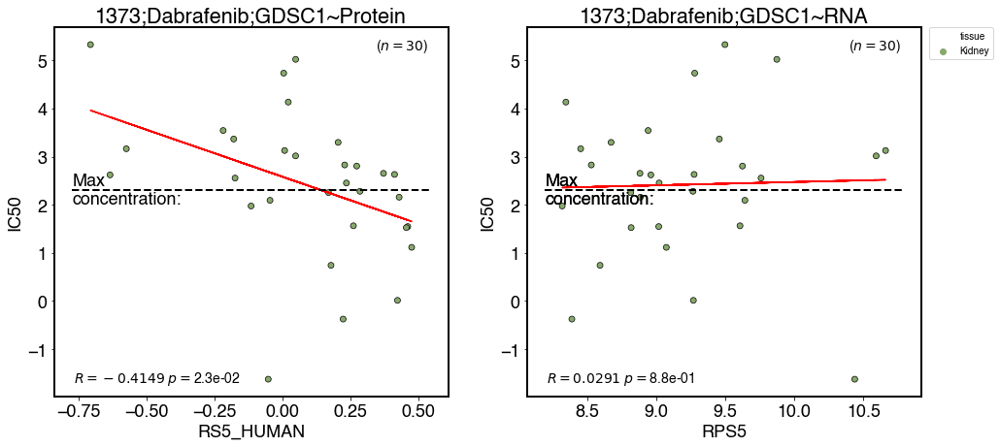

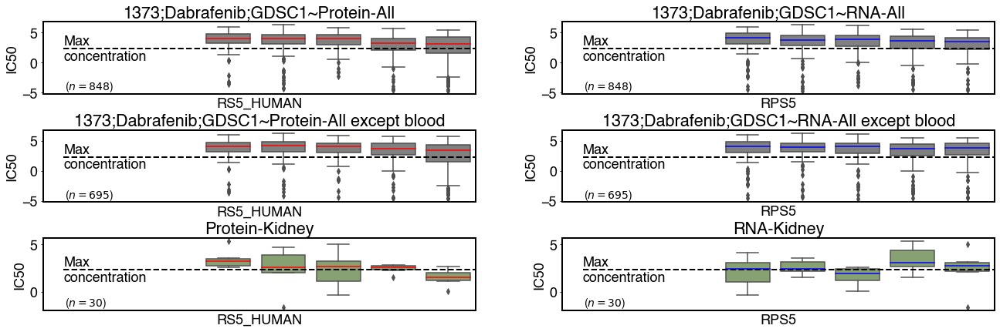

In [147]:
drug_id = '1373;Dabrafenib;GDSC1'
protein = 'RS5_HUMAN'
plot_drug_scatter(drug_df, protein_ruv, rna_sample, drug_id, protein, tissues=['Kidney'])
plot_drug_box(drug_df, protein_ruv, rna_sample, drug_id, protein,step=0.2, tissues=['Kidney'])

## 1373;Dabrafenib;GDSC2

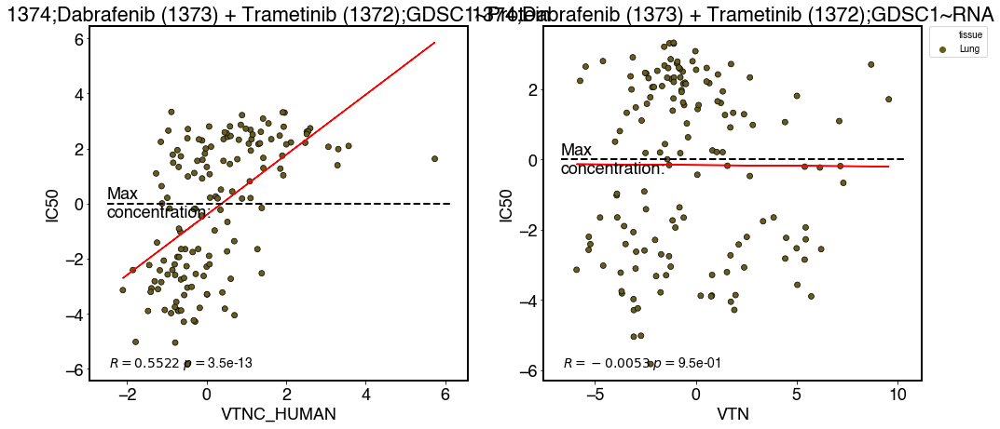

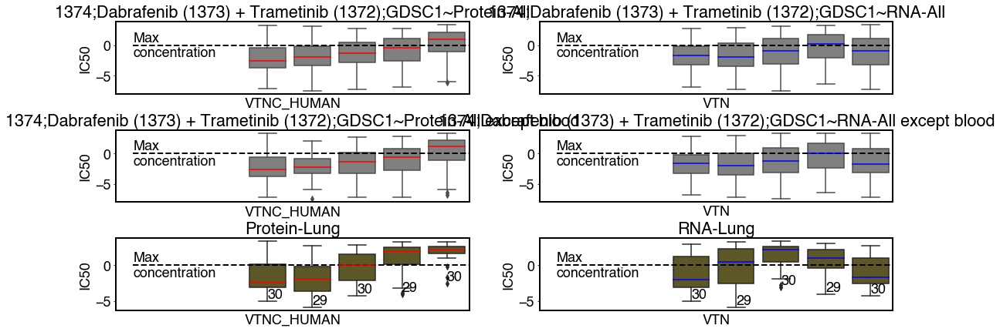

In [98]:
drug_id = '1374;Dabrafenib (1373) + Trametinib (1372);GDSC1'
protein = 'VTNC_HUMAN'
plot_drug_scatter(drug_df, protein_ruv, rna_sample, drug_id, protein, tissues=['Lung'])
plot_drug_box(drug_df, protein_ruv, rna_sample, drug_id, protein,step=0.2, tissues=['Lung'])

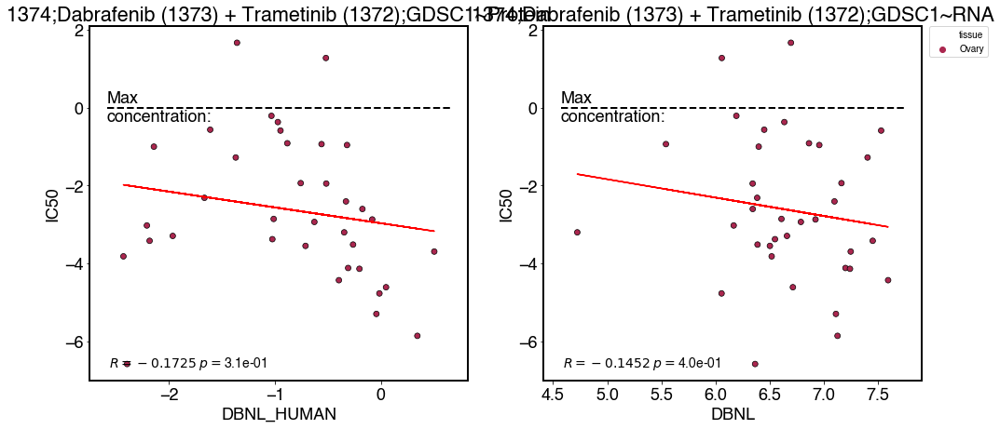

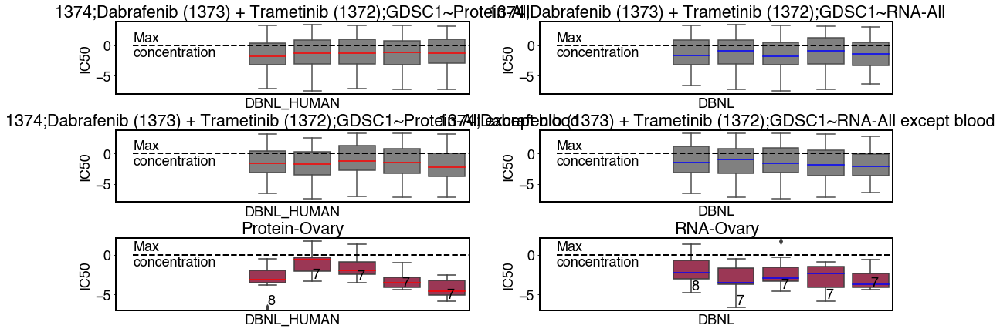

In [89]:
drug_id = '1374;Dabrafenib (1373) + Trametinib (1372);GDSC1'
protein = 'DBNL_HUMAN'
plot_drug_scatter(drug_df, protein_ruv, rna_sample, drug_id, protein, tissues=['Ovary'])
plot_drug_box(drug_df, protein_ruv, rna_sample, drug_id, protein,step=0.2, tissues=['Ovary'])

## 1427;AZD5582;GDSC1

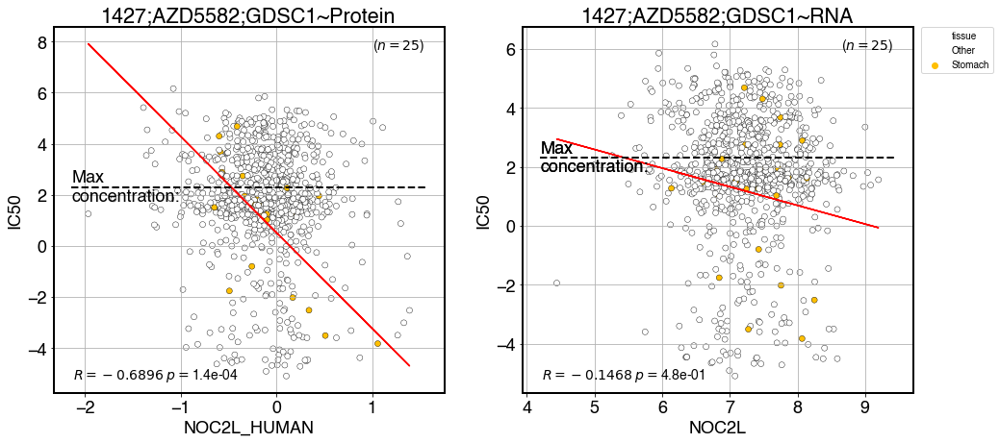

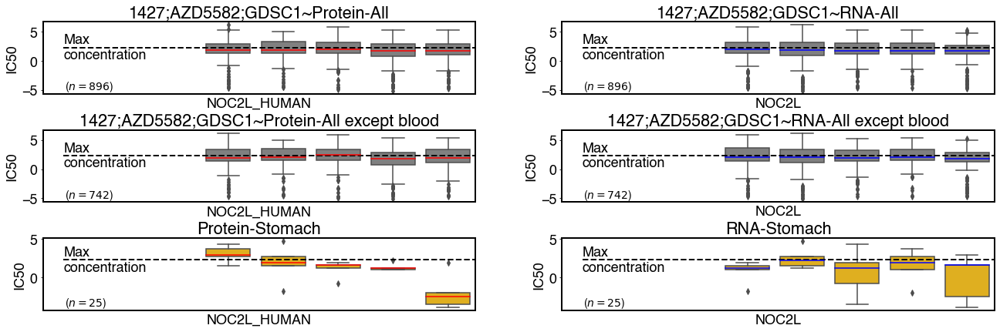

In [45]:
drug_id = '1427;AZD5582;GDSC1'
protein = 'NOC2L_HUMAN'
plot_drug_scatter(drug_df, protein_ruv, rna_sample, drug_id, protein, tissues=['Stomach'])
plot_drug_box(drug_df, protein_ruv, rna_sample, drug_id, protein, step=0.2, tissues=['Stomach'], write_df=True)

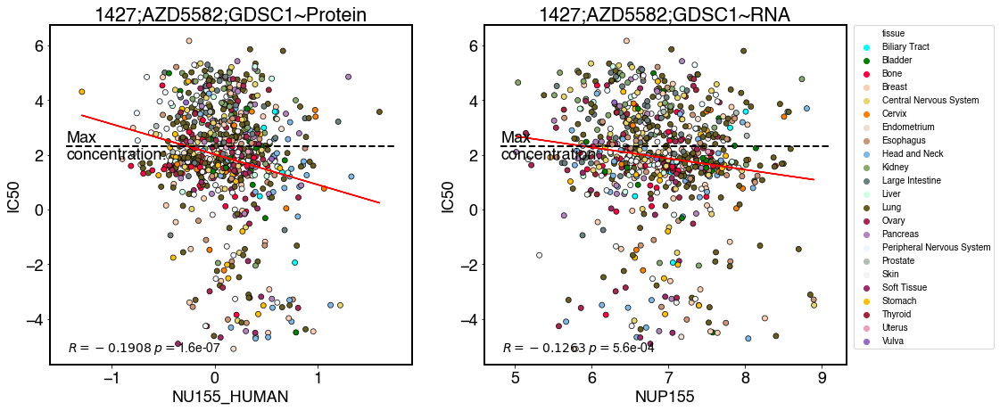

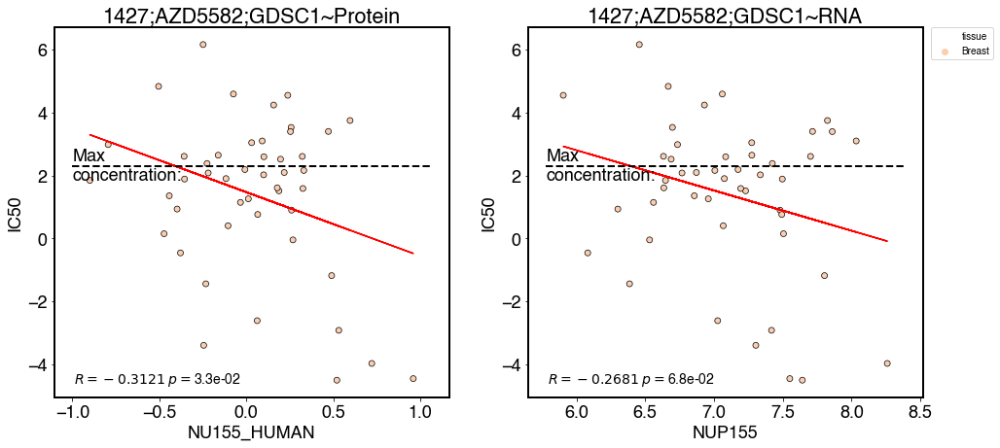

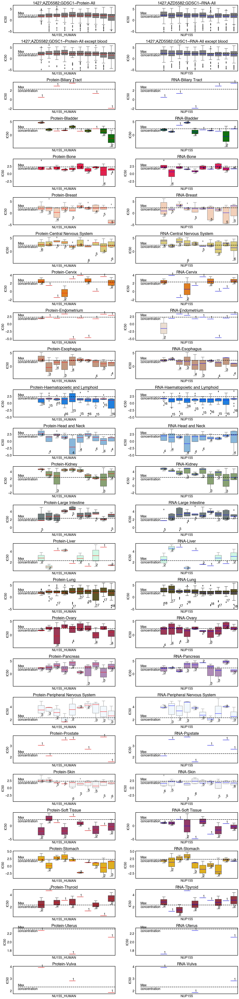

In [352]:
drug_id = '1427;AZD5582;GDSC1'
protein = 'NU155_HUMAN'
plot_drug_scatter(drug_df, protein_ruv, rna_sample, drug_id, protein, noblood=True)
plot_drug_scatter(drug_df, protein_ruv, rna_sample, drug_id, protein, noblood=True, tissues=['Breast'])
plot_drug_box(drug_df, protein_ruv, rna_sample, drug_id, protein, step=0.1)

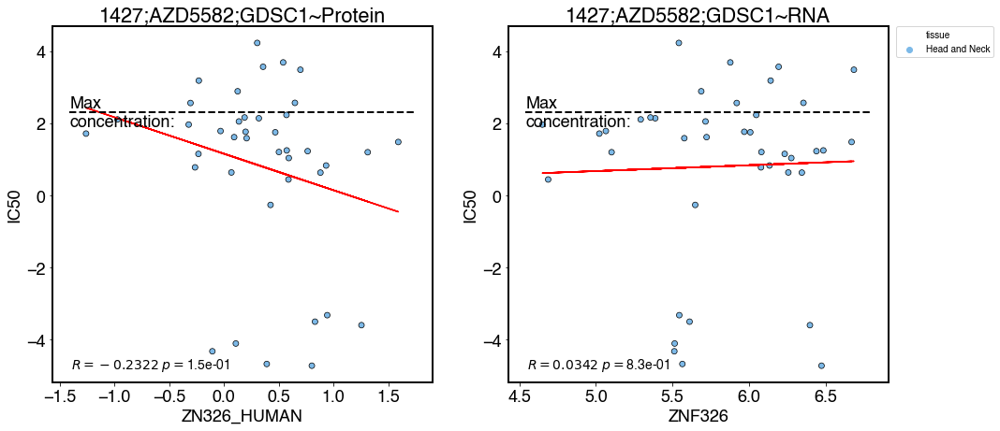

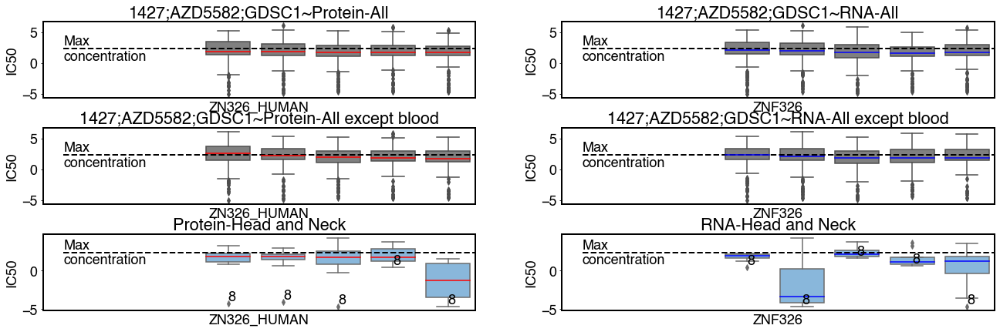

In [370]:
drug_id = '1427;AZD5582;GDSC1'
protein = 'ZN326_HUMAN'
plot_drug_scatter(drug_df, protein_ruv, rna_sample, drug_id, protein, noblood=True, tissues=['Head and Neck'])
plot_drug_box(drug_df, protein_ruv, rna_sample, drug_id, protein, step=0.2, tissues=['Head and Neck'])

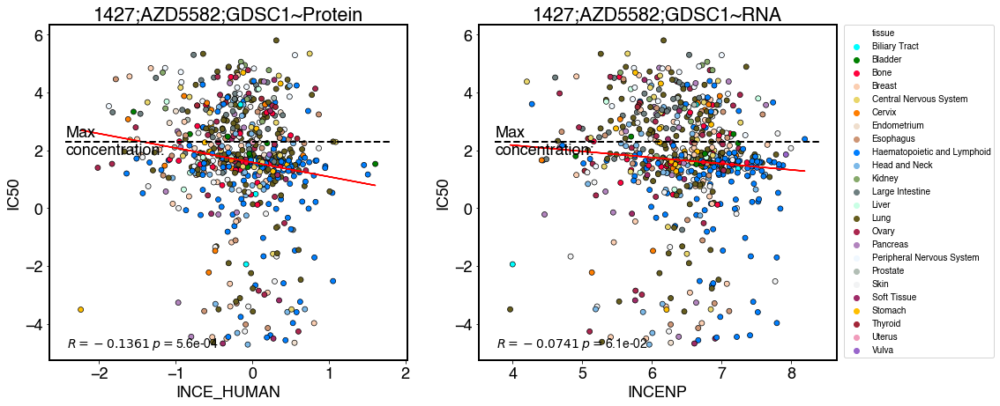

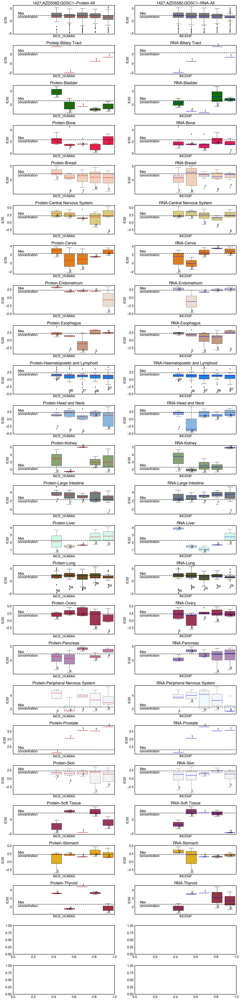

In [211]:
drug_id = '1427;AZD5582;GDSC1'
protein = 'INCE_HUMAN'
plot_drug_scatter(drug_df, protein_ruv, rna_sample, drug_id, protein)
plot_drug_box(drug_df, protein_ruv, rna_sample, drug_id, protein, step=0.2)

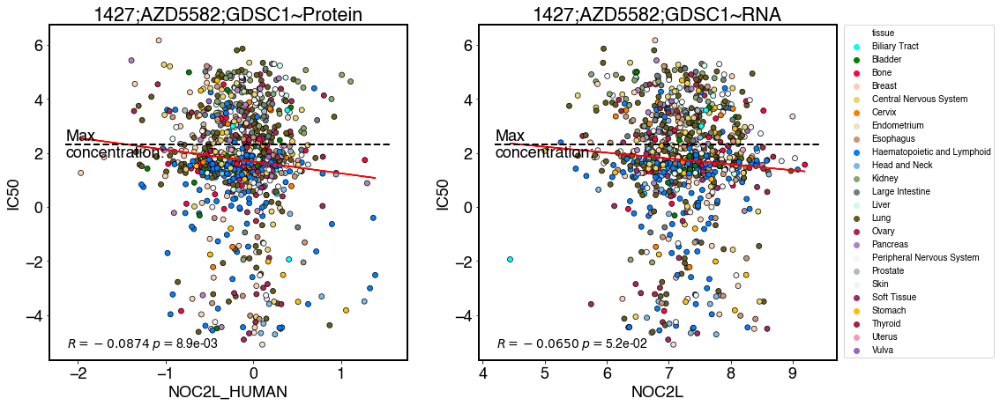

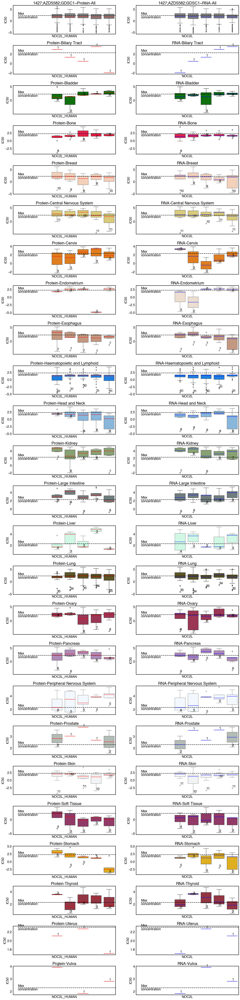

In [254]:
drug_id = '1427;AZD5582;GDSC1'
protein = 'NOC2L_HUMAN'
plot_drug_scatter(drug_df, protein_ruv, rna_sample, drug_id, protein)
plot_drug_box(drug_df, protein_ruv, rna_sample, drug_id, protein, step=0.2)

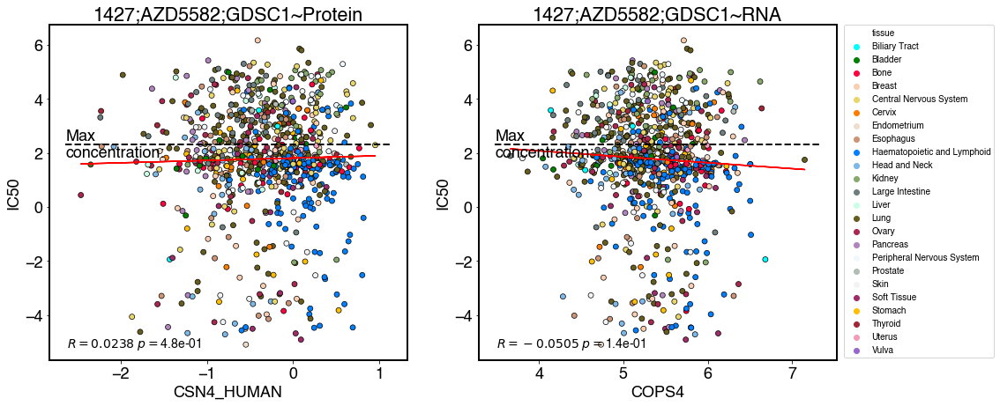

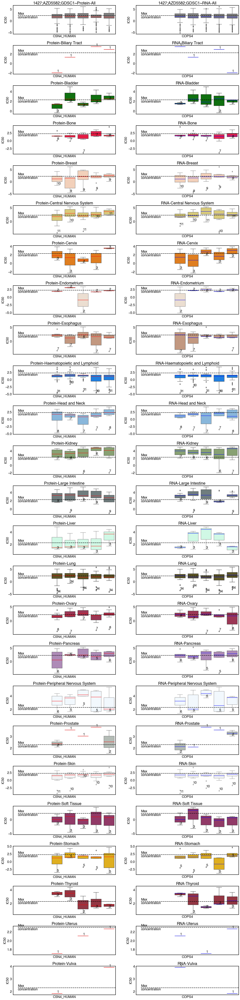

In [257]:
drug_id = '1427;AZD5582;GDSC1'
protein = 'CSN4_HUMAN'
plot_drug_scatter(drug_df, protein_ruv, rna_sample, drug_id, protein)
plot_drug_box(drug_df, protein_ruv, rna_sample, drug_id, protein, step=0.2)

## 1429;IAP_7638;GDSC1

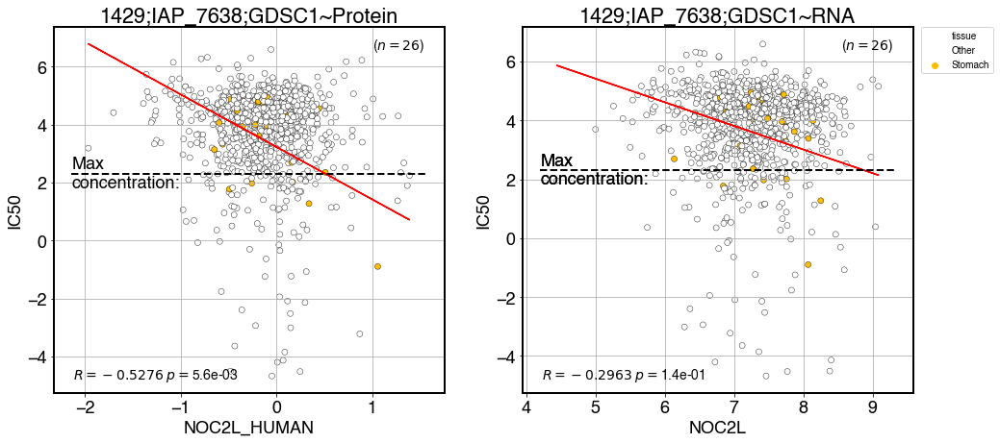

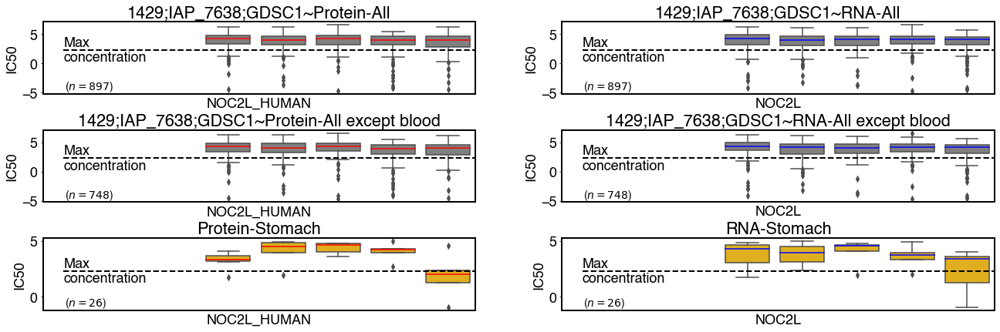

In [46]:
drug_id = '1429;IAP_7638;GDSC1'
protein = 'NOC2L_HUMAN'
plot_drug_scatter(drug_df, protein_ruv, rna_sample, drug_id, protein, tissues=['Stomach'])
plot_drug_box(drug_df, protein_ruv, rna_sample, drug_id, protein, step=0.2, tissues=['Stomach'], write_df=True)

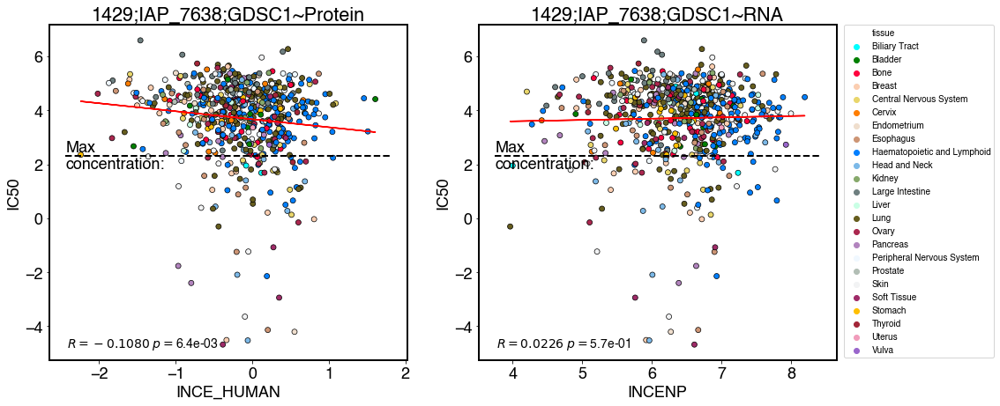

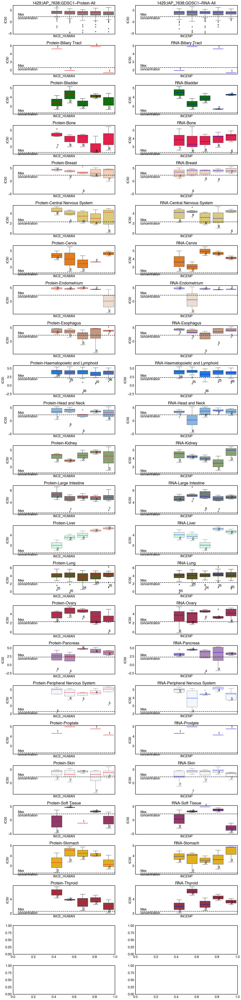

In [212]:
drug_id = '1429;IAP_7638;GDSC1'
protein = 'INCE_HUMAN'
plot_drug_scatter(drug_df, protein_ruv, rna_sample, drug_id, protein)
plot_drug_box(drug_df, protein_ruv, rna_sample, drug_id, protein, step=0.2)

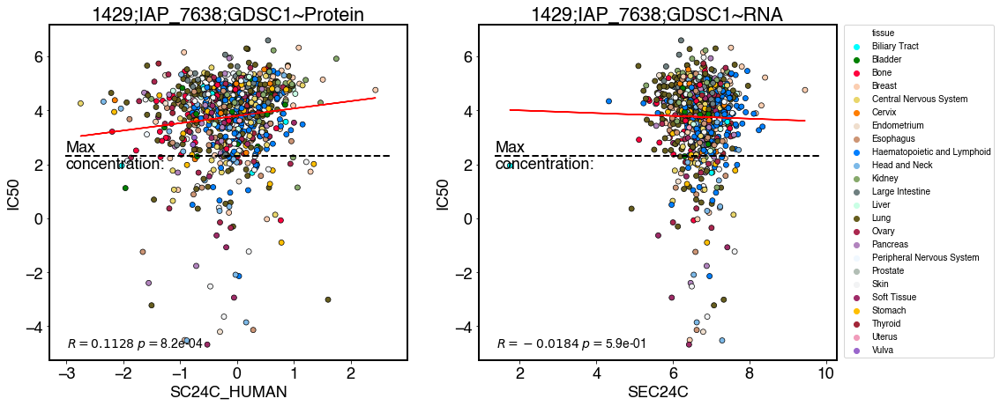

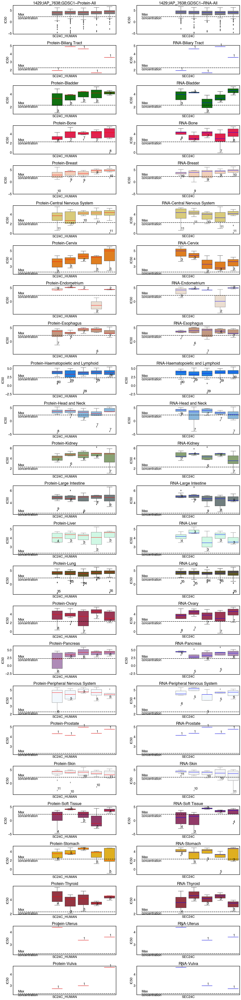

In [246]:
drug_id = '1429;IAP_7638;GDSC1'
protein = 'SC24C_HUMAN'
plot_drug_scatter(drug_df, protein_ruv, rna_sample, drug_id, protein)
plot_drug_box(drug_df, protein_ruv, rna_sample, drug_id, protein, step=0.2)

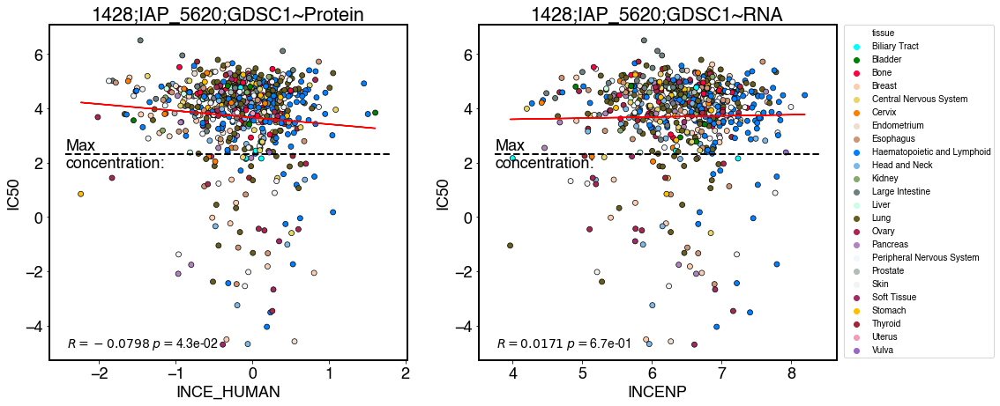

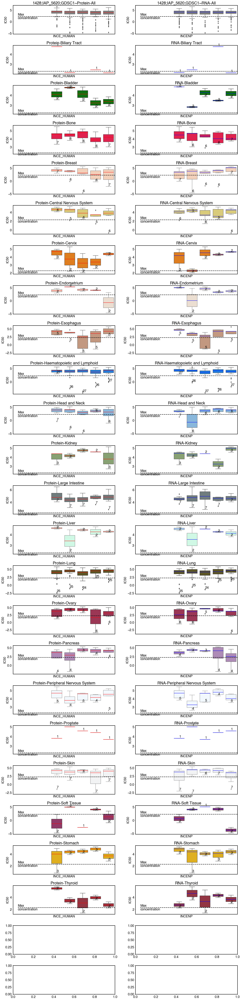

In [298]:
drug_id = '1428;IAP_5620;GDSC1'
protein = 'INCE_HUMAN'
plot_drug_scatter(drug_df, protein_ruv, rna_sample, drug_id, protein)
plot_drug_box(drug_df, protein_ruv, rna_sample, drug_id, protein, step=0.2)

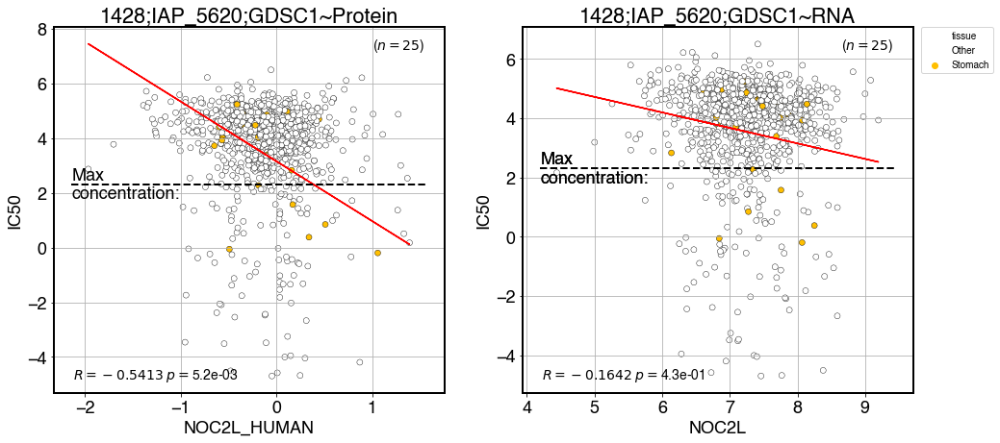

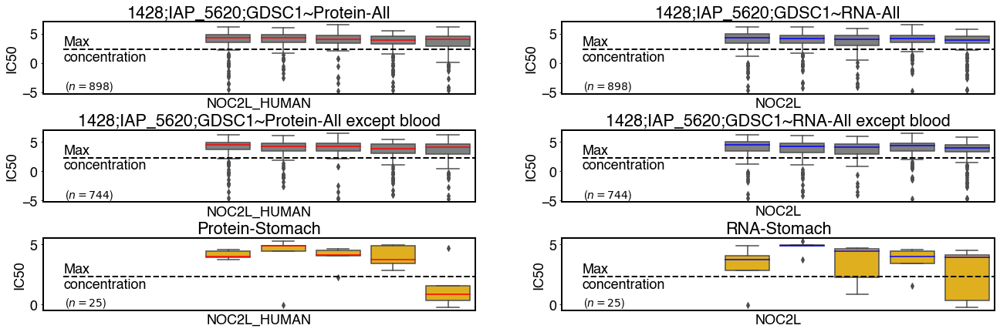

In [47]:
drug_id = '1428;IAP_5620;GDSC1'
protein = 'NOC2L_HUMAN'
plot_drug_scatter(drug_df, protein_ruv, rna_sample, drug_id, protein, tissues=['Stomach'])
plot_drug_box(drug_df, protein_ruv, rna_sample, drug_id, protein, step=0.2, tissues=['Stomach'], write_df=True)

## 1909;Venetoclax;GDSC2

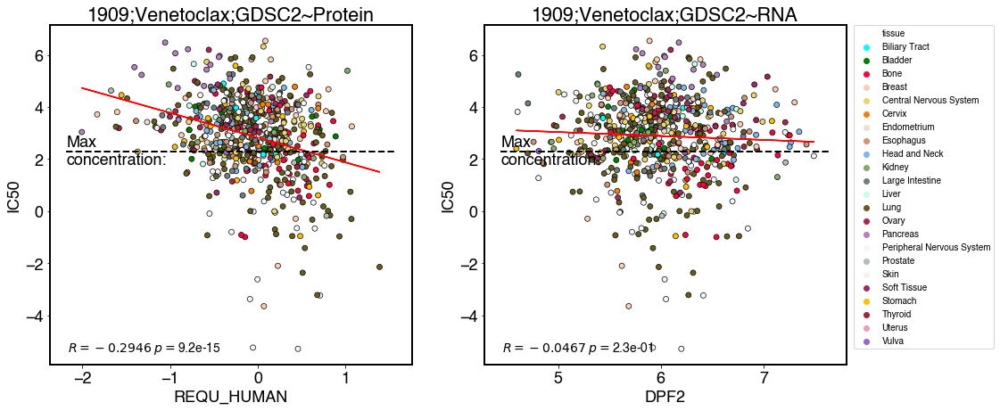

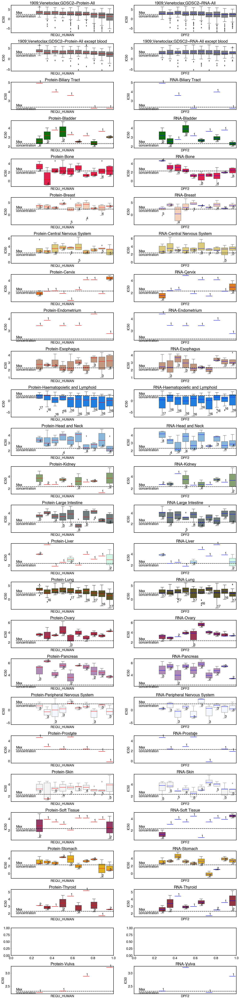

In [334]:
drug_id = '1909;Venetoclax;GDSC2'
protein = 'REQU_HUMAN'
plot_drug_scatter(drug_df, protein_ruv, rna_sample, drug_id, protein, noblood=True)
plot_drug_box(drug_df, protein_ruv, rna_sample, drug_id, protein, step=0.1)

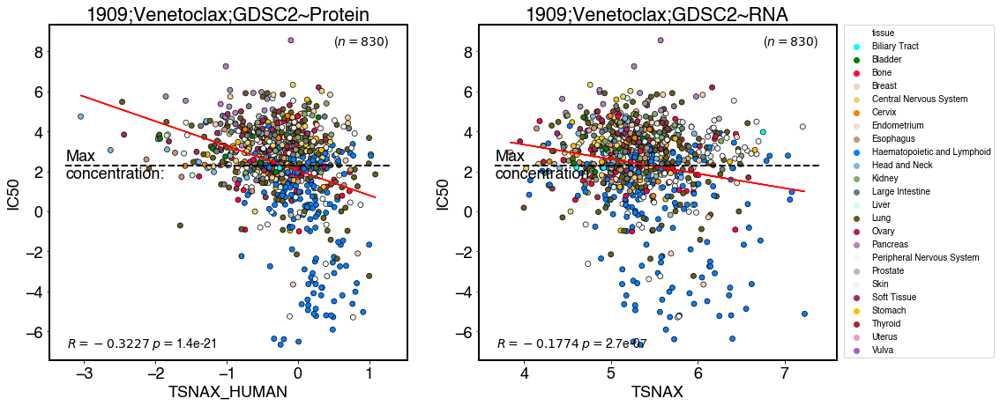

In [43]:
drug_id = '1909;Venetoclax;GDSC2'
protein = 'TSNAX_HUMAN'
plot_drug_scatter(drug_df, protein_ruv, rna_sample, drug_id, protein)

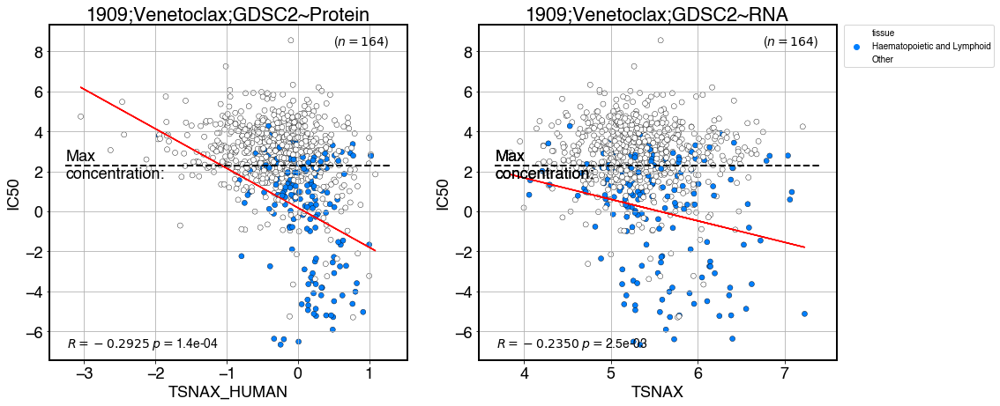

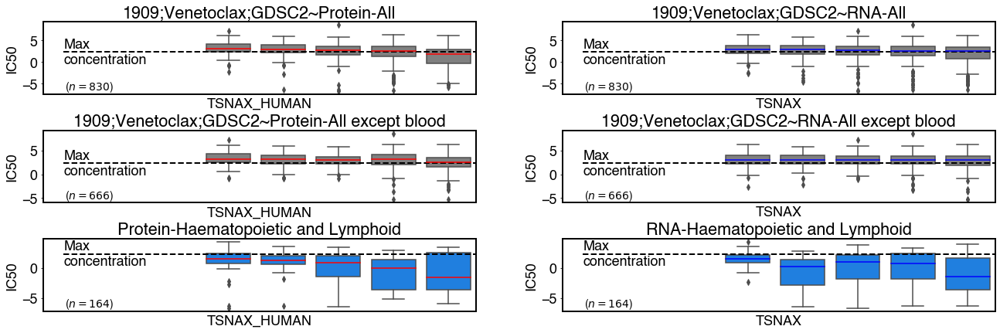

In [48]:
drug_id = '1909;Venetoclax;GDSC2'
protein = 'TSNAX_HUMAN'
plot_drug_scatter(drug_df,
                  protein_ruv,
                  rna_sample,
                  drug_id,
                  protein,
                  tissues=['Haematopoietic and Lymphoid'])
plot_drug_box(drug_df,
              protein_ruv,
              rna_sample,
              drug_id,
              protein,
              step=0.2,
              tissues=['Haematopoietic and Lymphoid'],
              write_df=True)

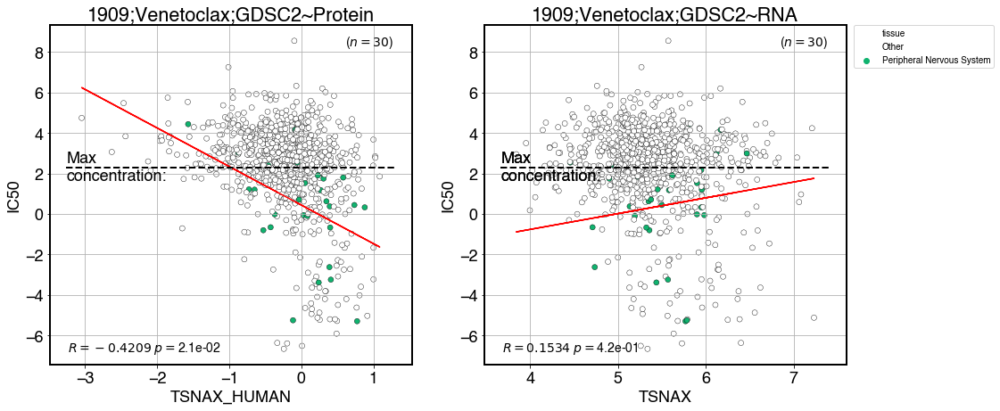

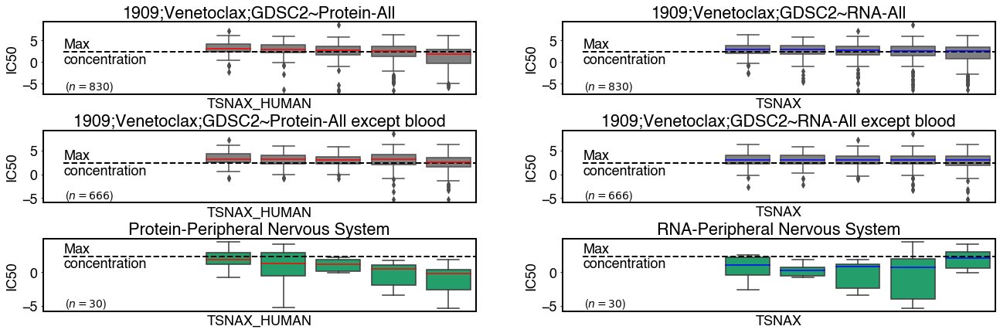

In [49]:
drug_id = '1909;Venetoclax;GDSC2'
protein = 'TSNAX_HUMAN'
plot_drug_scatter(drug_df, protein_ruv, rna_sample, drug_id, protein, tissues=['Peripheral Nervous System'])
plot_drug_box(drug_df, protein_ruv, rna_sample, drug_id, protein, step=0.2, tissues=['Peripheral Nervous System'], write_df=True)

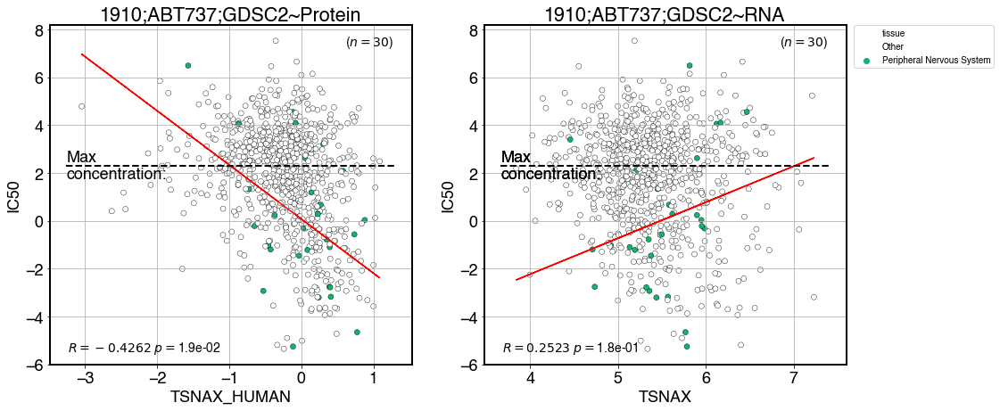

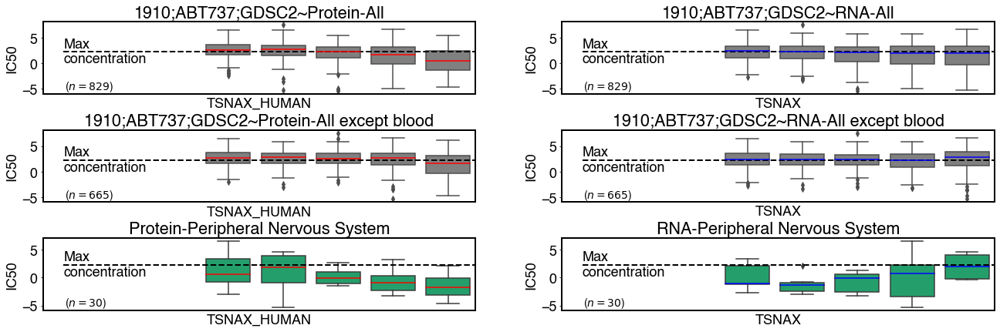

In [50]:
drug_id = '1910;ABT737;GDSC2'
protein = 'TSNAX_HUMAN'
plot_drug_scatter(drug_df, protein_ruv, rna_sample, drug_id, protein, tissues=['Peripheral Nervous System'])
plot_drug_box(drug_df, protein_ruv, rna_sample, drug_id, protein, step=0.2, tissues=['Peripheral Nervous System'], write_df=True)

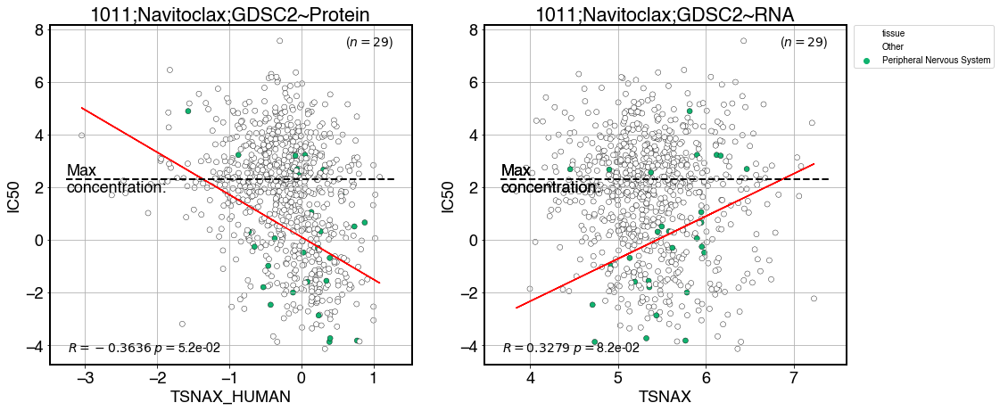

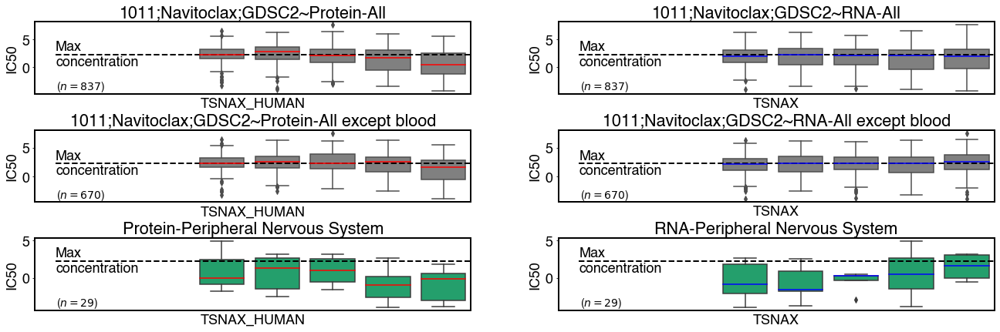

In [51]:
drug_id = '1011;Navitoclax;GDSC2'
protein = 'TSNAX_HUMAN'
plot_drug_scatter(drug_df, protein_ruv, rna_sample, drug_id, protein, tissues=['Peripheral Nervous System'])
plot_drug_box(drug_df, protein_ruv, rna_sample, drug_id, protein, step=0.2, tissues=['Peripheral Nervous System'], write_df=True)

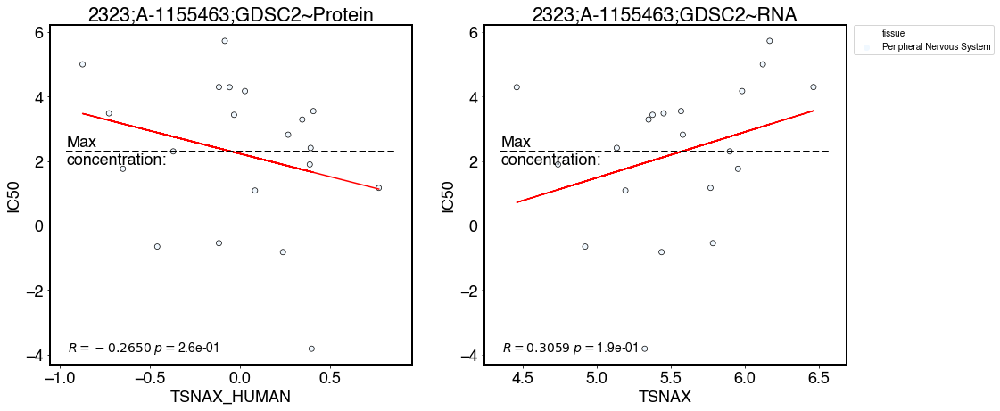

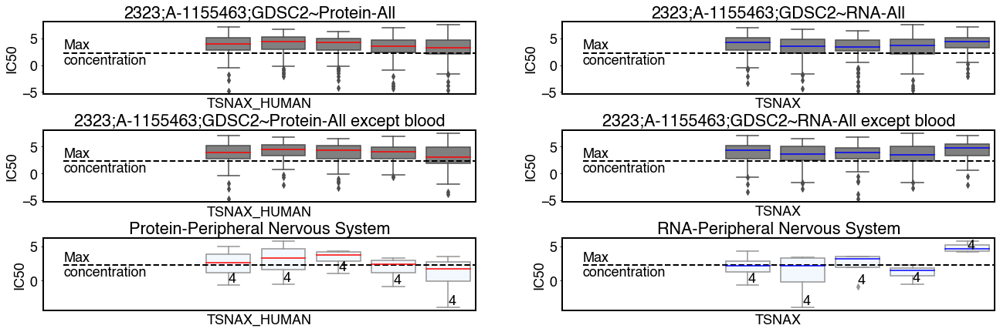

In [24]:
drug_id = '2323;A-1155463;GDSC2'
protein = 'TSNAX_HUMAN'
plot_drug_scatter(drug_df, protein_ruv, rna_sample, drug_id, protein, tissues=['Peripheral Nervous System'])
plot_drug_box(drug_df, protein_ruv, rna_sample, drug_id, protein, step=0.2, tissues=['Peripheral Nervous System'])

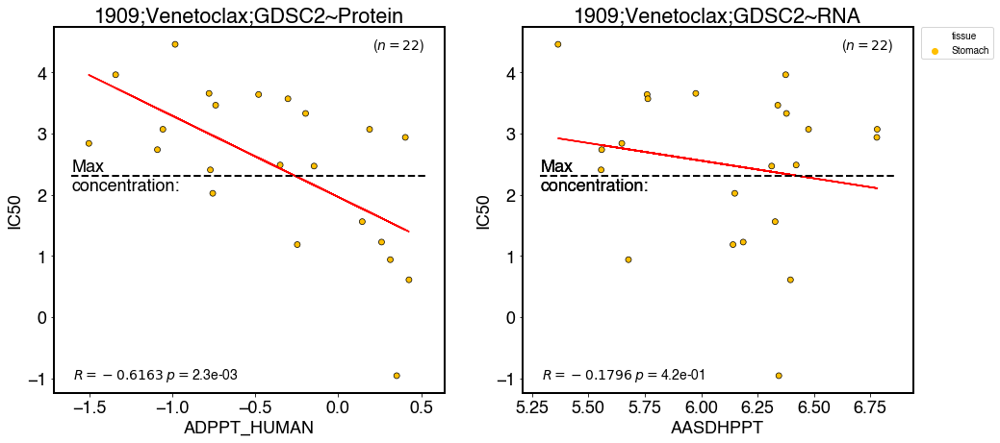

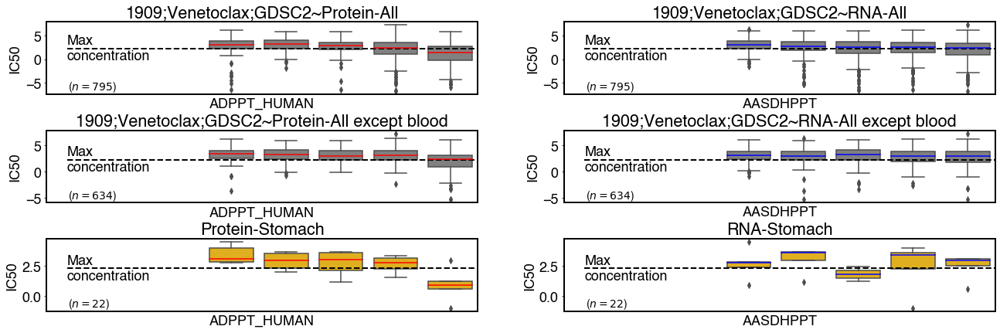

In [145]:
drug_id = '1909;Venetoclax;GDSC2'
protein = 'ADPPT_HUMAN'
plot_drug_scatter(drug_df, protein_ruv, rna_sample, drug_id, protein, tissues=['Stomach'])
plot_drug_box(drug_df, protein_ruv, rna_sample, drug_id, protein, step=0.2, tissues=['Stomach'])

## 2354;MCL1_8070;GDSC2

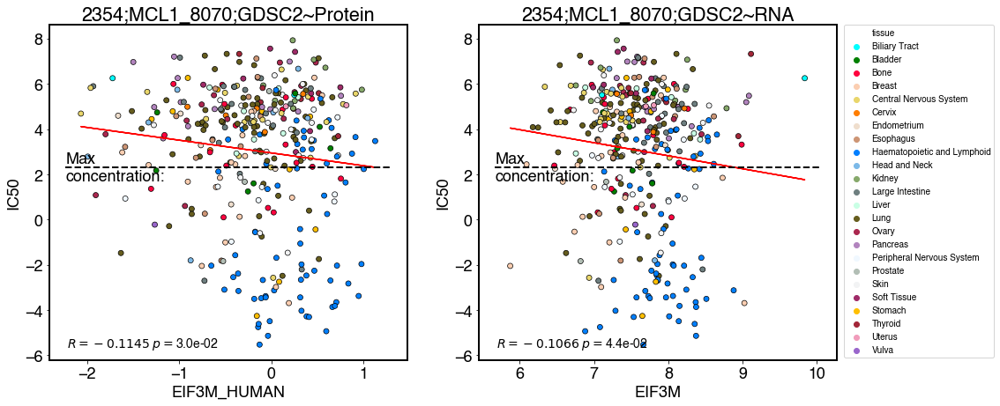

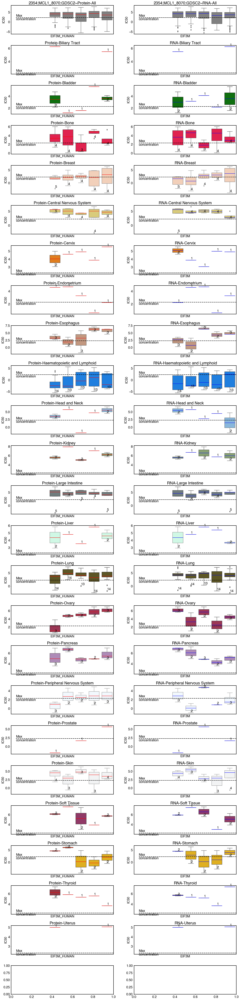

In [244]:
drug_id = '2354;MCL1_8070;GDSC2'
protein = 'EIF3M_HUMAN'
plot_drug_scatter(drug_df, protein_ruv, rna_sample, drug_id, protein)
plot_drug_box(drug_df, protein_ruv, rna_sample, drug_id, protein, step=0.2)

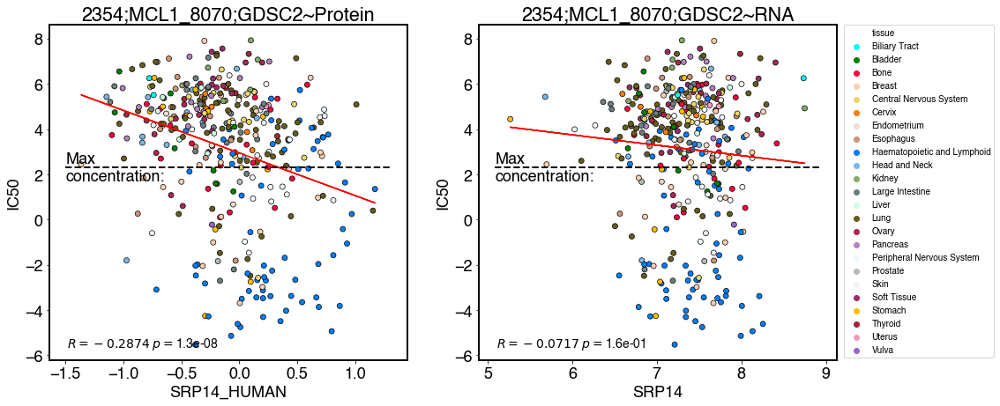

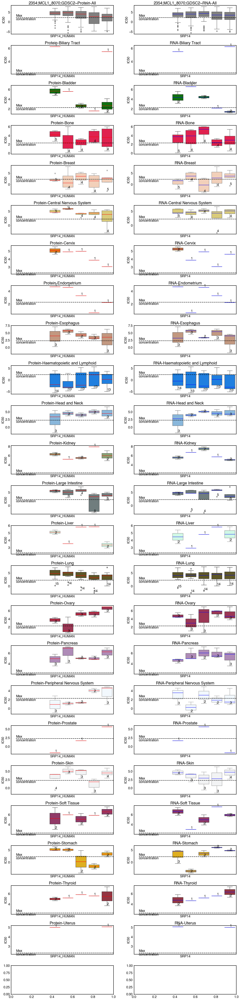

In [253]:
drug_id = '2354;MCL1_8070;GDSC2'
protein = 'SRP14_HUMAN'
plot_drug_scatter(drug_df, protein_ruv, rna_sample, drug_id, protein)
plot_drug_box(drug_df, protein_ruv, rna_sample, drug_id, protein, step=0.2)

## 56;WH-4-023;GDSC1

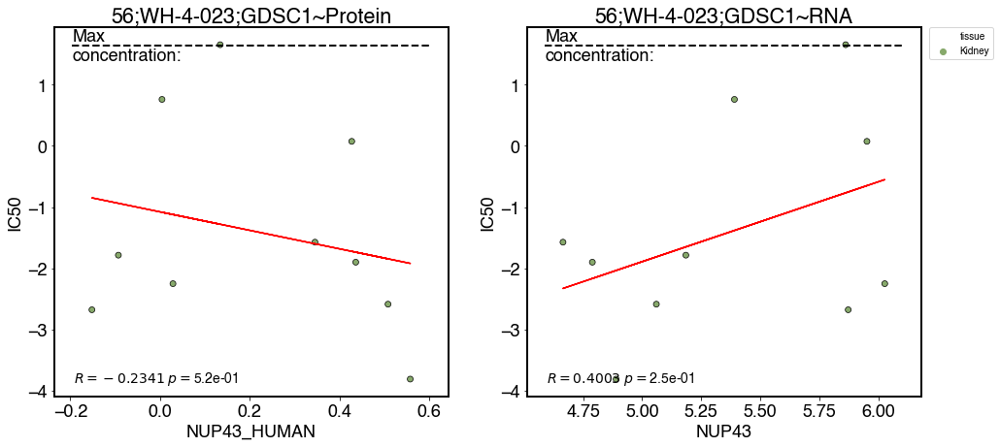

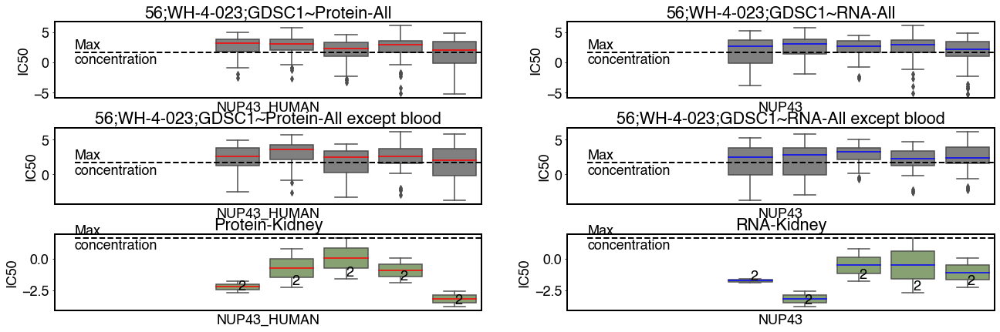

In [367]:
drug_id = '56;WH-4-023;GDSC1'
protein = 'NUP43_HUMAN'
plot_drug_scatter(drug_df, protein_ruv, rna_sample, drug_id, protein, tissues=['Kidney'])
plot_drug_box(drug_df, protein_ruv, rna_sample, drug_id, protein, step=0.2, tissues=['Kidney'])

## 1997;WEHI-539;GDSC2

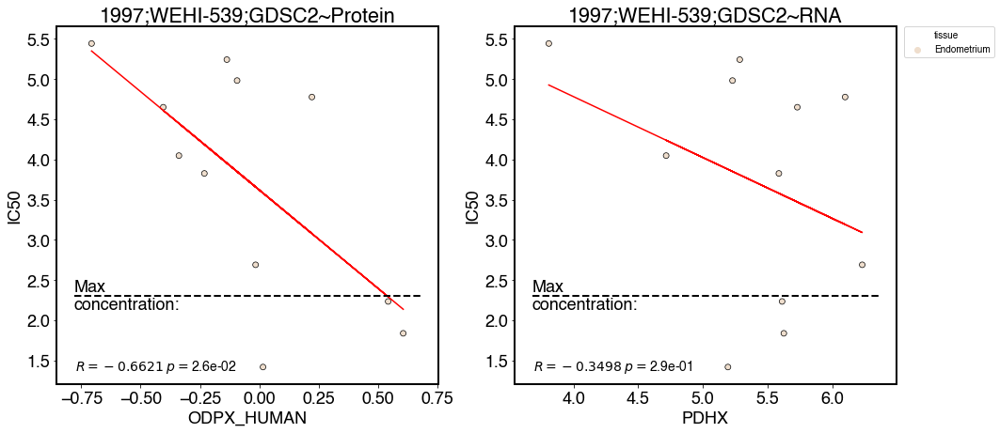

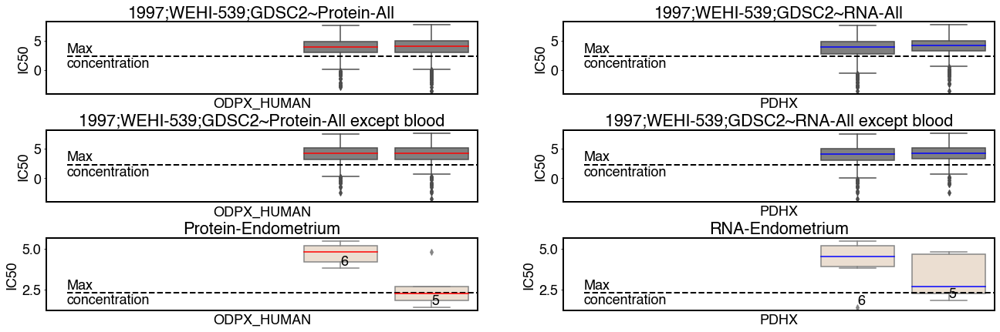

In [383]:
drug_id = '1997;WEHI-539;GDSC2'
protein = 'ODPX_HUMAN'
plot_drug_scatter(drug_df, protein_ruv, rna_sample, drug_id, protein, tissues=['Endometrium'])
plot_drug_box(drug_df, protein_ruv, rna_sample, drug_id, protein, step=0.5, tissues=['Endometrium'])

## 427;Ara-G;GDSC1

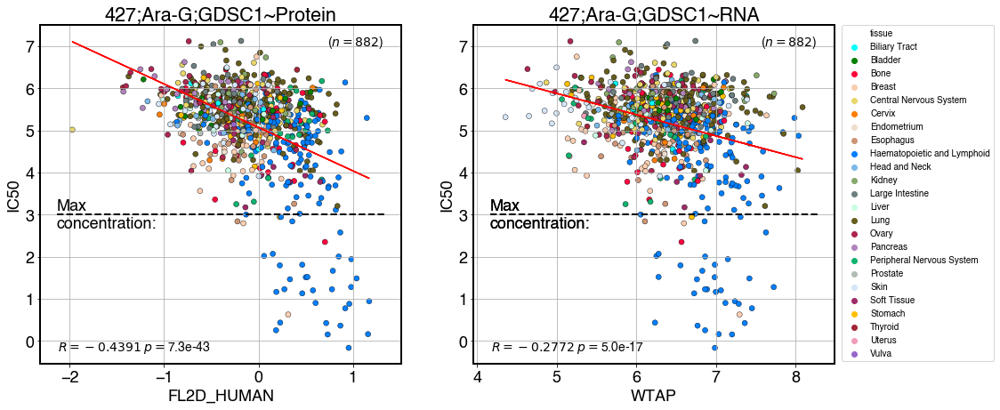

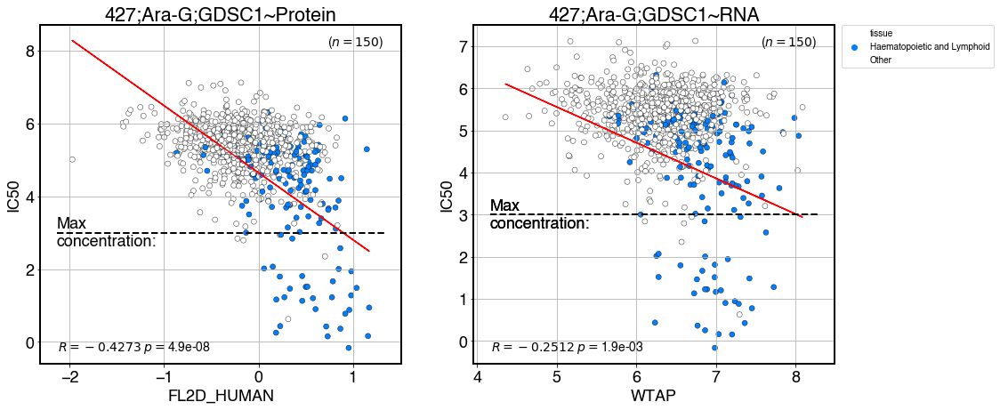

In [82]:
drug_id = '427;Ara-G;GDSC1'
protein = 'FL2D_HUMAN'
plot_drug_scatter(drug_df,
                  protein_ruv,
                  rna_sample,
                  drug_id,
                  protein)
plot_drug_scatter(drug_df,
                  protein_ruv,
                  rna_sample,
                  drug_id,
                  protein, tissues=['Haematopoietic and Lymphoid'])

## 1936;Savolitinib;GDSC2

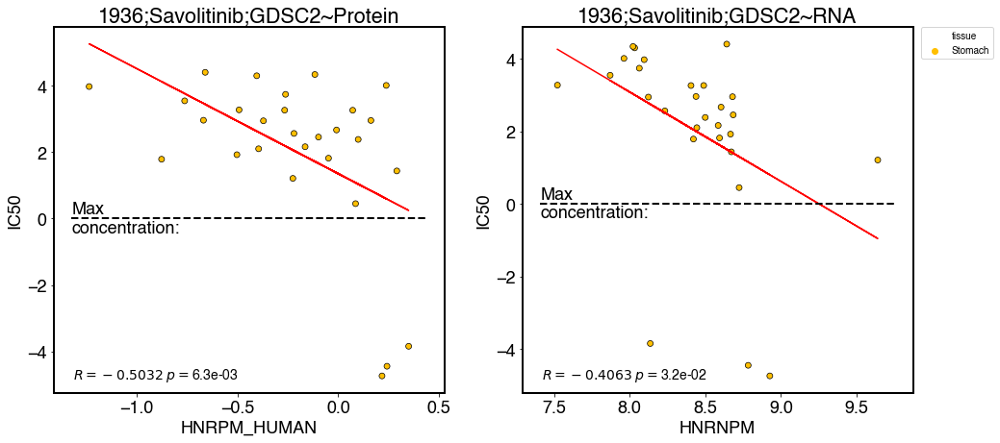

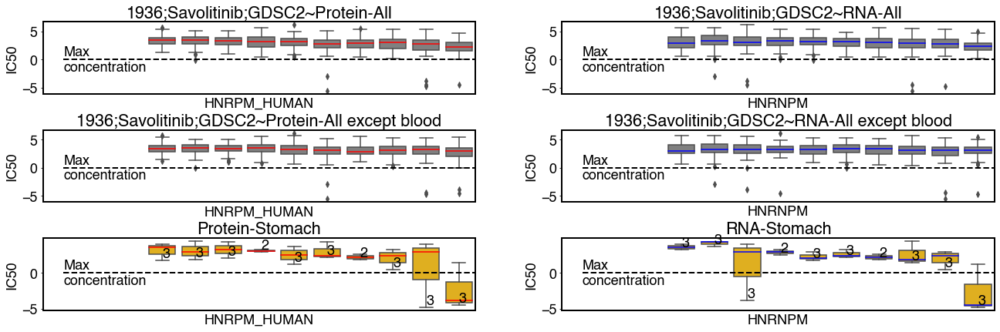

In [405]:
drug_id = '1936;Savolitinib;GDSC2'
protein = 'HNRPM_HUMAN'
plot_drug_scatter(drug_df, protein_ruv, rna_sample, drug_id, protein, tissues=['Stomach'])
plot_drug_box(drug_df, protein_ruv, rna_sample, drug_id, protein, step=0.1, tissues=['Stomach'])

## other

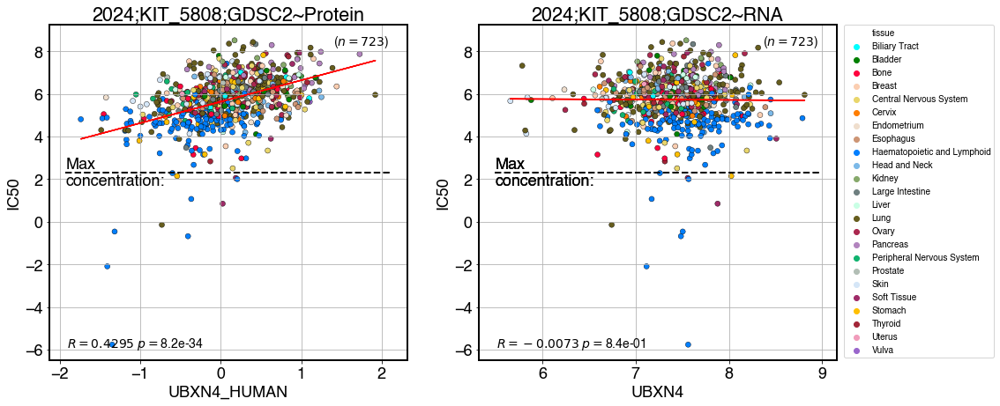

In [85]:
drug_id = '2024;KIT_5808;GDSC2'
protein = 'UBXN4_HUMAN'
plot_drug_scatter(drug_df, protein_ruv, rna_sample, drug_id, protein)
# plot_drug_box(drug_df, protein_ruv, rna_sample, drug_id, protein)

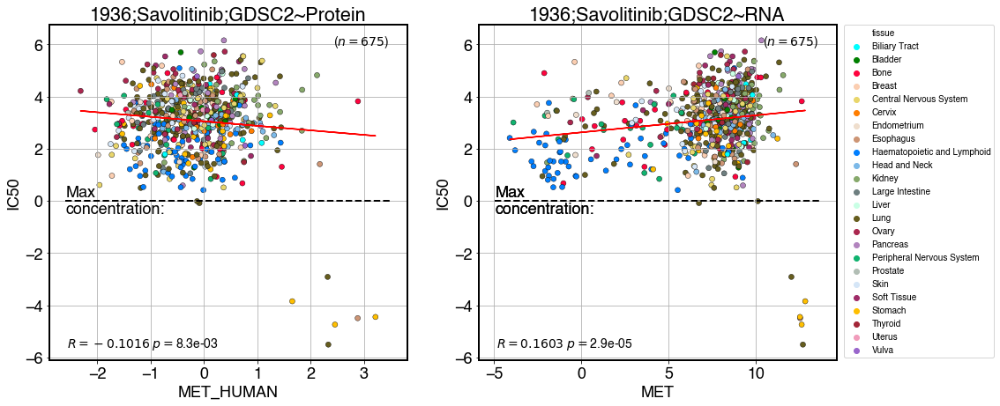

In [100]:
drug_id = '1936;Savolitinib;GDSC2'
protein = 'MET_HUMAN'
plot_drug_scatter(drug_df, protein_ruv, rna_sample, drug_id, protein)
# plot_drug_box(drug_df, protein_ruv, rna_sample, drug_id, protein)

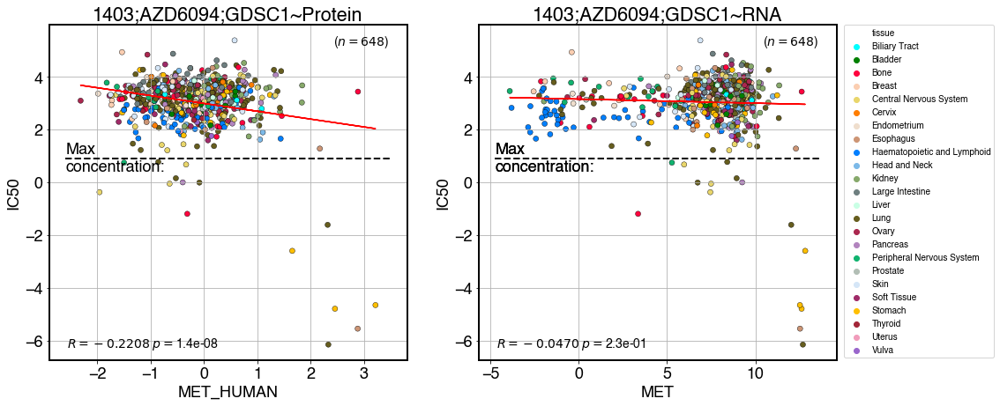

In [101]:
drug_id = '1403;AZD6094;GDSC1'
protein = 'MET_HUMAN'
plot_drug_scatter(drug_df, protein_ruv, rna_sample, drug_id, protein)
# plot_drug_box(drug_df, protein_ruv, rna_sample, drug_id, protein)

# broad drug scatter

In [50]:
name_map = pd.read_csv("../../data/misc/HUMAN_9606_idmapping.gene_prot.dat",
                       sep='\t',
                       names=['ID', 'type', 'code'])
name_map = name_map.drop_duplicates(['ID', 'type'])
name_map = pd.pivot(name_map, index='ID', columns='type', values='code').dropna()

protein2rna_map = dict(zip(name_map['UniProtKB-ID'].values, name_map['Gene_Name'].values))
rna2protein_map = {v: k for k, v in protein2rna_map.items()}

In [60]:
rna_raw = pd.read_csv("../../data/rna/rnaseq_voom.csv", index_col=0).T

rna_raw.index.name = 'SIDM'

rna_raw = rna_raw.reset_index()
rna_sample = pd.merge(rna_raw,
                      meta[['SIDM',
                            'Cell_line']].drop_duplicates()).drop(['SIDM'],
                                                                  axis=1)

rna_sample = rna_sample.set_index(['Cell_line'])

In [51]:
broad = pd.read_csv("../../data/ccle/ccle_proteins_sanger_name.csv").set_index("Cell_line")

In [25]:
rna_sample.head()

,TSPAN6,DPM1,SCYL3,C1orf112,FGR,CFH,FUCA2,GCLC,NFYA,STPG1,...,ACACA,C11orf98,MRM1,GOLGA6L10,HIST1H3H,MRPL45,GATD3B,PLAC4,CCDC163,PAGR1
Cell_line,,,,,,,,,,,,,,,,,,,,,
K052,-1.27527,5.01503,4.58542,4.45547,3.59901,1.13172,5.65580,6.57655,5.87966,3.62667,...,7.40140,1.82173,4.42252,1.49975,0.97053,6.09167,3.68849,-2.07233,1.77251,3.06151
TE-12,5.70559,6.93650,3.51628,4.39279,-3.90730,4.12655,5.30001,6.73129,4.72768,3.21419,...,7.34533,3.00983,3.85717,1.84644,0.53166,5.19568,-1.22266,-3.24059,1.63298,3.46489
TMK-1,4.24676,6.44455,4.02797,3.61819,-6.41733,-6.59562,7.68720,8.54728,5.47456,3.66080,...,8.43746,3.92796,4.37177,0.90634,2.44409,6.56628,-0.33576,0.53924,1.10227,3.46377
STS-0421,5.50714,5.54910,4.05800,4.73187,-3.91667,-3.85582,6.86097,5.21495,5.10757,3.65476,...,7.49401,1.85396,2.45988,-0.74090,0.03522,5.22673,2.17018,-4.34342,1.34331,3.23586
PL4,6.03030,6.12014,4.38692,4.28353,-1.97649,4.90237,6.74490,5.85968,5.36157,2.67936,...,8.17462,2.17985,3.63591,2.61846,1.17932,5.35929,3.31014,-3.01413,0.27643,2.23969


In [55]:
drug_df = pd.read_csv('../../data/drug/drug_final_processed_eg_id.csv.gz', low_memory=False)

In [56]:
drug_df['max_screening_conc_ln'] = drug_df['max_screening_conc'].map(np.log)

In [57]:
max_conc_map = drug_df[[
    'drug_id', 'max_screening_conc_ln'
]].drop_duplicates().set_index('drug_id').to_dict()['max_screening_conc_ln']

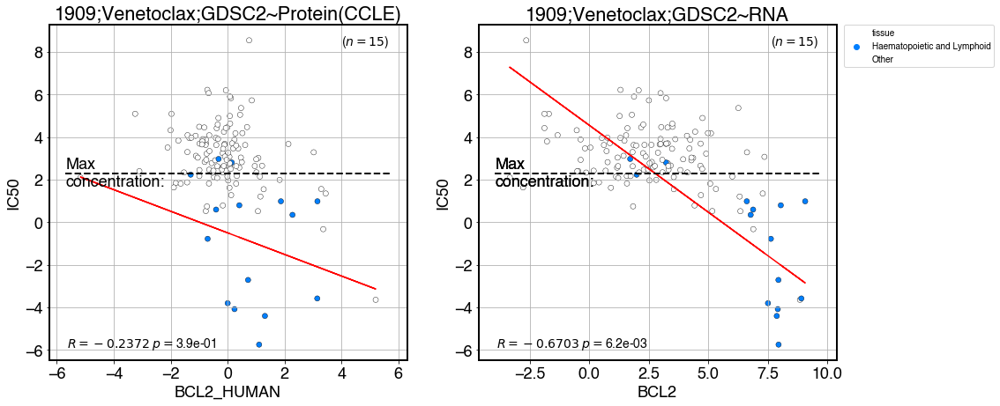

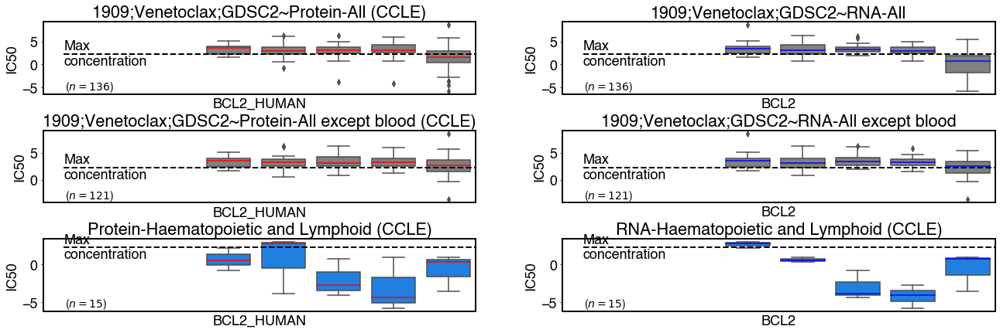

In [81]:
drug_id = '1909;Venetoclax;GDSC2'
protein = 'BCL2_HUMAN'
plot_drug_scatter(drug_df,
                  broad,
                  rna_sample,
                  drug_id,
                  protein,
                  source='ccle',
                  tissues=['Haematopoietic and Lymphoid'])
plot_drug_box(drug_df,
              broad,
              rna_sample,
              drug_id,
              protein,
              step=0.2,
              source='ccle',
              tissues=['Haematopoietic and Lymphoid'])

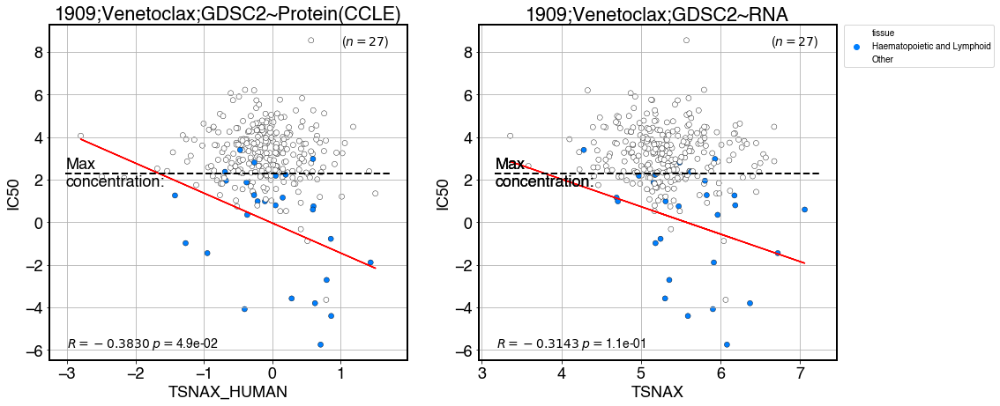

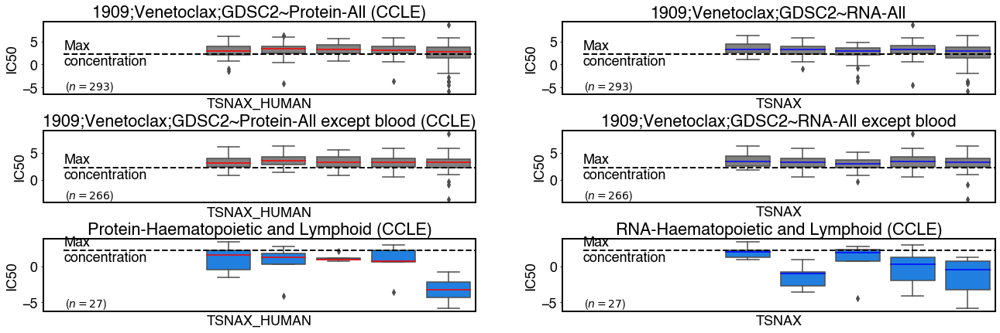

In [82]:
drug_id = '1909;Venetoclax;GDSC2'
protein = 'TSNAX_HUMAN'
plot_drug_scatter(drug_df,
                  broad,
                  rna_sample,
                  drug_id,
                  protein,source='ccle',
                  tissues=['Haematopoietic and Lymphoid'])
plot_drug_box(drug_df,
              broad,
              rna_sample,
              drug_id,
              protein,
              step=0.2,source='ccle',
              tissues=['Haematopoietic and Lymphoid'])

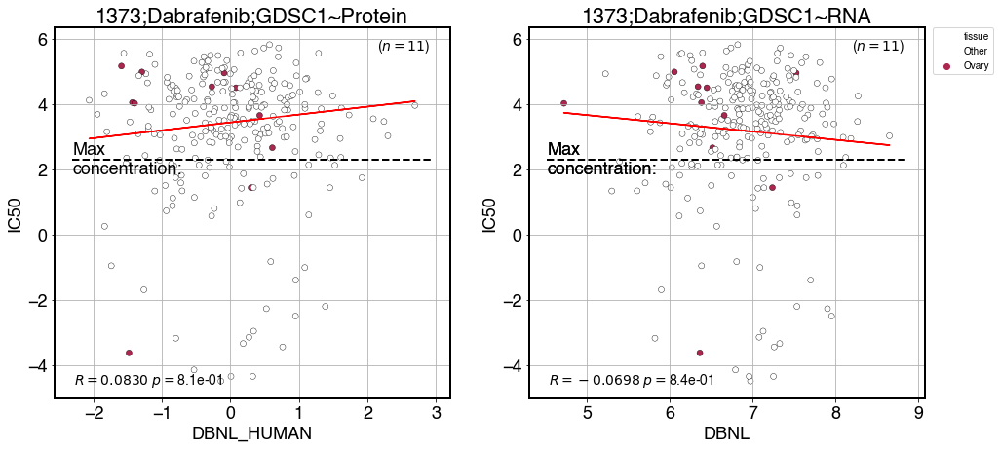

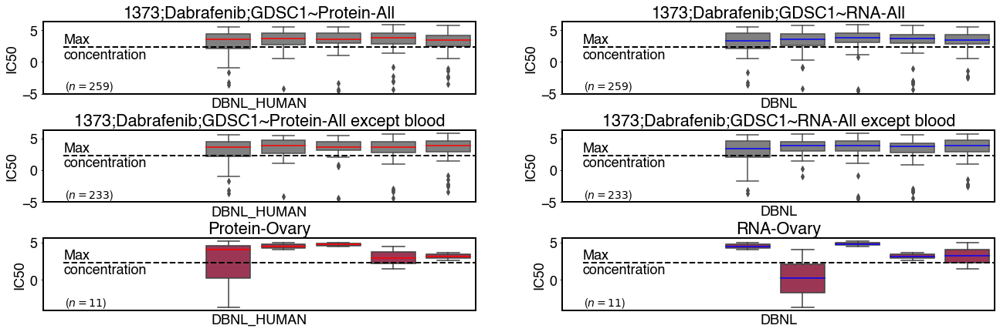

In [84]:
drug_id = '1373;Dabrafenib;GDSC1'
protein = 'DBNL_HUMAN'
plot_drug_scatter(drug_df, broad, rna_sample, drug_id, protein, tissues=['Ovary'])
plot_drug_box(drug_df, broad, rna_sample, drug_id, protein,step=0.2, tissues=['Ovary'])

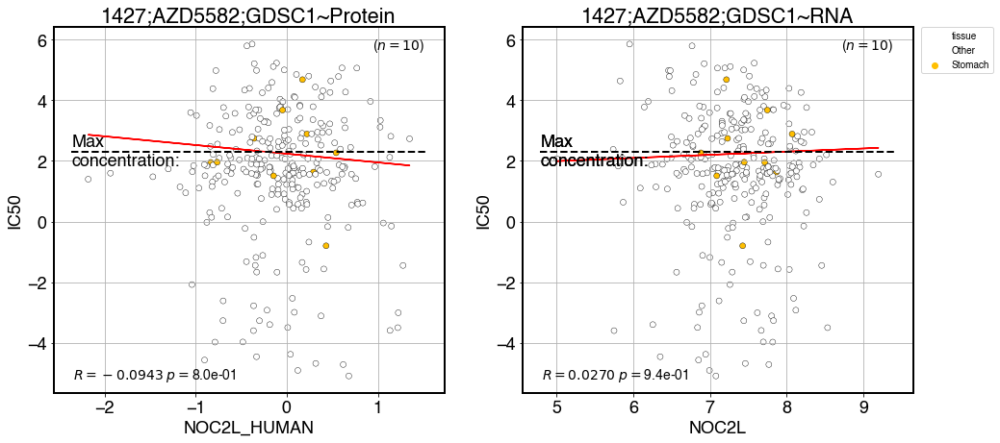

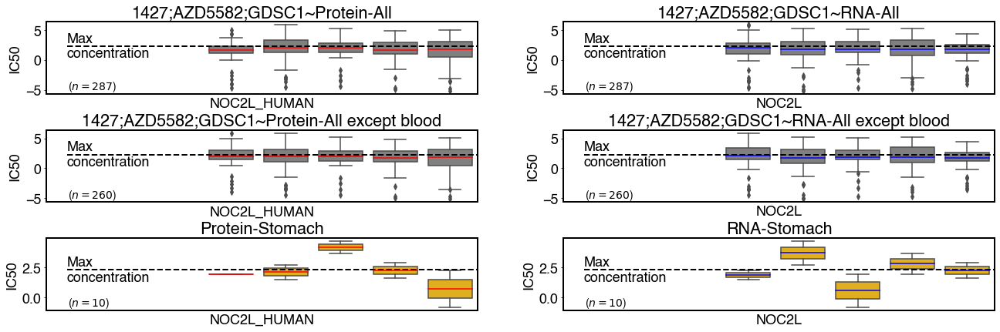

In [86]:
drug_id = '1427;AZD5582;GDSC1'
protein = 'NOC2L_HUMAN'
plot_drug_scatter(drug_df, broad, rna_sample, drug_id, protein, tissues=['Stomach'])
plot_drug_box(drug_df, broad, rna_sample, drug_id, protein, step=0.2, tissues=['Stomach'])

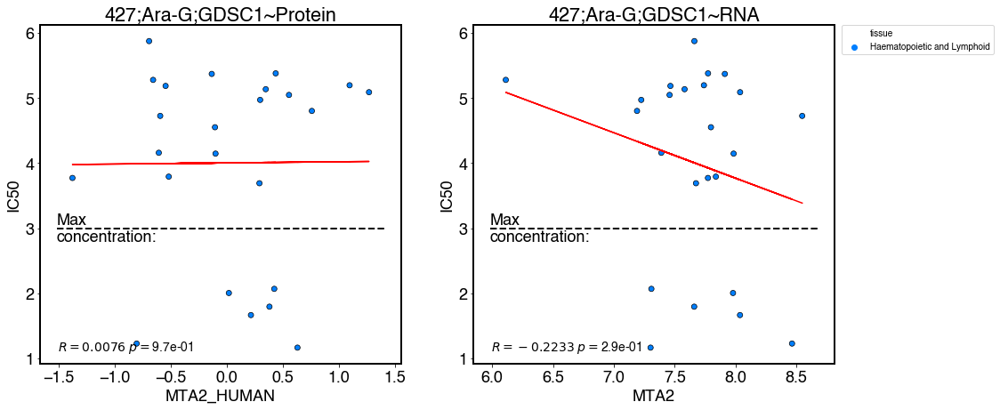

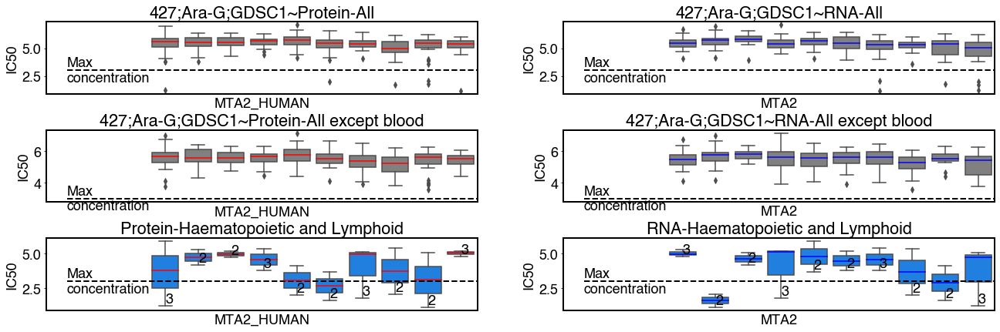

In [399]:
drug_id = '427;Ara-G;GDSC1'
protein = 'MTA2_HUMAN'
plot_drug_scatter(drug_df, broad, rna_sample, drug_id, protein, tissues=['Haematopoietic and Lymphoid'])
plot_drug_box(drug_df, broad, rna_sample, drug_id, protein, step=0.1, tissues=['Haematopoietic and Lymphoid'])